In [4]:
import numpy as np
import pandas as pd
import os
import cv2
import math
import random
import matplotlib.pyplot as plt
import shutil
from sklearn.preprocessing import QuantileTransformer
from PIL import Image
import warnings
import tensorflow as tf
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader, random_split
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from lime import lime_image
from skimage.segmentation import mark_boundaries
warnings.filterwarnings("ignore")

In [43]:
import glob
train_0 = glob.glob('/train_224/0/*.*')
train_1 = glob.glob('/train_224/1/*.*')
train_2 = glob.glob('/train_224/2/*.*')
train_3 = glob.glob('/train_224/3/*.*')
train_4 = glob.glob('/train_224/4/*.*')
train_5 = glob.glob('/train_224/5/*.*')
train_6 = glob.glob('/train_224/6/*.*')
train_7 = glob.glob('/train_224/7/*.*')
train_8 = glob.glob('/train_224/8/*.*')
train_9 = glob.glob('/train_224/9/*.*')

In [44]:
import glob
test_0 = glob.glob('/test_224/0/*.*')
test_1 = glob.glob('test_224/1/*.*')
test_2 = glob.glob('/test_224/2/*.*')
test_3 = glob.glob('/test_224/3/*.*')
test_4 = glob.glob('/test_224/4/*.*')
test_5 = glob.glob('/test_224/5/*.*')
test_6 = glob.glob('/test_224/6/*.*')
test_7 = glob.glob('/test_224/7/*.*')
test_8 = glob.glob('/test_224/8/*.*')
test_9 = glob.glob('/test_224/9/*.*')

In [45]:
train_data = []
train_labels = []

for i in train_0:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(0)
for i in train_1:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(1)
for i in train_2:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(2)
for i in train_3:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(3)
for i in train_4:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(4)
for i in train_5:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(5)
for i in train_6:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(6)
for i in train_7:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(7)
for i in train_8:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(8)
for i in train_9:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    train_data.append(image)
    train_labels.append(9)

In [46]:
X_train = np.array(train_data)
y_train = np.array(train_labels)

In [47]:
y_train

array([0, 0, 0, ..., 9, 9, 9])

In [48]:
test_data = []
test_labels = []

for i in test_0:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(0)
for i in test_1:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(1)
for i in test_2:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(2)
for i in test_3:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(3)
for i in test_4:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(4)
for i in test_5:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(5)
for i in test_6:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(6)
for i in test_7:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(7)
for i in test_8:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(8)
for i in test_9:
    image=tf.keras.preprocessing.image.load_img(i, color_mode='rgb',
    target_size= (128,128))
    image=np.array(image)
    test_data.append(image)
    test_labels.append(9)

In [49]:
X_test = np.array(test_data)
y_test = np.array(test_labels)

In [50]:
y_test

array([0, 0, 0, ..., 8, 8, 9])

In [51]:
num_classes = 10
input_shape = (128, 128, 3)

x_train = X_train
x_test = X_test
y_train = y_train
y_test = y_test

print(f"x_train shape: {x_train.shape} - y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape} - y_test shape: {y_test.shape}")

x_train shape: (110337, 128, 128, 3) - y_train shape: (110337,)
x_test shape: (27584, 128, 128, 3) - y_test shape: (27584,)


In [52]:
# Define the custom dataset class
class CustomDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        sample = self.X[idx]
        target = self.y[idx]
        if self.transform:
            sample = self.transform(sample)
        return sample, target

# Define your transform function
transform = transforms.Compose([
    transforms.ToTensor(),
    # Add other transforms here if needed
])
# Create datasets
train_dataset = CustomDataset(x_train, y_train, transform=transform)
test_dataset = CustomDataset(x_test, y_test, transform=transform)

In [53]:
# Collect all labels from the dataset
labels = []
for _, label in train_dataset:
    labels.append(label)

# Convert to a set to get unique labels
unique_labels = set(labels)

print("Unique labels in train_dataset:", unique_labels)

Unique labels in train_dataset: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9}


In [54]:
len(train_dataset)

110337

In [55]:
# Compute sizes for the split
total_size = len(train_dataset)
train_size = int(total_size * 0.83)
dev_size = total_size - train_size  # Ensure that the sizes sum up to the total size

# Print sizes to verify
print(f"Total dataset size: {total_size}")
print(f"Training dataset size: {train_size}")
print(f"Development dataset size: {dev_size}")

Total dataset size: 110337
Training dataset size: 91579
Development dataset size: 18758


In [56]:
# Split the dataset
# Define your transform function
transform = transforms.Compose([
    transforms.ToTensor(),
    # Add other transforms here if needed
])
# Create datasets
train_dataset = CustomDataset(x_train, y_train, transform=transform)
test_dataset = CustomDataset(x_test, y_test, transform=transform)
train_dataset, dev_dataset = random_split(train_dataset, [train_size, dev_size])

In [57]:
total_train_size = len(train_dataset)
total_test_size = len(test_dataset)
total_dev_size = len(dev_dataset)

classes = 10
input_dim = (128, 128, 3)
batch_size = 128
epochs_per_client = 3
learning_rate = 2e-2

In [58]:
print(f"Training dataset size: {total_train_size}")
print(f"Testing dataset size: {total_test_size}")
print(f"Development dataset size: {total_dev_size}")

Training dataset size: 91579
Testing dataset size: 27584
Development dataset size: 18758


In [59]:
# Utility Functions
def get_device():
    return torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader(DataLoader):
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for batch in self.dl:
            yield to_device(batch, self.device)

    def __len__(self):
        return len(self.dl)

device = get_device()

In [67]:
# ResNet-like Model
class ResidualBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = torch.nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        self.conv2 = torch.nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.shortcut = torch.nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = torch.nn.Sequential(
                torch.nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride),
            )

    def forward(self, x):
        out = F.relu(self.conv1(x))
        out = self.conv2(out)
        out += self.shortcut(x)
        out = F.relu(out)
        return out



class FederatedResNet(torch.nn.Module):
    def __init__(self):
        super(FederatedResNet, self).__init__()
        self.conv1 = torch.nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.res_block1 = ResidualBlock(16, 32, stride=2)
        self.res_block2 = ResidualBlock(32, 64, stride=2)
        self.maxpool = torch.nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = torch.nn.Flatten()
        self.linear = torch.nn.Linear(16*16*64, 10)
        self.track_layers = {
            'conv1': self.conv1, 
            'res_block1_conv1': self.res_block1.conv1,
            'res_block1_conv2': self.res_block1.conv2,
            'res_block2_conv1': self.res_block2.conv1,
            'res_block2_conv2': self.res_block2.conv2,
            'shortcut_res_block1': self.res_block1.shortcut[0] if len(self.res_block1.shortcut) > 0 else None,
            'shortcut_res_block2': self.res_block2.shortcut[0] if len(self.res_block2.shortcut) > 0 else None,
            'linear': self.linear
        }

    def forward(self, x):
        out = F.relu(self.conv1(x))
        out = self.res_block1(out)
        out = self.res_block2(out)
        out = self.maxpool(out)
        out = self.flatten(out)
        out = self.linear(out)
        return out

    def get_parameters(self):
        parameters_dict = {}
        for layer_name, layer in self.track_layers.items():
            if layer is not None:
                parameters_dict[layer_name] = {
                    'weight': layer.weight.data, 
                    'bias': layer.bias.data
                }
        return parameters_dict
    
    def apply_parameters(self, parameters_dict):
        with torch.no_grad():
            for layer_name, params in parameters_dict.items():
                if layer_name in self.track_layers and self.track_layers[layer_name] is not None:
                    self.track_layers[layer_name].weight.data.copy_(params['weight'])
                    self.track_layers[layer_name].bias.data.copy_(params['bias'])
    
    def batch_accuracy(self, outputs, labels):
        with torch.no_grad():
            _, predictions = torch.max(outputs, dim=1)
            return torch.tensor(torch.sum(predictions == labels).item() / len(predictions))
    
    def _process_batch(self, batch):
        images, labels = batch
        outputs = self(images)
        loss = F.cross_entropy(outputs, labels)
        accuracy = self.batch_accuracy(outputs, labels)
        return (loss, accuracy)
    
    def fit(self, dataset, epochs, lr, batch_size=128, opt=torch.optim.SGD):
        dataloader = DeviceDataLoader(DataLoader(dataset, batch_size, shuffle=True), device)
        optimizer = opt(self.parameters(), lr)
        history = []
        for epoch in range(epochs):
            losses = []
            accs = []
            for batch in dataloader:
                loss, acc = self._process_batch(batch)
                loss.backward()
                optimizer.step()
                optimizer.zero_grad()
                losses.append(loss)
                accs.append(acc)
            avg_loss = torch.stack(losses).mean().item()
            avg_acc = torch.stack(accs).mean().item()
            history.append((avg_loss, avg_acc))
        return history
    
    def evaluate(self, dataset, batch_size=128):
        dataloader = DeviceDataLoader(DataLoader(dataset, batch_size), device)
        losses = []
        accs = []
        all_labels = []
        all_preds = []
        with torch.no_grad():
            for batch in dataloader:
                images, labels = batch
                outputs = self(images)
                loss = F.cross_entropy(outputs, labels)
                accuracy = self.batch_accuracy(outputs, labels)
                
                # Collect true labels and predictions
                _, predictions = torch.max(outputs, dim=1)
                all_labels.extend(labels.cpu().numpy())
                all_preds.extend(predictions.cpu().numpy())
                
                losses.append(loss)
                accs.append(accuracy)
        avg_loss = torch.stack(losses).mean().item()
        avg_acc = torch.stack(accs).mean().item()
        return avg_loss, avg_acc, np.array(all_labels), np.array(all_preds)

In [69]:
# Client Class
class Client:
    def __init__(self, client_id, dataset):
        self.client_id = client_id
        self.dataset = dataset
    
    def get_dataset_size(self):
        return len(self.dataset)
    
    def get_client_id(self):
        return self.client_id
    
    def train(self, parameters_dict):
        # Instantiate the ResNet model
        net = to_device(FederatedResNet(), device)
        net.apply_parameters(parameters_dict)
        train_history = net.fit(self.dataset, epochs_per_client, learning_rate, batch_size)
        print('{}: Loss = {}, Accuracy = {}'.format(self.client_id, round(train_history[-1][0], 4), round(train_history[-1][1], 4)))
        return net.get_parameters()

In [70]:
def print_classification_report_and_confusion_matrix(labels, preds, num_classes):
    # Classification Report
    print("Classification Report:\n", classification_report(labels, preds, digits=4))
    
    # Confusion Matrix
    cm = confusion_matrix(labels, preds, labels=range(num_classes))
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

In [74]:
num_clients = 5
rounds = 40

In [75]:
# Prepare client datasets
examples_per_client = total_train_size // num_clients
client_datasets = random_split(train_dataset, [min(i + examples_per_client, 
           total_train_size) - i for i in range(0, total_train_size, examples_per_client)])

# Instantiate clients with ResNet
clients = [Client('client_' + str(i), client_datasets[i]) for i in range(num_clients)]

Start Round 1 ...
client_0: Loss = 0.6411, Accuracy = 0.7467
client_1: Loss = 0.6417, Accuracy = 0.7436
client_2: Loss = 0.6588, Accuracy = 0.7405
client_3: Loss = 0.6382, Accuracy = 0.7463
client_4: Loss = 0.6513, Accuracy = 0.74
After round 1, train_loss = 0.6437, train_acc = 0.7433, dev_loss = 0.6477, dev_acc = 0.7414, test_loss = 0.6497, test_acc = 0.7420
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9950    0.9889    0.9919     17907
           1     0.6350    0.8865    0.7399     31179
           2     0.8769    0.7335    0.7989     21643
           3     0.4058    0.2275    0.2916     10394
           4     0.5723    0.3347    0.4224      6585
           5     0.0000    0.0000    0.0000      1442
           6     0.8552    0.9649    0.9068      1169
           7     0.9991    0.9854    0.9922      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10

   

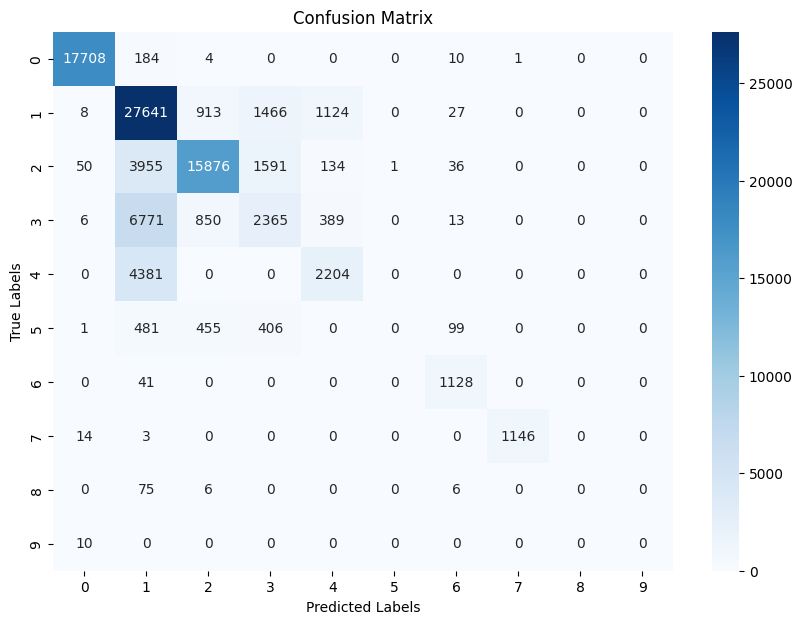

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9957    0.9885    0.9921      3734
           1     0.6318    0.8860    0.7376      6296
           2     0.8737    0.7290    0.7948      4468
           3     0.3749    0.2176    0.2754      2100
           4     0.5995    0.3425    0.4359      1381
           5     0.0000    0.0000    0.0000       301
           6     0.8415    0.9530    0.8938       234
           7     0.9955    0.9735    0.9843       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7410     18758
   macro avg     0.5312    0.5090    0.5114     18758
weighted avg     0.7270    0.7410    0.7203     18758



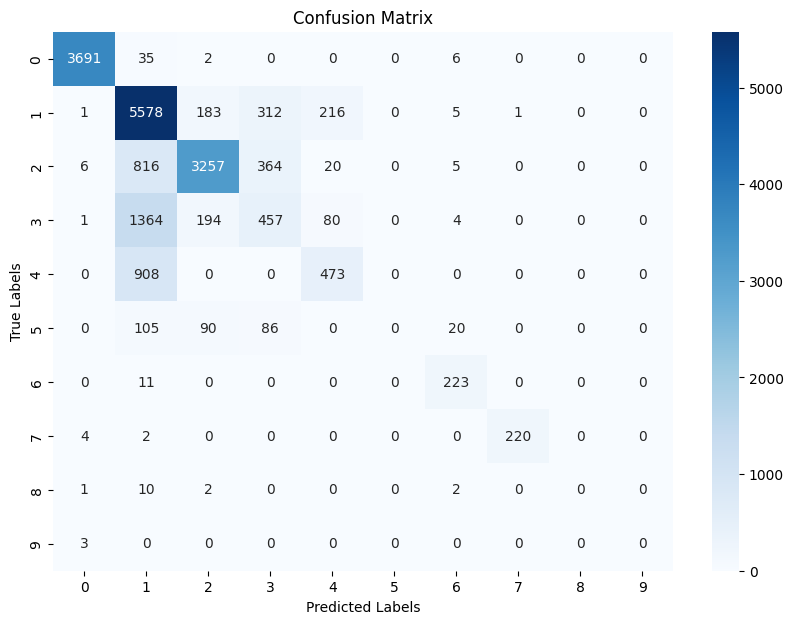

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9944    0.9900    0.9922      5386
           1     0.6316    0.8847    0.7371      9378
           2     0.8695    0.7365    0.7975      6523
           3     0.4211    0.2271    0.2951      3135
           4     0.5775    0.3195    0.4114      2028
           5     0.0000    0.0000    0.0000       403
           6     0.8506    0.9592    0.9017       368
           7     1.0000    0.9940    0.9970       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.7424     27584
   macro avg     0.5345    0.5111    0.5132     27584
weighted avg     0.7283    0.7424    0.7208     27584



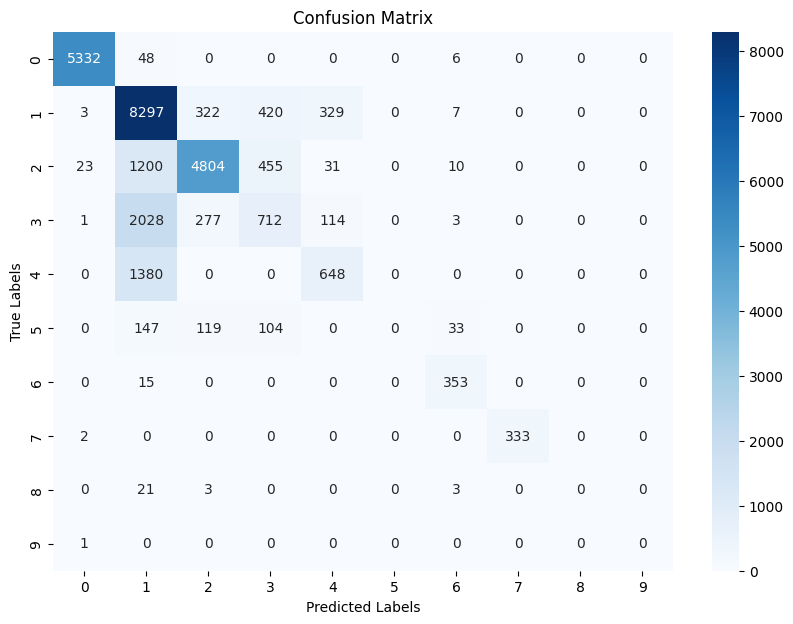

Start Round 2 ...
client_0: Loss = 0.5499, Accuracy = 0.769
client_1: Loss = 0.6114, Accuracy = 0.7485
client_2: Loss = 0.552, Accuracy = 0.7675
client_3: Loss = 0.5365, Accuracy = 0.7742
client_4: Loss = 0.5608, Accuracy = 0.7694
After round 2, train_loss = 0.6099, train_acc = 0.7527, dev_loss = 0.6116, dev_acc = 0.7526, test_loss = 0.6096, test_acc = 0.7518
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9988    0.9901    0.9944     17907
           1     0.8383    0.6266    0.7172     31179
           2     0.7144    0.8679    0.7837     21643
           3     0.5171    0.5244    0.5207     10394
           4     0.4613    0.7777    0.5791      6585
           5     0.0000    0.0000    0.0000      1442
           6     0.8111    0.9957    0.8940      1169
           7     0.9965    0.9854    0.9909      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10

   

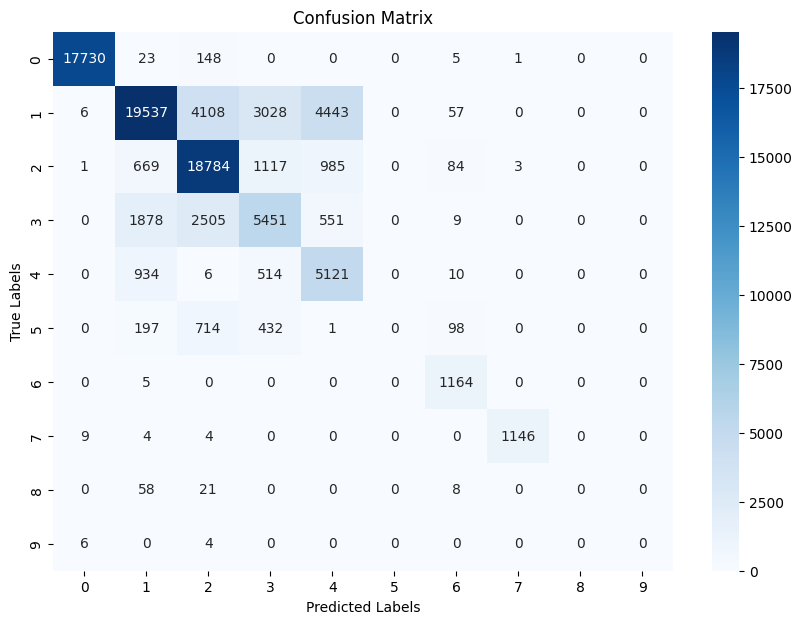

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9909    0.9953      3734
           1     0.8344    0.6196    0.7111      6296
           2     0.7157    0.8648    0.7832      4468
           3     0.5100    0.5324    0.5210      2100
           4     0.4737    0.7820    0.5900      1381
           5     0.0000    0.0000    0.0000       301
           6     0.8007    0.9957    0.8876       234
           7     1.0000    0.9735    0.9865       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7525     18758
   macro avg     0.5334    0.5759    0.5475     18758
weighted avg     0.7636    0.7525    0.7481     18758



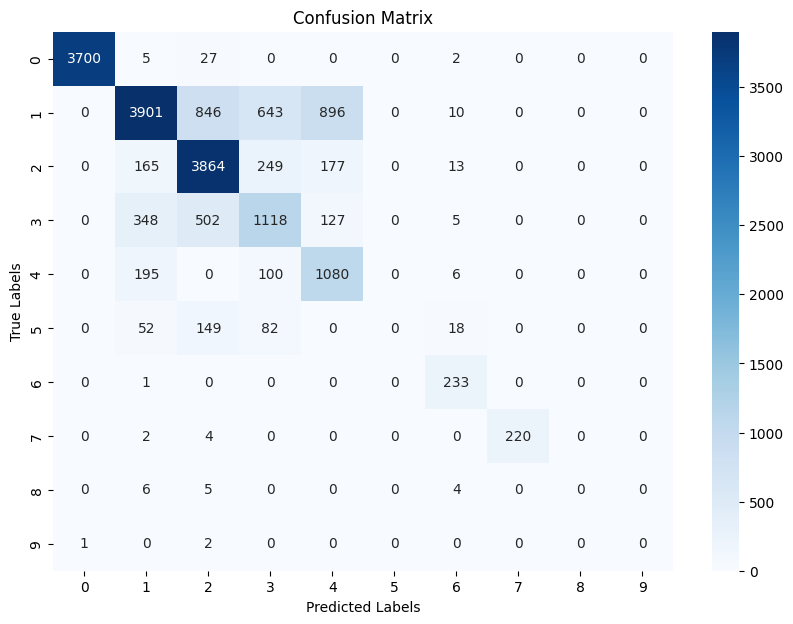

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9894    0.9940      5386
           1     0.8324    0.6227    0.7125      9378
           2     0.7108    0.8643    0.7801      6523
           3     0.5193    0.5148    0.5171      3135
           4     0.4784    0.8037    0.5998      2028
           5     0.0000    0.0000    0.0000       403
           6     0.8115    0.9946    0.8938       368
           7     0.9970    0.9940    0.9955       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.7522     27584
   macro avg     0.5348    0.5784    0.5493     27584
weighted avg     0.7632    0.7522    0.7477     27584



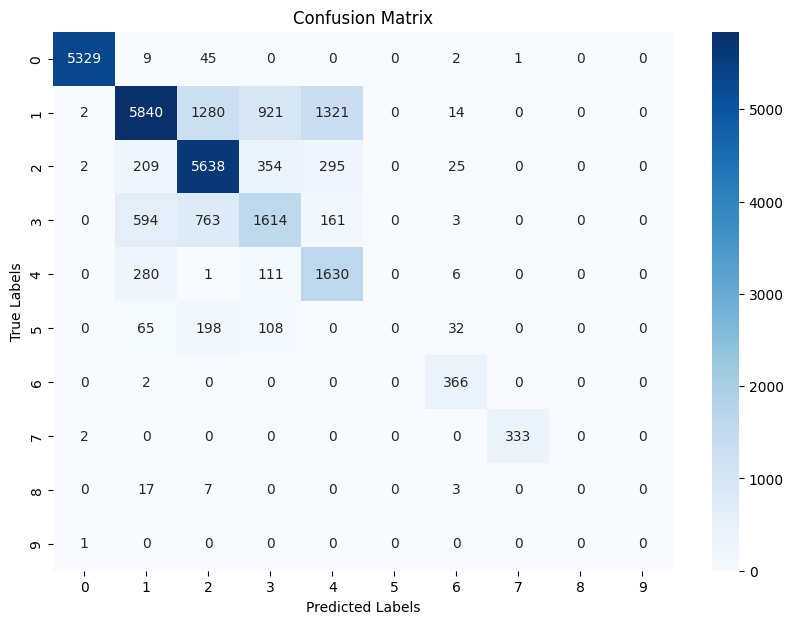

Start Round 3 ...
client_0: Loss = 0.4961, Accuracy = 0.7849
client_1: Loss = 0.4912, Accuracy = 0.7855
client_2: Loss = 0.551, Accuracy = 0.7679
client_3: Loss = 0.4925, Accuracy = 0.7868
client_4: Loss = 0.5053, Accuracy = 0.7828
After round 3, train_loss = 0.5028, train_acc = 0.7880, dev_loss = 0.5064, dev_acc = 0.7851, test_loss = 0.5077, test_acc = 0.7870
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9984    0.9976    0.9980     17907
           1     0.8312    0.7451    0.7858     31179
           2     0.9079    0.7759    0.8367     21643
           3     0.4458    0.8054    0.5739     10394
           4     0.6019    0.5470    0.5732      6585
           5     0.0000    0.0000    0.0000      1442
           6     0.8789    0.9932    0.9325      1169
           7     0.9896    0.9862    0.9879      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10

  

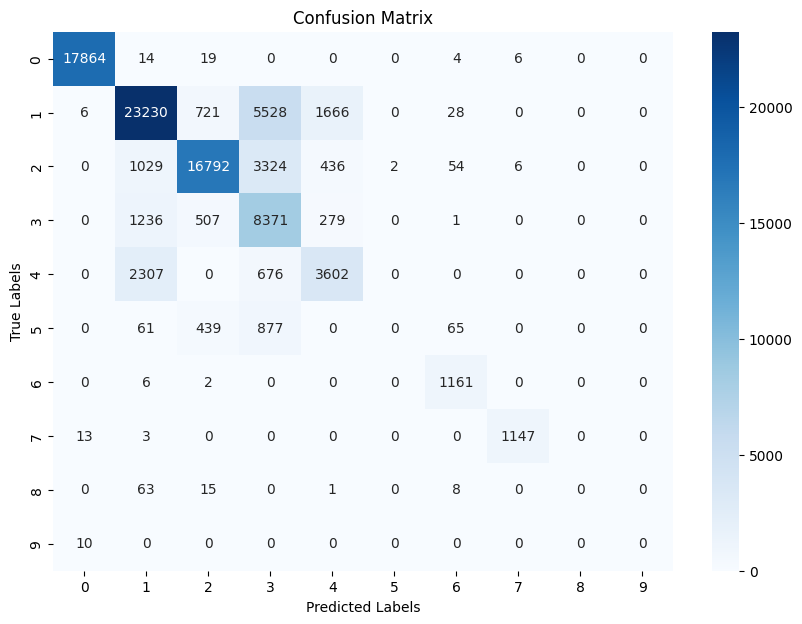

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9981    0.9984    0.9983      3734
           1     0.8284    0.7382    0.7807      6296
           2     0.9097    0.7733    0.8360      4468
           3     0.4277    0.7929    0.5556      2100
           4     0.6285    0.5612    0.5930      1381
           5     0.0000    0.0000    0.0000       301
           6     0.8788    0.9915    0.9317       234
           7     0.9910    0.9779    0.9844       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7849     18758
   macro avg     0.5662    0.5833    0.5680     18758
weighted avg     0.8105    0.7849    0.7892     18758



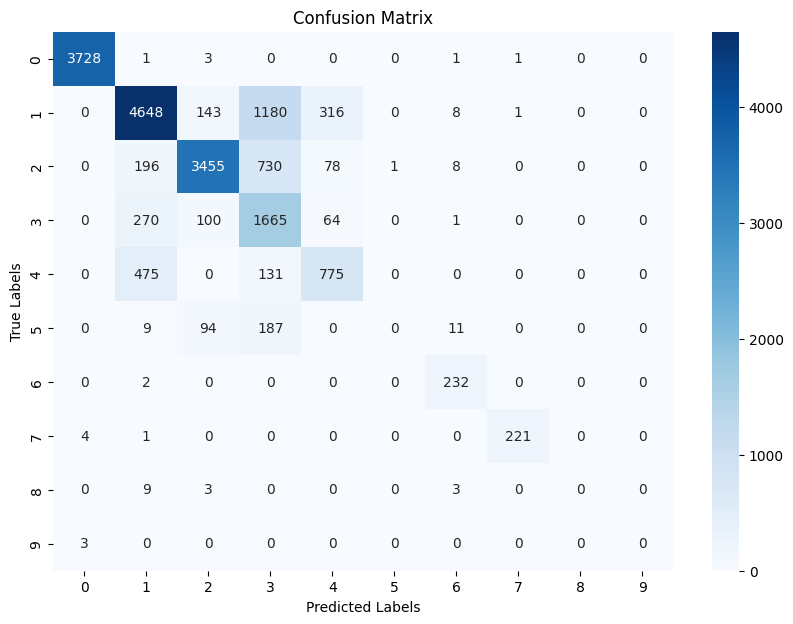

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9991    0.9974    0.9982      5386
           1     0.8217    0.7419    0.7798      9378
           2     0.9046    0.7759    0.8353      6523
           3     0.4520    0.8061    0.5792      3135
           4     0.6121    0.5454    0.5768      2028
           5     0.0000    0.0000    0.0000       403
           6     0.9035    0.9918    0.9456       368
           7     0.9853    0.9970    0.9911       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.7875     27584
   macro avg     0.5678    0.5856    0.5706     27584
weighted avg     0.8087    0.7875    0.7904     27584



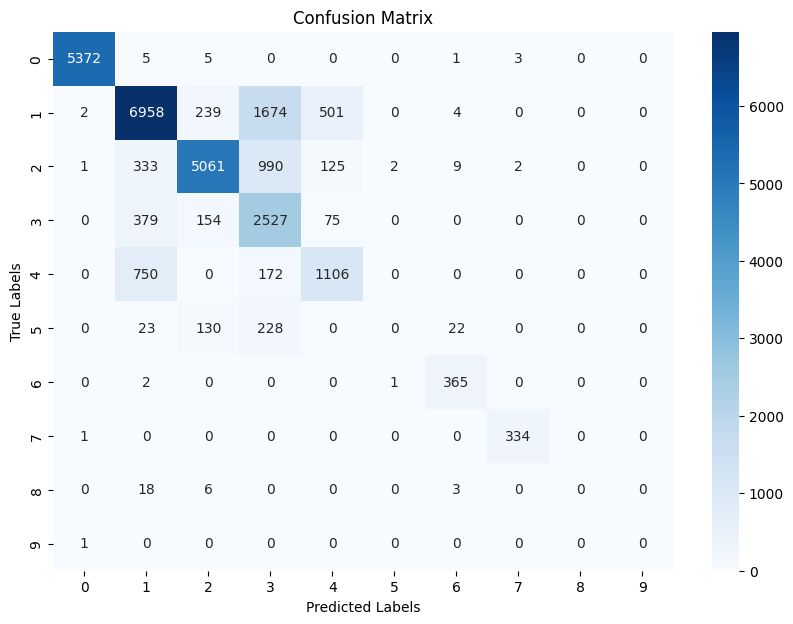

Start Round 4 ...
client_0: Loss = 0.4753, Accuracy = 0.79
After round 4, train_loss = 0.5119, train_acc = 0.7891, dev_loss = 0.5185, dev_acc = 0.7833, test_loss = 0.5135, test_acc = 0.7871
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9988    0.9951    0.9970     17907
           1     0.8750    0.7135    0.7861     31179
           2     0.8975    0.7864    0.8383     21643
           3     0.4467    0.7861    0.5697     10394
           4     0.5500    0.7116    0.6205      6585
           5     0.9091    0.0069    0.0138      1442
           6     0.8446    0.9949    0.9136      1169
           7     0.9965    0.9854    0.9909      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10

    accuracy                         0.7891     91579
   macro avg     0.6518    0.5980    0.5730     91579
weighted avg     0.8333    0.7891    0.7944     91579



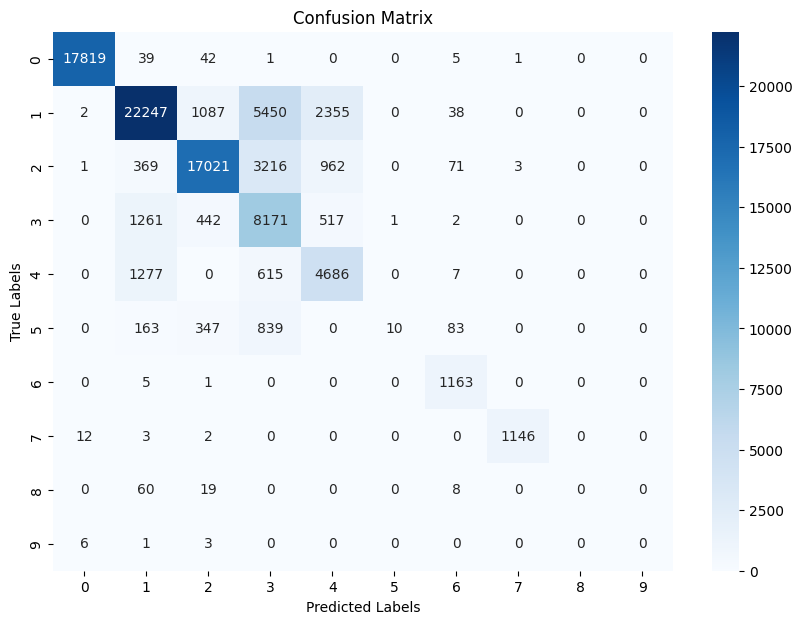

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9952    0.9972      3734
           1     0.8698    0.7012    0.7765      6296
           2     0.8914    0.7825    0.8334      4468
           3     0.4279    0.7729    0.5508      2100
           4     0.5629    0.7133    0.6292      1381
           5     0.3333    0.0033    0.0066       301
           6     0.8504    0.9957    0.9173       234
           7     1.0000    0.9779    0.9888       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7831     18758
   macro avg     0.5935    0.5942    0.5700     18758
weighted avg     0.8205    0.7831    0.7891     18758



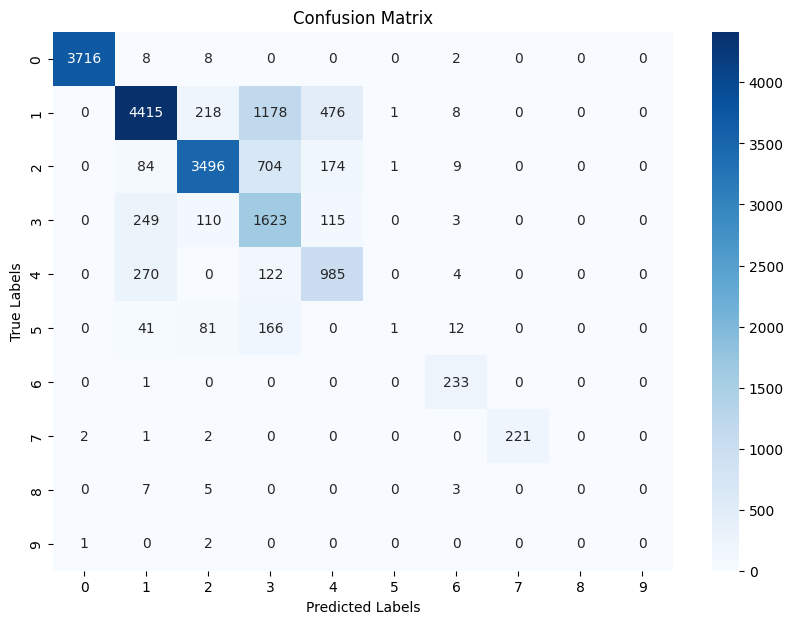

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9941    0.9967      5386
           1     0.8669    0.7099    0.7806      9378
           2     0.8935    0.7832    0.8347      6523
           3     0.4457    0.7796    0.5671      3135
           4     0.5638    0.7194    0.6321      2028
           5     0.6250    0.0124    0.0243       403
           6     0.8819    0.9946    0.9349       368
           7     0.9940    0.9940    0.9940       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.7877     27584
   macro avg     0.6270    0.5987    0.5765     27584
weighted avg     0.8262    0.7877    0.7932     27584

client_1: Loss = 0.415, Accuracy = 0.8127
client_2: Loss = 0.416, Accuracy = 0.8165
After round 7, train_loss = 0.4338, train_acc = 0.7961, dev_loss = 0.4456, dev_acc = 0.7907, test_loss = 0.4379, test_acc 

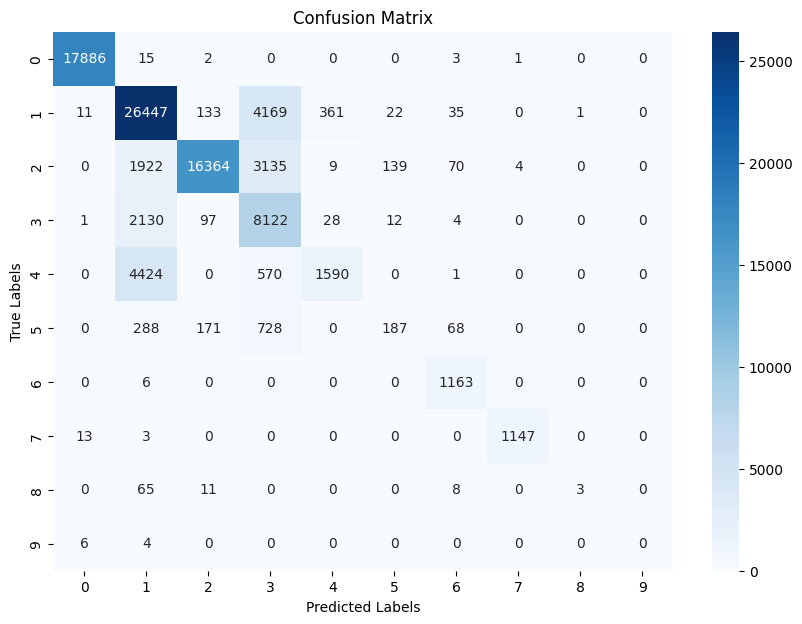

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9984    0.9995    0.9989      3734
           1     0.7419    0.8397    0.7878      6296
           2     0.9755    0.7498    0.8479      4468
           3     0.4634    0.7624    0.5764      2100
           4     0.8165    0.2578    0.3919      1381
           5     0.5658    0.1429    0.2281       301
           6     0.8662    0.9957    0.9264       234
           7     1.0000    0.9779    0.9888       226
           8     1.0000    0.2000    0.3333        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7904     18758
   macro avg     0.7428    0.5926    0.6080     18758
weighted avg     0.8249    0.7904    0.7860     18758



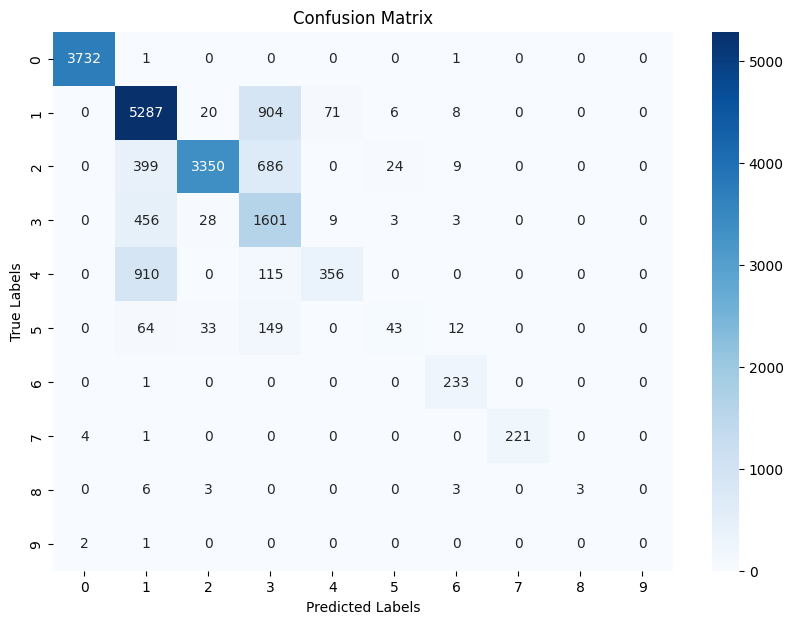

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9983    0.9985      5386
           1     0.7388    0.8458    0.7887      9378
           2     0.9730    0.7562    0.8510      6523
           3     0.4822    0.7633    0.5910      3135
           4     0.8014    0.2268    0.3536      2028
           5     0.5455    0.1489    0.2339       403
           6     0.8905    0.9946    0.9397       368
           7     0.9970    0.9970    0.9970       335
           8     1.0000    0.0370    0.0714        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.7923     27584
   macro avg     0.7427    0.5768    0.5825     27584
weighted avg     0.8229    0.7923    0.7857     27584



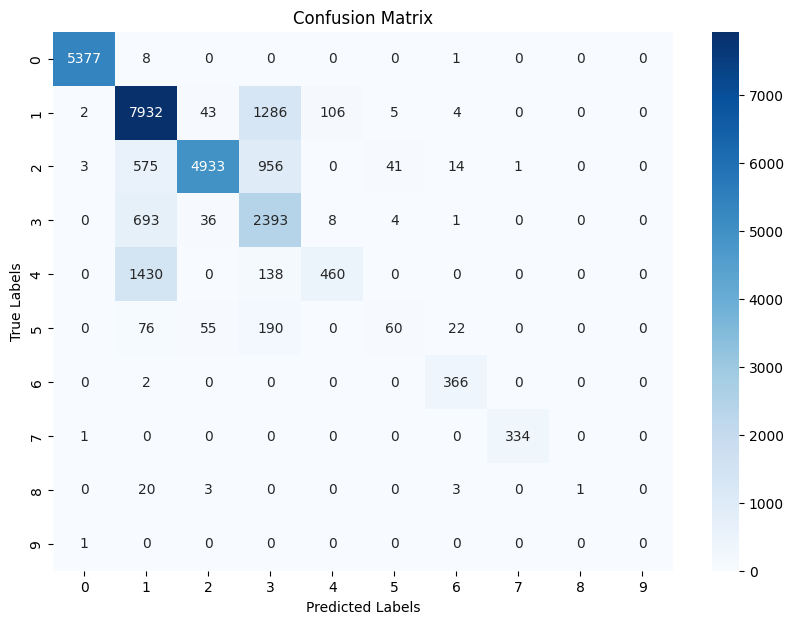

Start Round 8 ...
client_0: Loss = 0.4138, Accuracy = 0.8137
client_1: Loss = 0.4012, Accuracy = 0.82
client_2: Loss = 0.4001, Accuracy = 0.8257
client_3: Loss = 0.4026, Accuracy = 0.8241
client_4: Loss = 0.4135, Accuracy = 0.8174
After round 8, train_loss = 0.4873, train_acc = 0.8078, dev_loss = 0.4945, dev_acc = 0.8010, test_loss = 0.4846, test_acc = 0.8045
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9982    0.9988    0.9985     17907
           1     0.8218    0.7856    0.8033     31179
           2     0.9181    0.8016    0.8559     21643
           3     0.5080    0.7028    0.5897     10394
           4     0.5711    0.6896    0.6248      6585
           5     0.8041    0.0541    0.1014      1442
           6     0.8534    0.9957    0.9191      1169
           7     0.9957    0.9871    0.9914      1163
           8     0.9375    0.1724    0.2913        87
           9     0.0000    0.0000    0.0000        10

   

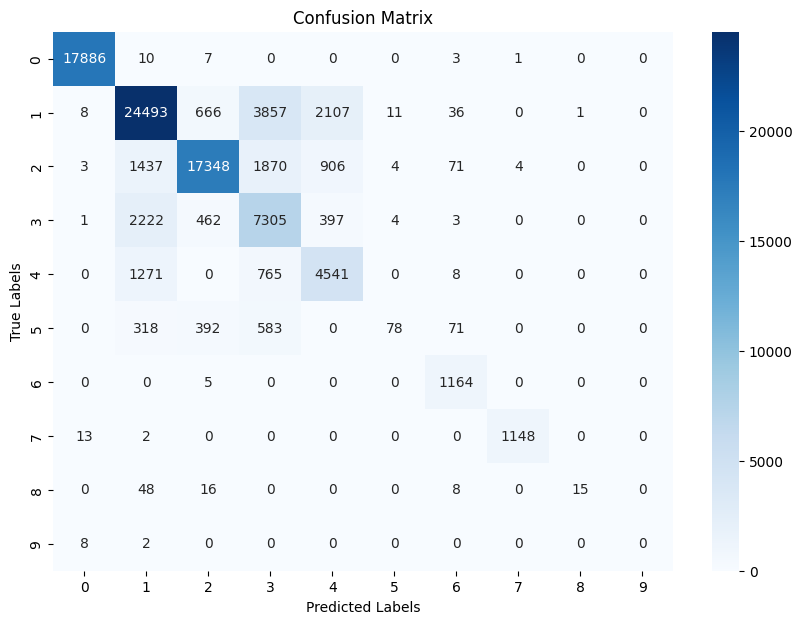

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9981    0.9992    0.9987      3734
           1     0.8118    0.7746    0.7928      6296
           2     0.9171    0.7977    0.8532      4468
           3     0.4773    0.6724    0.5583      2100
           4     0.5854    0.6973    0.6365      1381
           5     0.7083    0.0565    0.1046       301
           6     0.8504    0.9957    0.9173       234
           7     1.0000    0.9779    0.9888       226
           8     0.7500    0.2000    0.3158        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8008     18758
   macro avg     0.7098    0.6171    0.6166     18758
weighted avg     0.8208    0.8008    0.8028     18758



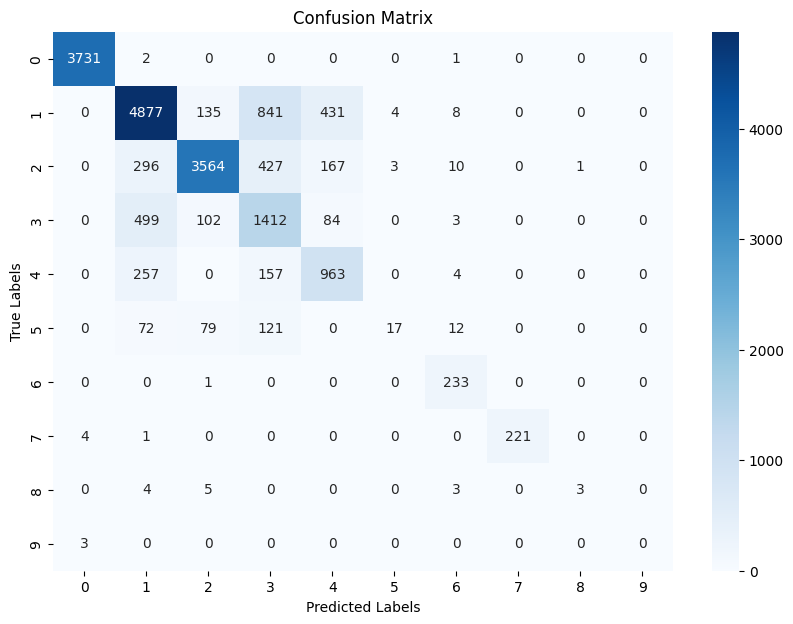

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9985    0.9987      5386
           1     0.8117    0.7807    0.7959      9378
           2     0.9155    0.8019    0.8549      6523
           3     0.5022    0.6785    0.5772      3135
           4     0.5817    0.6972    0.6342      2028
           5     0.7727    0.0844    0.1521       403
           6     0.8738    0.9973    0.9315       368
           7     0.9940    0.9940    0.9940       335
           8     0.5000    0.0370    0.0690        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.8050     27584
   macro avg     0.6951    0.6070    0.6008     27584
weighted avg     0.8229    0.8050    0.8068     27584



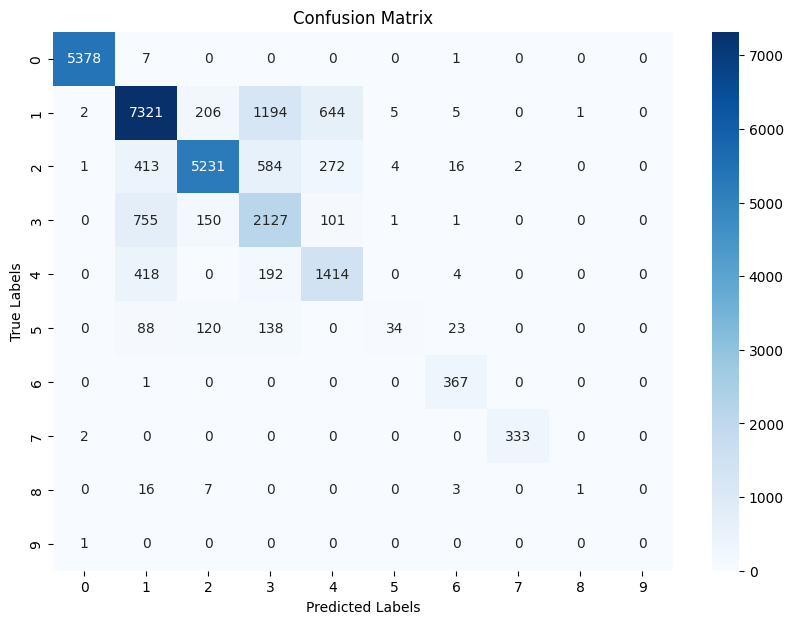

Start Round 9 ...
client_0: Loss = 0.4008, Accuracy = 0.8196
client_1: Loss = 0.3939, Accuracy = 0.8196
client_2: Loss = 0.3914, Accuracy = 0.825
client_3: Loss = 0.3903, Accuracy = 0.827
client_4: Loss = 0.4014, Accuracy = 0.8264
After round 9, train_loss = 0.3972, train_acc = 0.8083, dev_loss = 0.4123, dev_acc = 0.7997, test_loss = 0.4071, test_acc = 0.8020
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9985    0.9993    0.9989     17907
           1     0.7588    0.8588    0.8057     31179
           2     0.9289    0.8363    0.8801     21643
           3     0.5145    0.6992    0.5928     10394
           4     0.7432    0.2285    0.3496      6585
           5     0.7405    0.0950    0.1684      1442
           6     0.8541    0.9966    0.9199      1169
           7     0.9965    0.9880    0.9922      1163
           8     0.6471    0.2529    0.3636        87
           9     1.0000    0.3000    0.4615        10

   

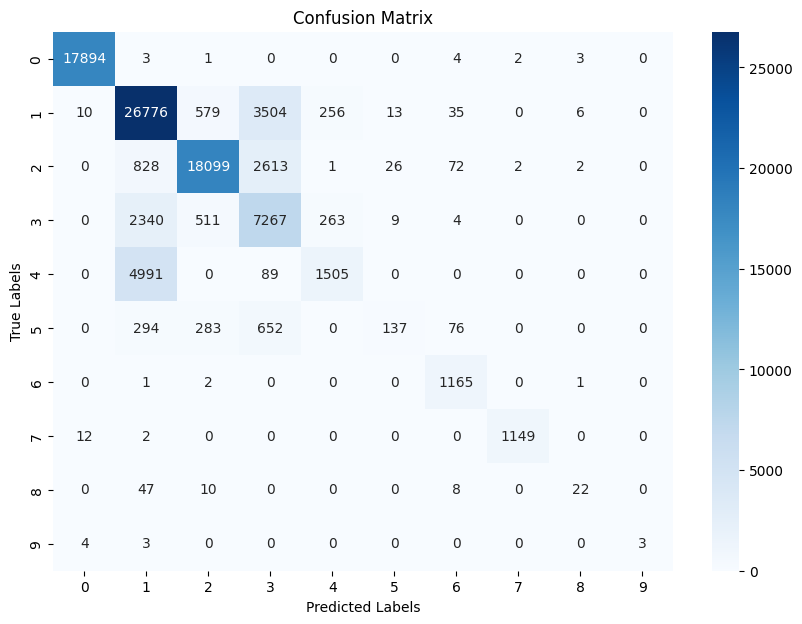

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9981    0.9992    0.9987      3734
           1     0.7451    0.8477    0.7931      6296
           2     0.9235    0.8270    0.8726      4468
           3     0.4938    0.6819    0.5728      2100
           4     0.7660    0.2252    0.3481      1381
           5     0.6739    0.1030    0.1787       301
           6     0.8535    0.9957    0.9191       234
           7     0.9955    0.9779    0.9866       226
           8     0.6667    0.4000    0.5000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7995     18758
   macro avg     0.7116    0.6058    0.6170     18758
weighted avg     0.8144    0.7995    0.7892     18758



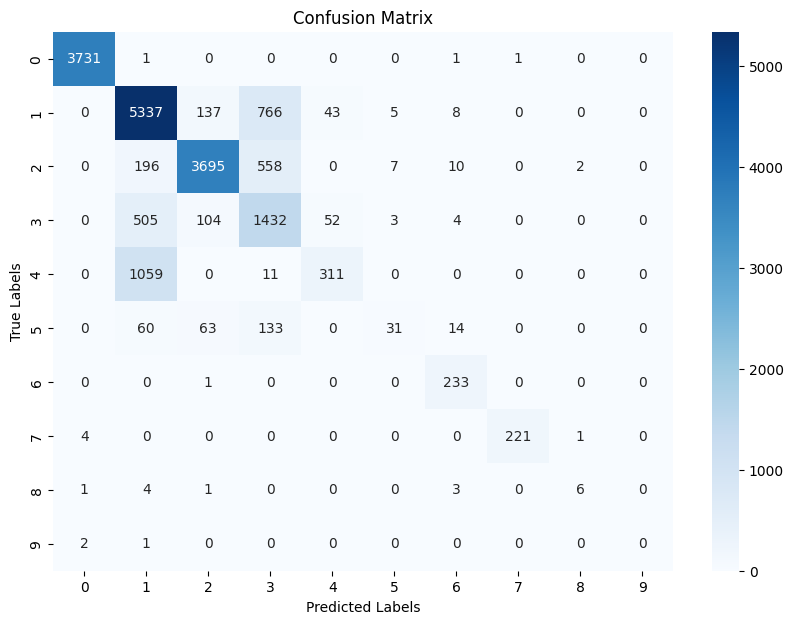

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9983    0.9986      5386
           1     0.7478    0.8556    0.7981      9378
           2     0.9279    0.8360    0.8795      6523
           3     0.5064    0.6775    0.5796      3135
           4     0.7148    0.2027    0.3158      2028
           5     0.6724    0.0968    0.1692       403
           6     0.8612    0.9946    0.9231       368
           7     1.0000    0.9940    0.9970       335
           8     0.6667    0.2222    0.3333        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.8024     27584
   macro avg     0.7096    0.5878    0.5994     27584
weighted avg     0.8129    0.8024    0.7906     27584



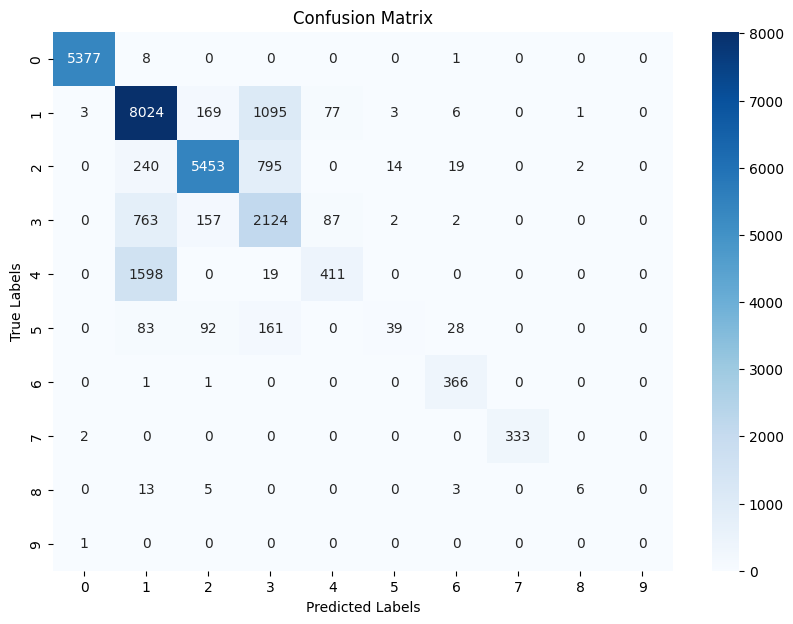

Start Round 10 ...
client_0: Loss = 0.3883, Accuracy = 0.8246
client_1: Loss = 0.3823, Accuracy = 0.8266
client_2: Loss = 0.3807, Accuracy = 0.8346
client_3: Loss = 0.3846, Accuracy = 0.8285
client_4: Loss = 0.3905, Accuracy = 0.8299
After round 10, train_loss = 0.3814, train_acc = 0.8251, dev_loss = 0.3940, dev_acc = 0.8165, test_loss = 0.3886, test_acc = 0.8198
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9991    0.9992    0.9992     17907
           1     0.7734    0.8749    0.8210     31179
           2     0.8050    0.9303    0.8631     21643
           3     0.6765    0.3642    0.4735     10394
           4     0.7840    0.6158    0.6898      6585
           5     0.7778    0.0583    0.1084      1442
           6     0.8699    0.9949    0.9282      1169
           7     0.9965    0.9871    0.9918      1163
           8     0.8125    0.1494    0.2524        87
           9     1.0000    0.4000    0.5714        10


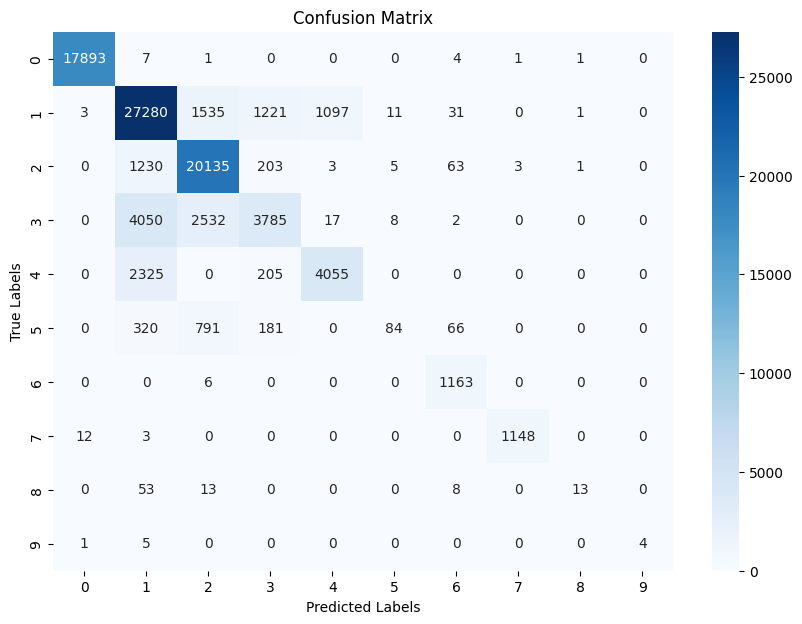

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9995    0.9992      3734
           1     0.7630    0.8580    0.8077      6296
           2     0.7946    0.9264    0.8554      4468
           3     0.6316    0.3371    0.4396      2100
           4     0.7824    0.6198    0.6917      1381
           5     0.7778    0.0698    0.1280       301
           6     0.8689    0.9915    0.9261       234
           7     1.0000    0.9779    0.9888       226
           8     1.0000    0.2000    0.3333        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8164     18758
   macro avg     0.7617    0.5980    0.6170     18758
weighted avg     0.8087    0.8164    0.7997     18758



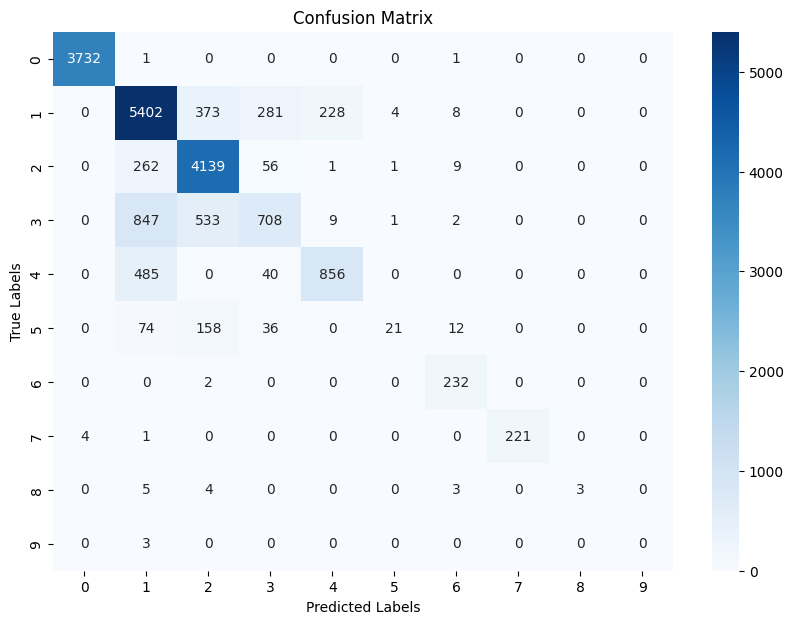

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9981    0.9987      5386
           1     0.7638    0.8699    0.8134      9378
           2     0.8035    0.9279    0.8613      6523
           3     0.6721    0.3426    0.4538      3135
           4     0.7688    0.6065    0.6781      2028
           5     0.7209    0.0769    0.1390       403
           6     0.8927    0.9946    0.9409       368
           7     1.0000    0.9940    0.9970       335
           8     0.8000    0.1481    0.2500        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8203     27584
   macro avg     0.8421    0.6959    0.7132     27584
weighted avg     0.8131    0.8203    0.8036     27584



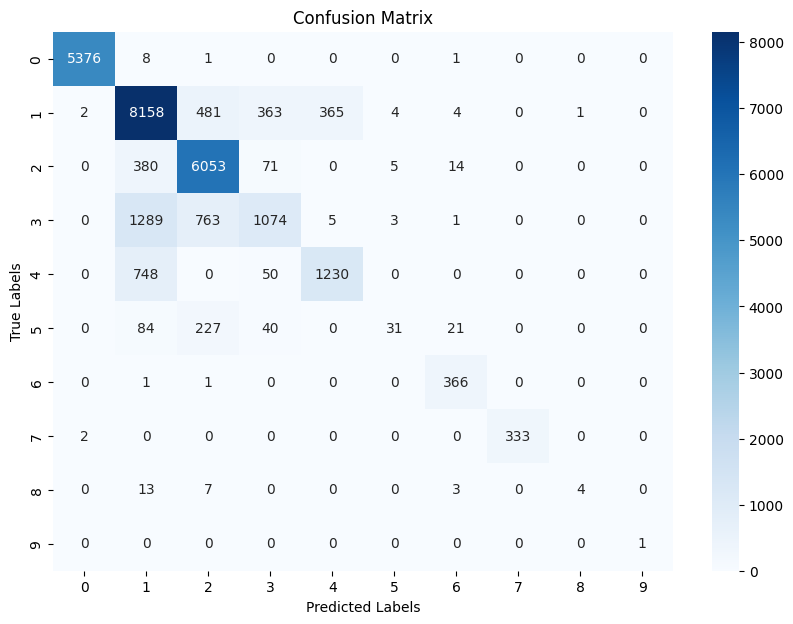

Start Round 11 ...
client_0: Loss = 0.3809, Accuracy = 0.828
client_1: Loss = 0.3714, Accuracy = 0.8325
client_2: Loss = 0.3768, Accuracy = 0.8344
client_3: Loss = 0.3868, Accuracy = 0.8317
client_4: Loss = 0.3795, Accuracy = 0.8337
After round 11, train_loss = 0.3869, train_acc = 0.8285, dev_loss = 0.3992, dev_acc = 0.8220, test_loss = 0.3911, test_acc = 0.8258
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9992    0.9992     17907
           1     0.8693    0.7898    0.8277     31179
           2     0.7838    0.9343    0.8524     21643
           3     0.6359    0.4991    0.5593     10394
           4     0.6328    0.8167    0.7131      6585
           5     0.6215    0.1526    0.2450      1442
           6     0.8773    0.9966    0.9331      1169
           7     0.9957    0.9897    0.9927      1163
           8     0.7609    0.4023    0.5263        87
           9     1.0000    0.6000    0.7500        10



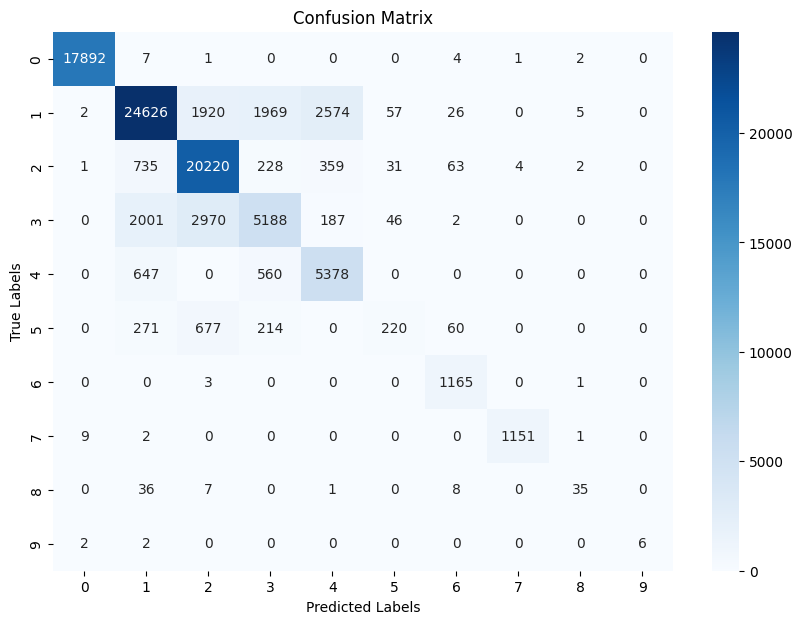

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9984    0.9989    0.9987      3734
           1     0.8641    0.7738    0.8165      6296
           2     0.7752    0.9362    0.8481      4468
           3     0.6026    0.4714    0.5290      2100
           4     0.6414    0.8211    0.7202      1381
           5     0.5802    0.1561    0.2461       301
           6     0.8759    0.9957    0.9320       234
           7     1.0000    0.9779    0.9888       226
           8     0.6667    0.4000    0.5000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8218     18758
   macro avg     0.7005    0.6531    0.6579     18758
weighted avg     0.8209    0.8218    0.8150     18758



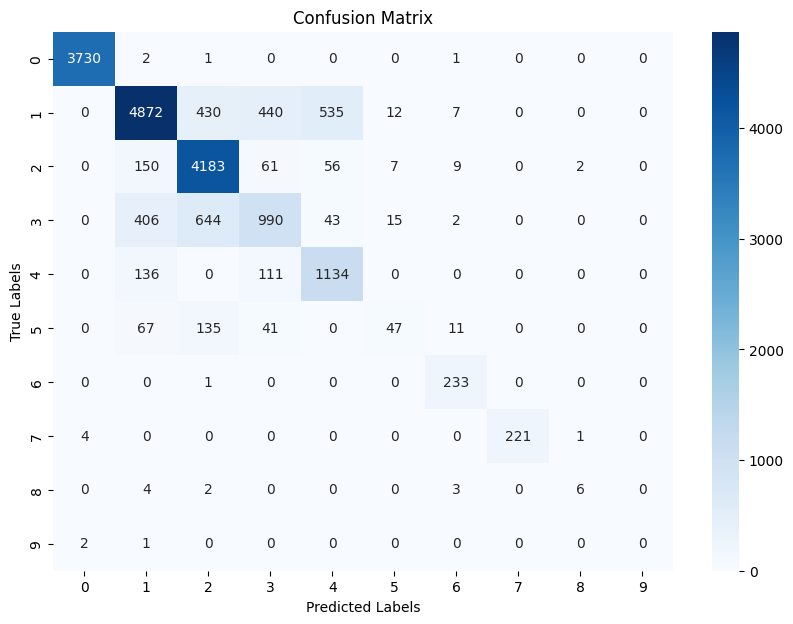

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9987    0.9991      5386
           1     0.8588    0.7848    0.8201      9378
           2     0.7853    0.9324    0.8525      6523
           3     0.6331    0.4817    0.5471      3135
           4     0.6408    0.8314    0.7238      2028
           5     0.5405    0.1489    0.2335       403
           6     0.8905    0.9946    0.9397       368
           7     0.9940    0.9940    0.9940       335
           8     0.6923    0.3333    0.4500        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8261     27584
   macro avg     0.8035    0.7500    0.7560     27584
weighted avg     0.8245    0.8261    0.8194     27584



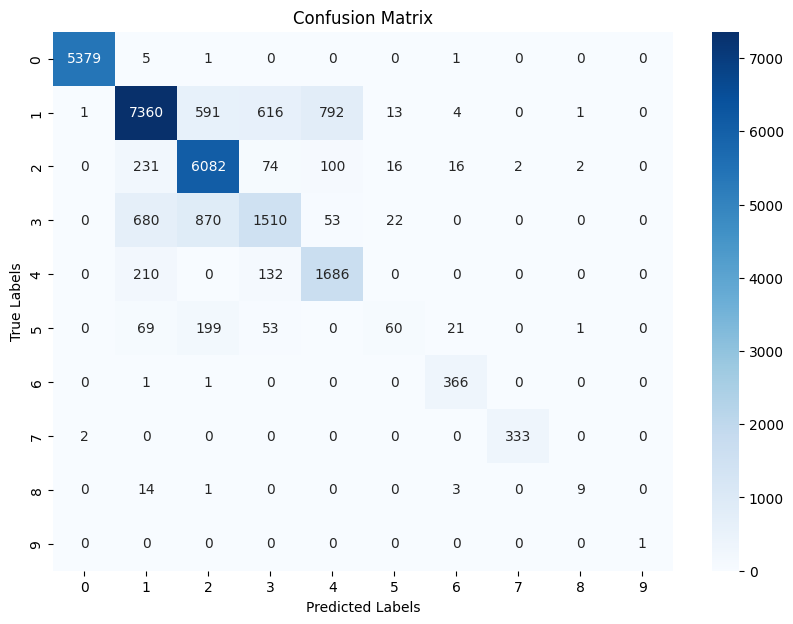

Start Round 12 ...
client_0: Loss = 0.3752, Accuracy = 0.8303
client_1: Loss = 0.3672, Accuracy = 0.8362
client_2: Loss = 0.3644, Accuracy = 0.8396
client_3: Loss = 0.3723, Accuracy = 0.8371
client_4: Loss = 0.6877, Accuracy = 0.7292
After round 12, train_loss = 1.1455, train_acc = 0.5339, dev_loss = 1.1417, dev_acc = 0.5252, test_loss = 1.1534, test_acc = 0.5244
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     1.0000    0.2430    0.3910     17907
           1     0.6229    0.7794    0.6924     31179
           2     0.4256    0.7730    0.5490     21643
           3     0.3914    0.3051    0.3429     10394
           4     0.4084    0.0504    0.0898      6585
           5     0.0000    0.0000    0.0000      1442
           6     0.0000    0.0000    0.0000      1169
           7     0.0000    0.0000    0.0000      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10


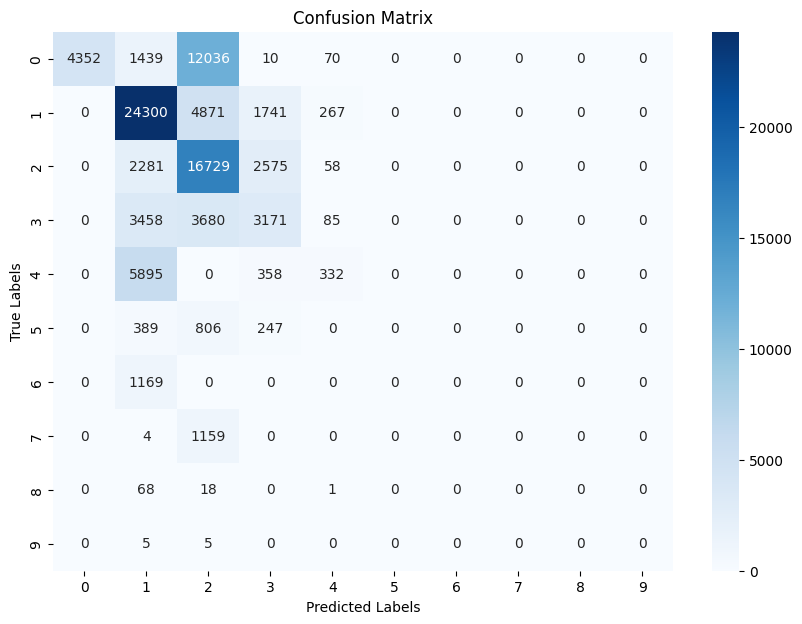

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     1.0000    0.2418    0.3895      3734
           1     0.6106    0.7664    0.6797      6296
           2     0.4254    0.7757    0.5495      4468
           3     0.3588    0.2814    0.3155      2100
           4     0.3962    0.0456    0.0818      1381
           5     0.0000    0.0000    0.0000       301
           6     0.0000    0.0000    0.0000       234
           7     0.0000    0.0000    0.0000       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.5250     18758
   macro avg     0.2791    0.2111    0.2016     18758
weighted avg     0.5747    0.5250    0.4779     18758



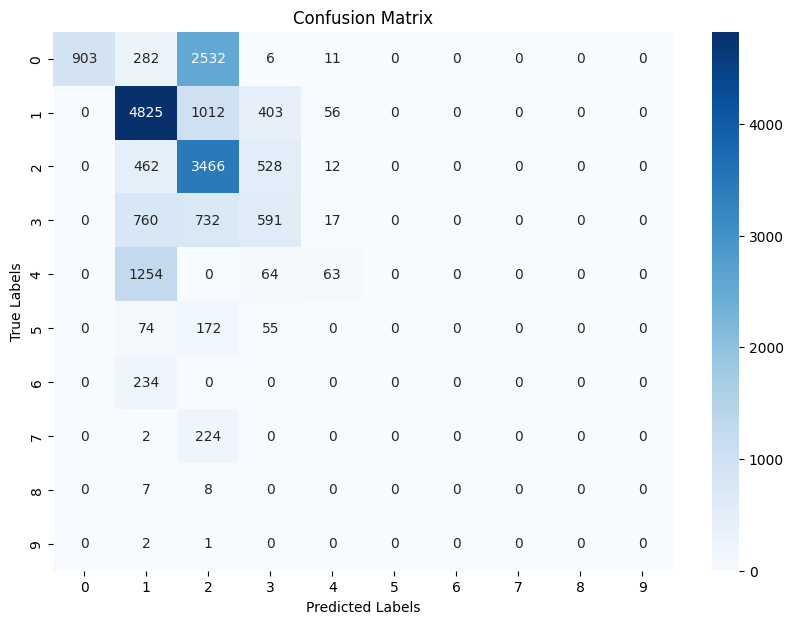

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     1.0000    0.2317    0.3762      5386
           1     0.6112    0.7637    0.6790      9378
           2     0.4218    0.7727    0.5457      6523
           3     0.3873    0.3005    0.3384      3135
           4     0.4473    0.0523    0.0936      2028
           5     0.0000    0.0000    0.0000       403
           6     0.0000    0.0000    0.0000       368
           7     0.0000    0.0000    0.0000       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.5256     27584
   macro avg     0.2868    0.2121    0.2033     27584
weighted avg     0.5797    0.5256    0.4787     27584



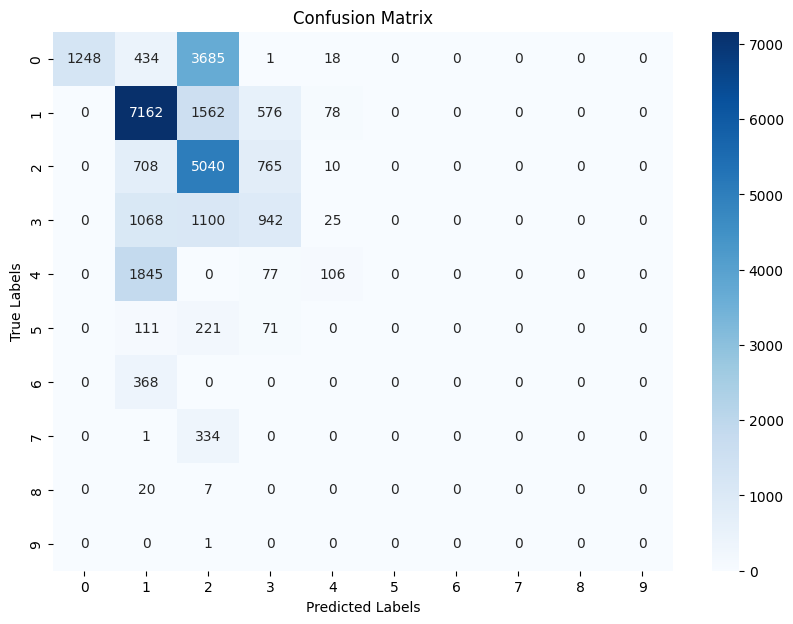

Start Round 13 ...
client_0: Loss = 0.4155, Accuracy = 0.8163
client_1: Loss = 0.4145, Accuracy = 0.8148
client_2: Loss = 0.4135, Accuracy = 0.8156
client_3: Loss = 0.4163, Accuracy = 0.818
client_4: Loss = 0.4131, Accuracy = 0.8187
After round 13, train_loss = 0.4007, train_acc = 0.8182, dev_loss = 0.4089, dev_acc = 0.8146, test_loss = 0.4130, test_acc = 0.8133
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9990    0.9987    0.9988     17907
           1     0.7908    0.8476    0.8182     31179
           2     0.7850    0.9146    0.8448     21643
           3     0.6608    0.2831    0.3964     10394
           4     0.7074    0.8087    0.7546      6585
           5     0.4245    0.1775    0.2504      1442
           6     0.8821    0.9855    0.9309      1169
           7     0.9983    0.9888    0.9935      1163
           8     0.0000    0.0000    0.0000        87
           9     0.0000    0.0000    0.0000        10



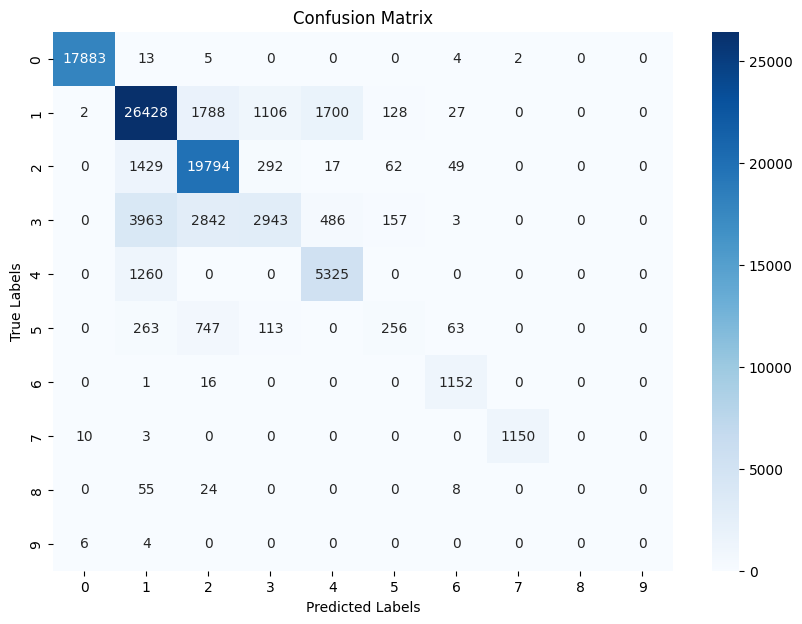

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.7842    0.8405    0.8114      6296
           2     0.7816    0.9170    0.8439      4468
           3     0.6360    0.2695    0.3786      2100
           4     0.7109    0.7958    0.7509      1381
           5     0.3889    0.1395    0.2054       301
           6     0.8684    0.9872    0.9240       234
           7     1.0000    0.9779    0.9888       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8146     18758
   macro avg     0.6169    0.5927    0.5902     18758
weighted avg     0.8008    0.8146    0.7966     18758



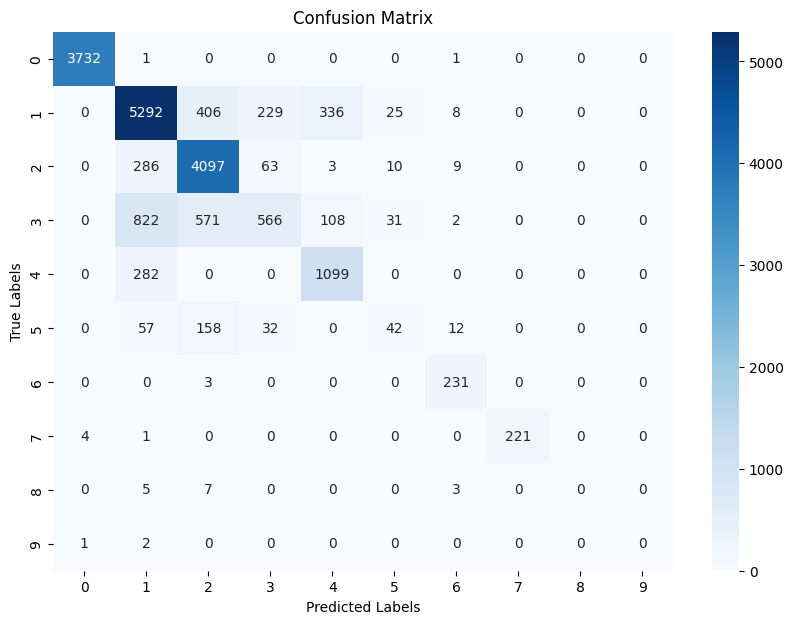

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9983    0.9990      5386
           1     0.7842    0.8441    0.8130      9378
           2     0.7835    0.9132    0.8434      6523
           3     0.6342    0.2638    0.3726      3135
           4     0.7002    0.7934    0.7439      2028
           5     0.4294    0.1811    0.2548       403
           6     0.8972    0.9728    0.9335       368
           7     0.9940    0.9970    0.9955       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.8139     27584
   macro avg     0.6222    0.5964    0.5956     27584
weighted avg     0.8009    0.8139    0.7962     27584



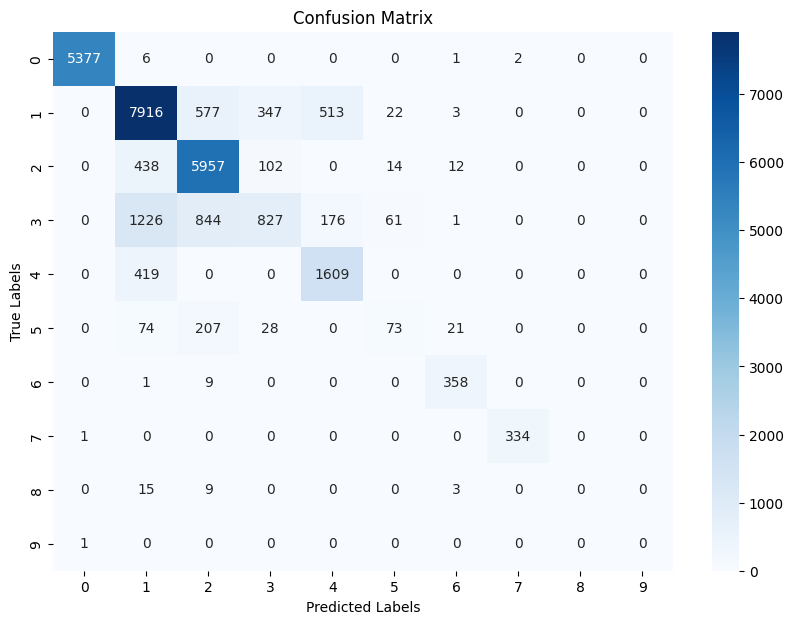

Start Round 14 ...
client_0: Loss = 0.3925, Accuracy = 0.8246
client_1: Loss = 0.3816, Accuracy = 0.8273
client_2: Loss = 0.3817, Accuracy = 0.8294
client_3: Loss = 0.3829, Accuracy = 0.829
client_4: Loss = 0.3935, Accuracy = 0.8263
After round 14, train_loss = 0.3722, train_acc = 0.8379, dev_loss = 0.3859, dev_acc = 0.8287, test_loss = 0.3826, test_acc = 0.8330
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9988    0.9991     17907
           1     0.8875    0.7852    0.8332     31179
           2     0.8094    0.9325    0.8666     21643
           3     0.5907    0.5609    0.5754     10394
           4     0.6942    0.8885    0.7794      6585
           5     0.5219    0.1325    0.2113      1442
           6     0.8673    0.9949    0.9267      1169
           7     0.9983    0.9888    0.9935      1163
           8     0.6667    0.0230    0.0444        87
           9     0.0000    0.0000    0.0000        10



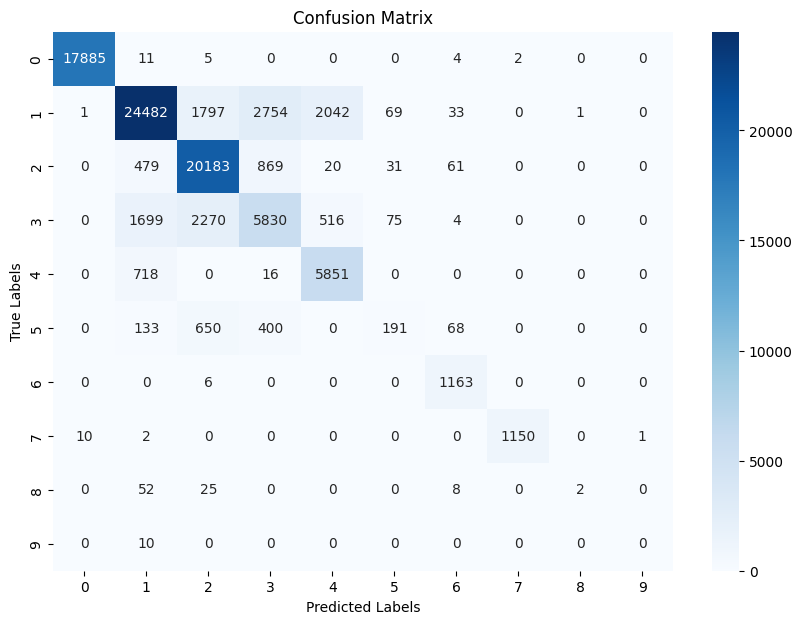

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9992    0.9991      3734
           1     0.8784    0.7676    0.8193      6296
           2     0.8025    0.9313    0.8621      4468
           3     0.5584    0.5329    0.5453      2100
           4     0.6852    0.8747    0.7684      1381
           5     0.4675    0.1196    0.1905       301
           6     0.8593    0.9915    0.9206       234
           7     0.9955    0.9779    0.9866       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8285     18758
   macro avg     0.6246    0.6195    0.6092     18758
weighted avg     0.8280    0.8285    0.8233     18758



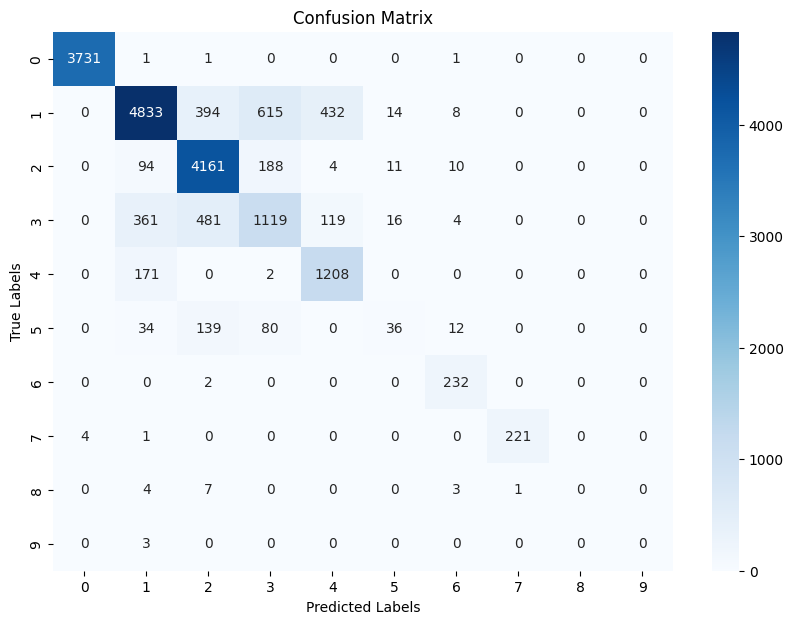

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9983    0.9990      5386
           1     0.8809    0.7799    0.8273      9378
           2     0.8073    0.9286    0.8637      6523
           3     0.5818    0.5419    0.5612      3135
           4     0.6856    0.8861    0.7731      2028
           5     0.4815    0.1290    0.2035       403
           6     0.8777    0.9946    0.9325       368
           7     1.0000    0.9940    0.9970       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.8336     27584
   macro avg     0.6314    0.6252    0.6157     27584
weighted avg     0.8330    0.8336    0.8287     27584



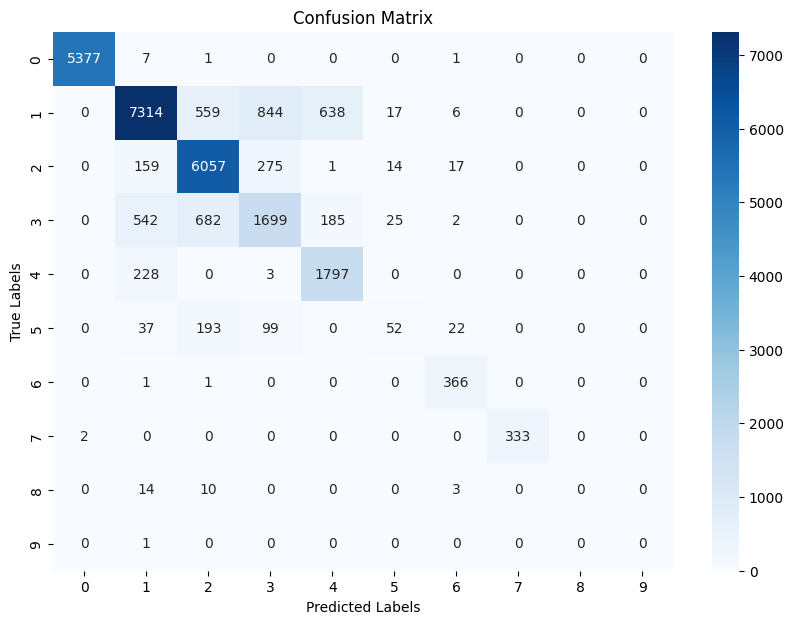

Start Round 15 ...
client_0: Loss = 0.3723, Accuracy = 0.8289
client_1: Loss = 0.371, Accuracy = 0.8327
client_2: Loss = 0.3684, Accuracy = 0.8346
client_3: Loss = 0.3705, Accuracy = 0.8356
client_4: Loss = 0.3753, Accuracy = 0.8337
After round 15, train_loss = 0.3949, train_acc = 0.8159, dev_loss = 0.4097, dev_acc = 0.8091, test_loss = 0.4084, test_acc = 0.8081
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9993    0.9992     17907
           1     0.7797    0.8439    0.8105     31179
           2     0.8725    0.8760    0.8743     21643
           3     0.5357    0.6334    0.5805     10394
           4     0.7627    0.3812    0.5083      6585
           5     0.7835    0.1054    0.1858      1442
           6     0.9129    0.9683    0.9398      1169
           7     0.9957    0.9914    0.9935      1163
           8     0.8462    0.1264    0.2200        87
           9     0.8571    0.6000    0.7059        10



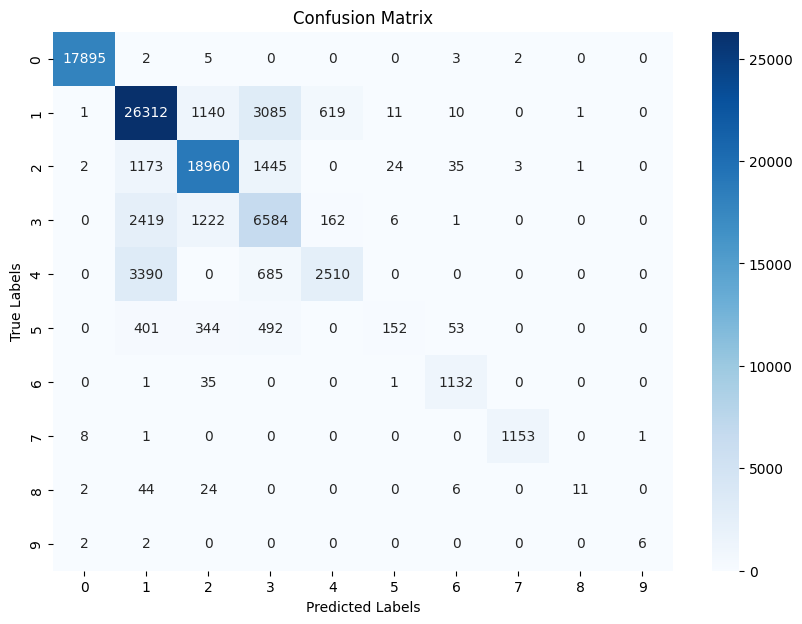

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9992    0.9989      3734
           1     0.7697    0.8350    0.8010      6296
           2     0.8679    0.8677    0.8678      4468
           3     0.5134    0.6119    0.5583      2100
           4     0.7696    0.3917    0.5192      1381
           5     0.7333    0.1096    0.1908       301
           6     0.9116    0.9701    0.9400       234
           7     0.9955    0.9823    0.9889       226
           8     1.0000    0.1333    0.2353        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8090     18758
   macro avg     0.7560    0.5901    0.6100     18758
weighted avg     0.8139    0.8090    0.8020     18758



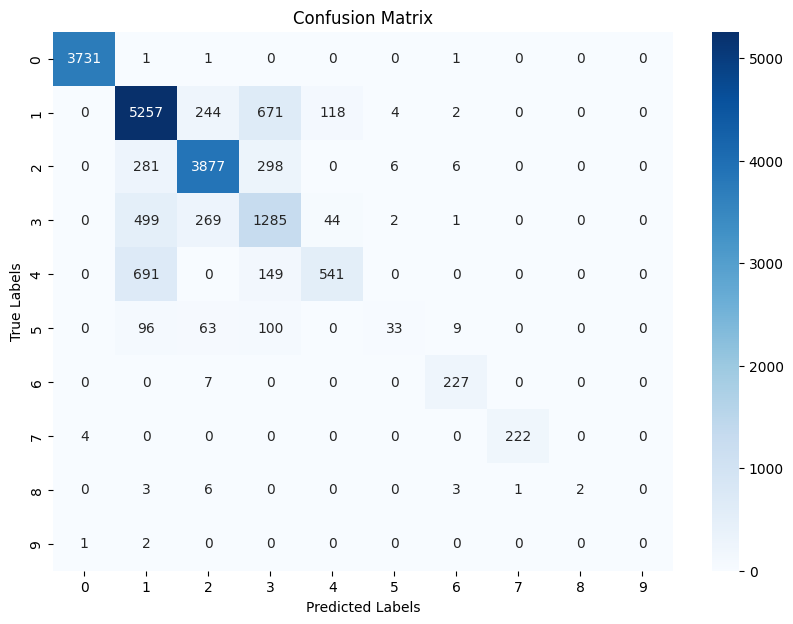

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9981    0.9987      5386
           1     0.7631    0.8389    0.7992      9378
           2     0.8741    0.8705    0.8723      6523
           3     0.5285    0.6064    0.5648      3135
           4     0.7378    0.3649    0.4883      2028
           5     0.7123    0.1290    0.2185       403
           6     0.9149    0.9647    0.9392       368
           7     0.9911    0.9940    0.9925       335
           8     1.0000    0.0370    0.0714        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8086     27584
   macro avg     0.8521    0.6804    0.6945     27584
weighted avg     0.8112    0.8086    0.8010     27584



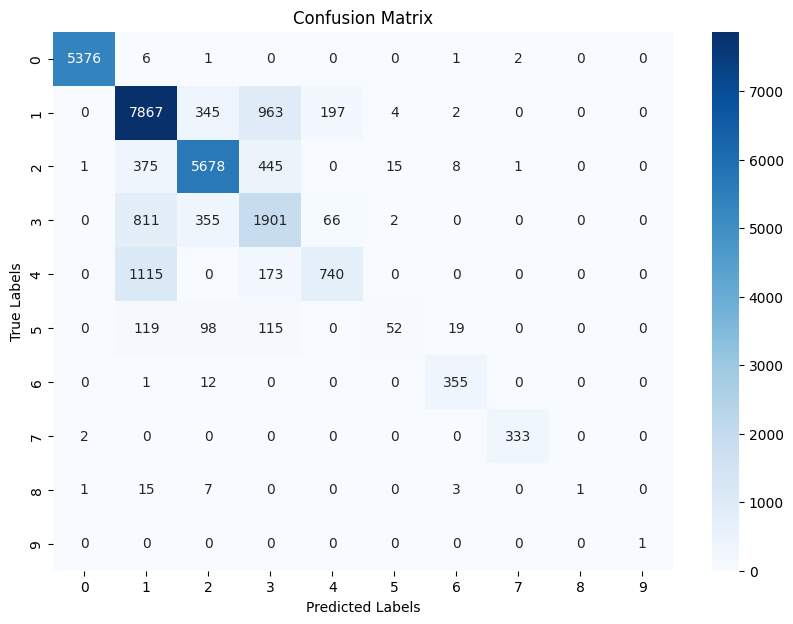

Start Round 16 ...
client_0: Loss = 0.3673, Accuracy = 0.835
client_1: Loss = 0.3784, Accuracy = 0.8286
client_2: Loss = 0.3619, Accuracy = 0.8395
client_3: Loss = 0.3676, Accuracy = 0.838
client_4: Loss = 0.3641, Accuracy = 0.8367
After round 16, train_loss = 0.3515, train_acc = 0.8447, dev_loss = 0.3662, dev_acc = 0.8364, test_loss = 0.3643, test_acc = 0.8360
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9993    0.9992     17907
           1     0.8775    0.8125    0.8438     31179
           2     0.8301    0.9308    0.8776     21643
           3     0.5817    0.6225    0.6014     10394
           4     0.7493    0.7704    0.7597      6585
           5     0.6367    0.1082    0.1849      1442
           6     0.9089    0.9641    0.9357      1169
           7     0.9983    0.9888    0.9935      1163
           8     0.5000    0.0115    0.0225        87
           9     1.0000    0.3000    0.4615        10

 

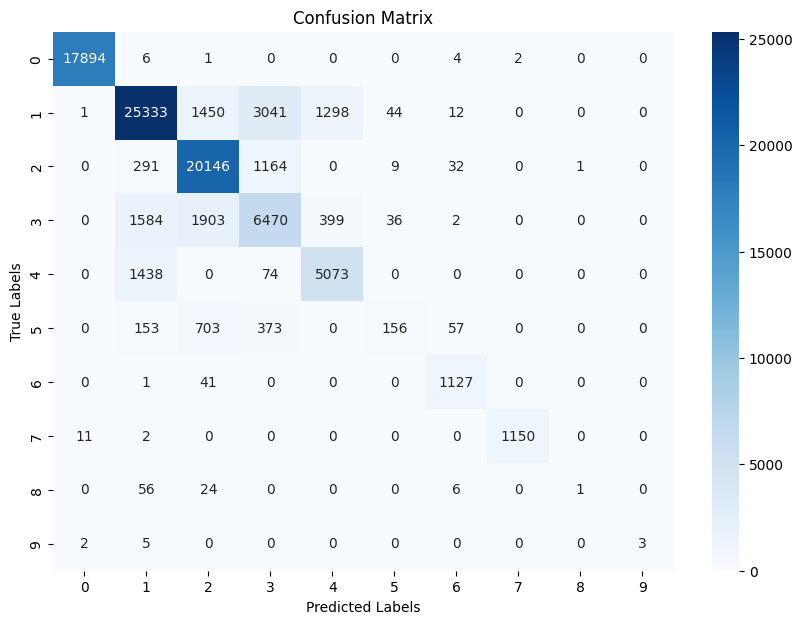

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9995    0.9992      3734
           1     0.8623    0.8010    0.8305      6296
           2     0.8206    0.9212    0.8680      4468
           3     0.5623    0.6019    0.5814      2100
           4     0.7577    0.7632    0.7605      1381
           5     0.6042    0.0963    0.1662       301
           6     0.9073    0.9615    0.9336       234
           7     0.9955    0.9779    0.9866       226
           8     1.0000    0.0667    0.1250        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8362     18758
   macro avg     0.7509    0.6189    0.6251     18758
weighted avg     0.8363    0.8362    0.8318     18758



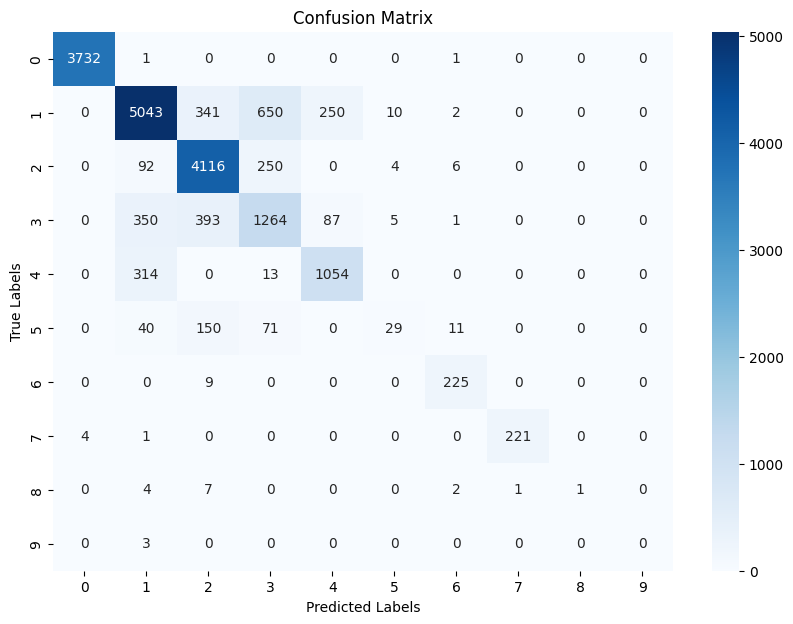

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9989    0.9993      5386
           1     0.8683    0.8043    0.8351      9378
           2     0.8221    0.9246    0.8703      6523
           3     0.5657    0.5920    0.5786      3135
           4     0.7278    0.7569    0.7421      2028
           5     0.6324    0.1067    0.1826       403
           6     0.9145    0.9592    0.9363       368
           7     1.0000    0.9940    0.9970       335
           8     1.0000    0.0370    0.0714        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8366     27584
   macro avg     0.8530    0.7174    0.7213     27584
weighted avg     0.8372    0.8366    0.8325     27584



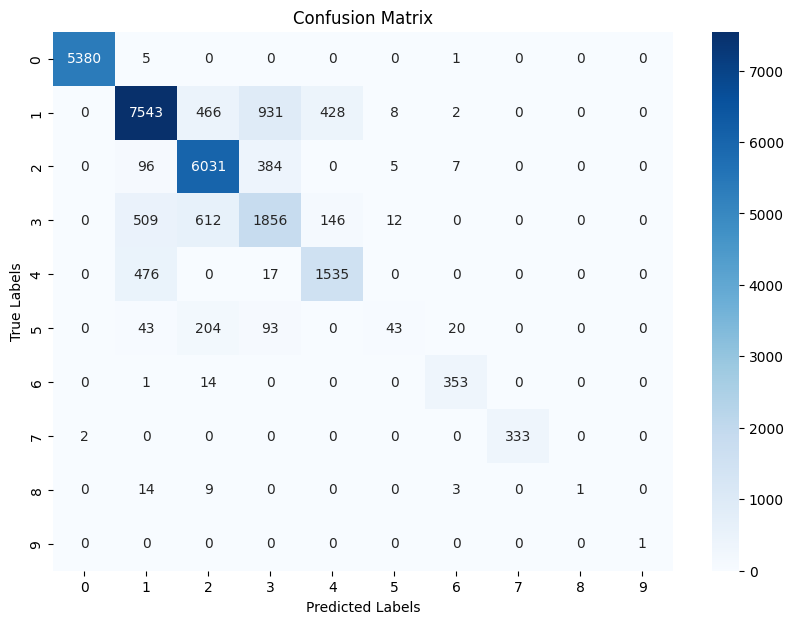

Start Round 17 ...
client_0: Loss = 0.3624, Accuracy = 0.8345
client_1: Loss = 0.3577, Accuracy = 0.8374
client_2: Loss = 0.3556, Accuracy = 0.8383
client_3: Loss = 0.3565, Accuracy = 0.8421
client_4: Loss = 0.3988, Accuracy = 0.8334
After round 17, train_loss = 0.6415, train_acc = 0.7703, dev_loss = 0.6607, dev_acc = 0.7645, test_loss = 0.6660, test_acc = 0.7649
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9985    0.9989     17907
           1     0.6447    0.9358    0.7634     31179
           2     0.9446    0.7997    0.8661     21643
           3     0.4907    0.3134    0.3825     10394
           4     0.5279    0.0674    0.1196      6585
           5     0.8251    0.1047    0.1858      1442
           6     0.9103    0.9726    0.9404      1169
           7     0.9940    0.9914    0.9927      1163
           8     0.8387    0.2989    0.4407        87
           9     1.0000    0.5000    0.6667        10


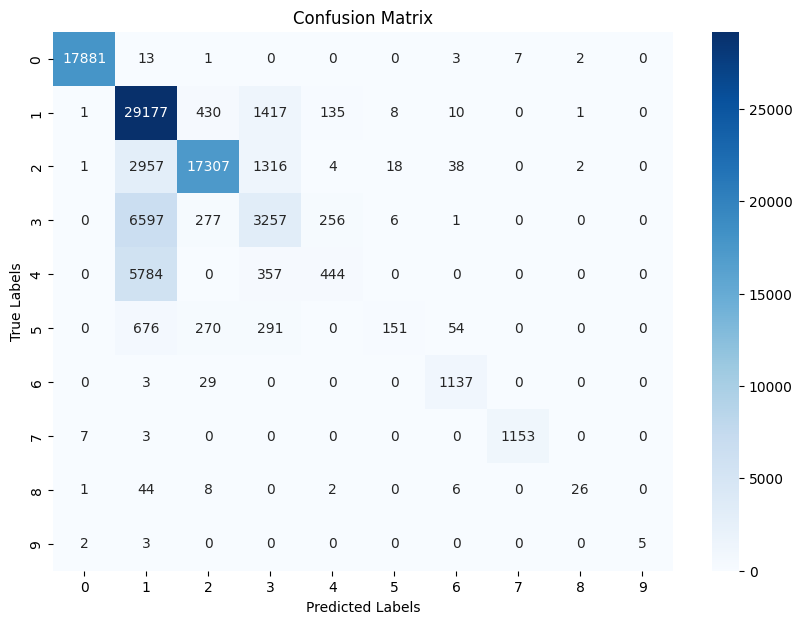

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9987    0.9988      3734
           1     0.6349    0.9285    0.7541      6296
           2     0.9397    0.7952    0.8614      4468
           3     0.4755    0.3048    0.3714      2100
           4     0.5030    0.0608    0.1085      1381
           5     0.7838    0.0963    0.1716       301
           6     0.8980    0.9786    0.9366       234
           7     0.9911    0.9867    0.9889       226
           8     0.8333    0.3333    0.4762        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7644     18758
   macro avg     0.7058    0.5483    0.5668     18758
weighted avg     0.7624    0.7644    0.7334     18758



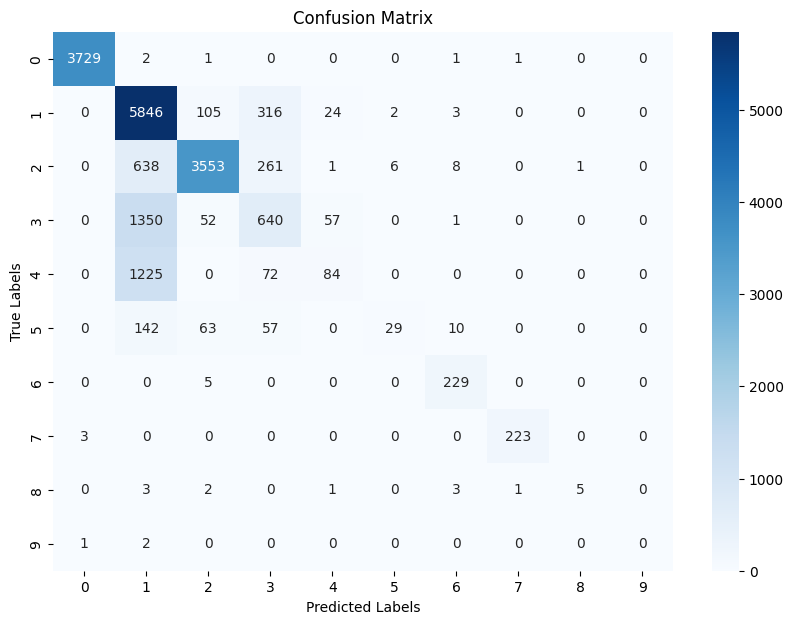

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9972    0.9984      5386
           1     0.6384    0.9318    0.7577      9378
           2     0.9393    0.8021    0.8653      6523
           3     0.4715    0.2871    0.3569      3135
           4     0.5000    0.0611    0.1090      2028
           5     0.7049    0.1067    0.1853       403
           6     0.9103    0.9647    0.9367       368
           7     0.9911    0.9940    0.9925       335
           8     0.8750    0.2593    0.4000        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.7651     27584
   macro avg     0.8030    0.6404    0.6602     27584
weighted avg     0.7601    0.7651    0.7334     27584



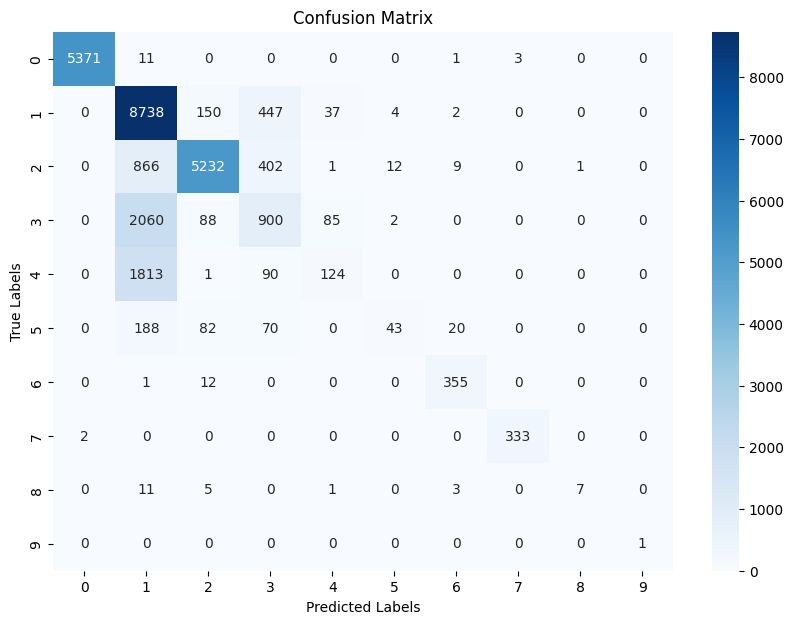

Start Round 18 ...
client_0: Loss = 0.3602, Accuracy = 0.8385
client_1: Loss = 0.3557, Accuracy = 0.8377
client_2: Loss = 0.368, Accuracy = 0.8381
client_3: Loss = 0.3532, Accuracy = 0.8425
client_4: Loss = 0.3606, Accuracy = 0.8433
After round 18, train_loss = 0.3528, train_acc = 0.8401, dev_loss = 0.3724, dev_acc = 0.8317, test_loss = 0.3667, test_acc = 0.8329
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9995    0.9994     17907
           1     0.8622    0.8228    0.8420     31179
           2     0.7781    0.9667    0.8622     21643
           3     0.6538    0.4896    0.5599     10394
           4     0.7498    0.7438    0.7468      6585
           5     0.6029    0.0874    0.1526      1442
           6     0.8891    0.9940    0.9386      1169
           7     0.9965    0.9897    0.9931      1163
           8     0.8710    0.3103    0.4576        87
           9     0.8750    0.7000    0.7778        10



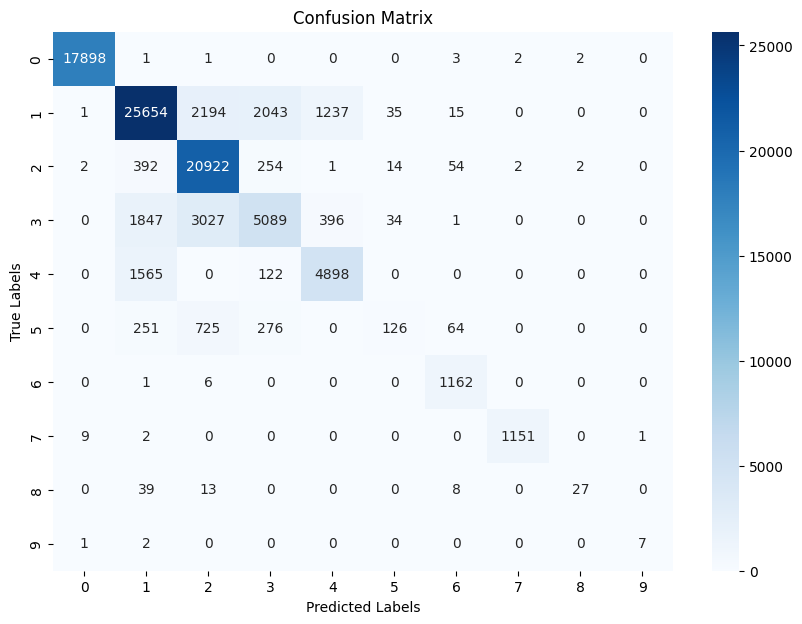

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.9989    0.9992      3734
           1     0.8502    0.8107    0.8300      6296
           2     0.7696    0.9586    0.8538      4468
           3     0.6241    0.4681    0.5350      2100
           4     0.7487    0.7335    0.7410      1381
           5     0.6667    0.0864    0.1529       301
           6     0.8889    0.9915    0.9374       234
           7     1.0000    0.9823    0.9911       226
           8     0.8000    0.2667    0.4000        15
           9     0.3333    0.3333    0.3333         3

    accuracy                         0.8315     18758
   macro avg     0.7681    0.6630    0.6774     18758
weighted avg     0.8272    0.8315    0.8218     18758



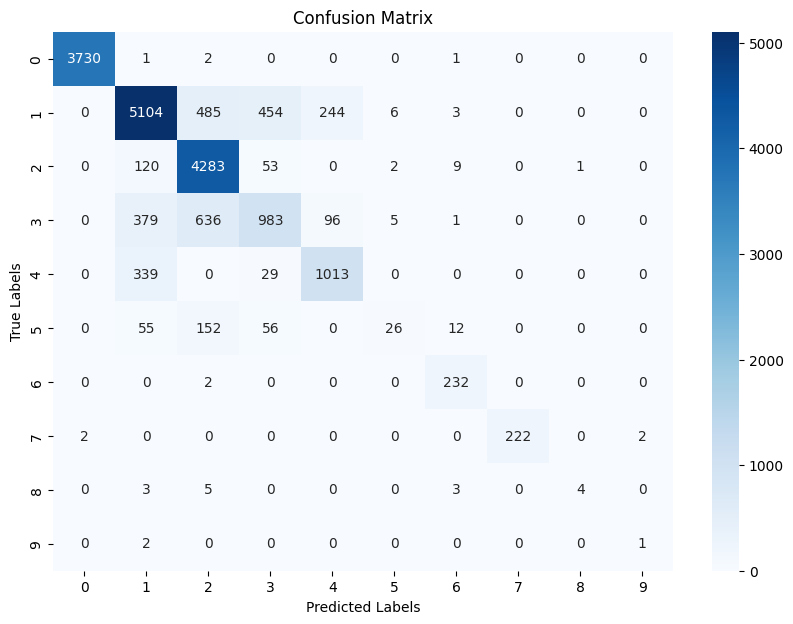

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9991    0.9993      5386
           1     0.8511    0.8150    0.8327      9378
           2     0.7757    0.9631    0.8593      6523
           3     0.6395    0.4651    0.5385      3135
           4     0.7269    0.7258    0.7264      2028
           5     0.6029    0.1017    0.1741       403
           6     0.8971    0.9946    0.9433       368
           7     1.0000    0.9940    0.9970       335
           8     1.0000    0.2963    0.4571        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8333     27584
   macro avg     0.8493    0.7355    0.7528     27584
weighted avg     0.8281    0.8333    0.8238     27584



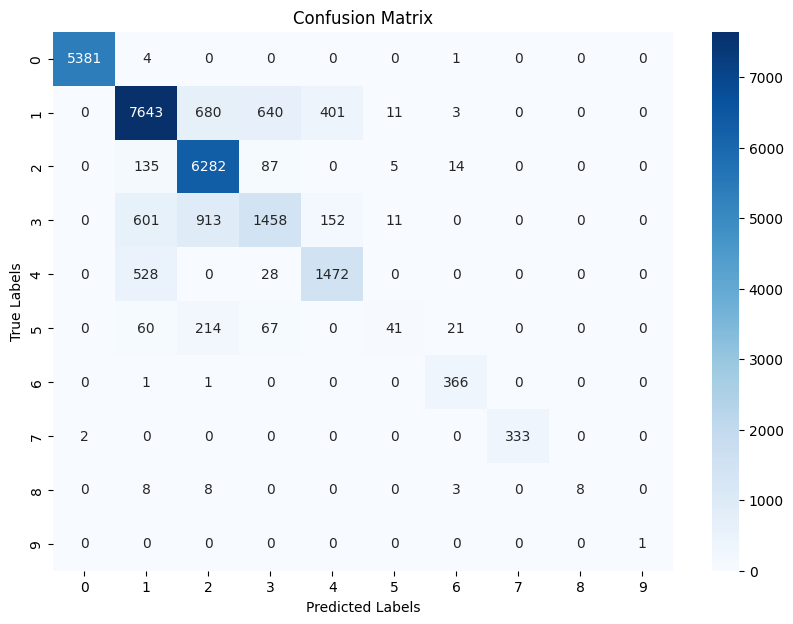

Start Round 19 ...
client_0: Loss = 0.3559, Accuracy = 0.8368
client_1: Loss = 0.3478, Accuracy = 0.8416
client_2: Loss = 0.3454, Accuracy = 0.8471
client_3: Loss = 0.3526, Accuracy = 0.843
client_4: Loss = 0.3504, Accuracy = 0.8435
After round 19, train_loss = 0.3978, train_acc = 0.7914, dev_loss = 0.4150, dev_acc = 0.7850, test_loss = 0.4148, test_acc = 0.7849
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9996    0.9994     17907
           1     0.6657    0.9542    0.7843     31179
           2     0.9253    0.8535    0.8880     21643
           3     0.5618    0.2071    0.3027     10394
           4     0.7709    0.2279    0.3519      6585
           5     0.4685    0.2427    0.3198      1442
           6     0.8973    0.9940    0.9432      1169
           7     0.9965    0.9897    0.9931      1163
           8     0.9091    0.3448    0.5000        87
           9     1.0000    0.2000    0.3333        10



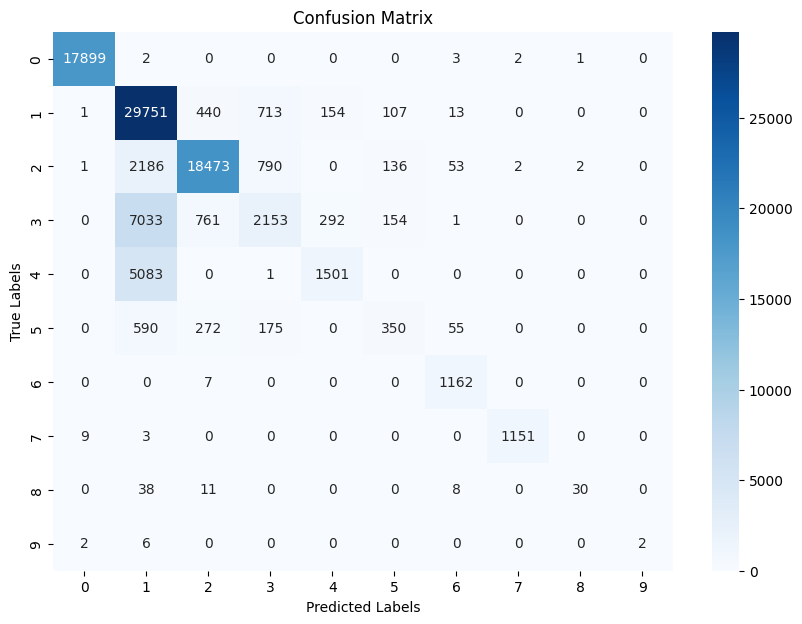

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9995    0.9992      3734
           1     0.6552    0.9455    0.7740      6296
           2     0.9185    0.8476    0.8816      4468
           3     0.5246    0.1981    0.2876      2100
           4     0.7764    0.2238    0.3474      1381
           5     0.4889    0.2193    0.3028       301
           6     0.8923    0.9915    0.9393       234
           7     1.0000    0.9823    0.9911       226
           8     0.8000    0.2667    0.4000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.7848     18758
   macro avg     0.7055    0.5674    0.5923     18758
weighted avg     0.7851    0.7848    0.7553     18758



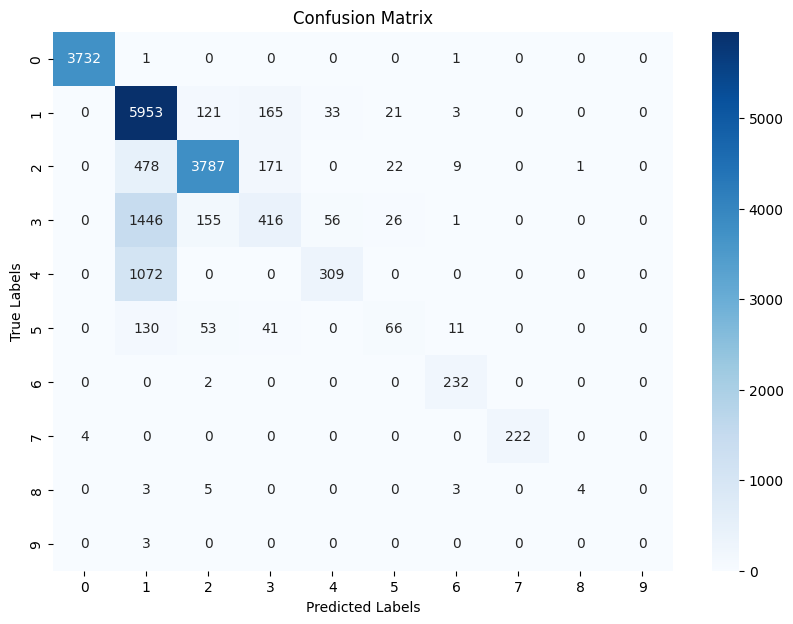

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9989    0.9993      5386
           1     0.6592    0.9500    0.7784      9378
           2     0.9228    0.8521    0.8860      6523
           3     0.5296    0.1914    0.2812      3135
           4     0.7143    0.2022    0.3151      2028
           5     0.4375    0.2258    0.2979       403
           6     0.8993    0.9946    0.9445       368
           7     1.0000    0.9940    0.9970       335
           8     1.0000    0.3333    0.5000        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.7851     27584
   macro avg     0.8162    0.6742    0.6999     27584
weighted avg     0.7818    0.7851    0.7540     27584



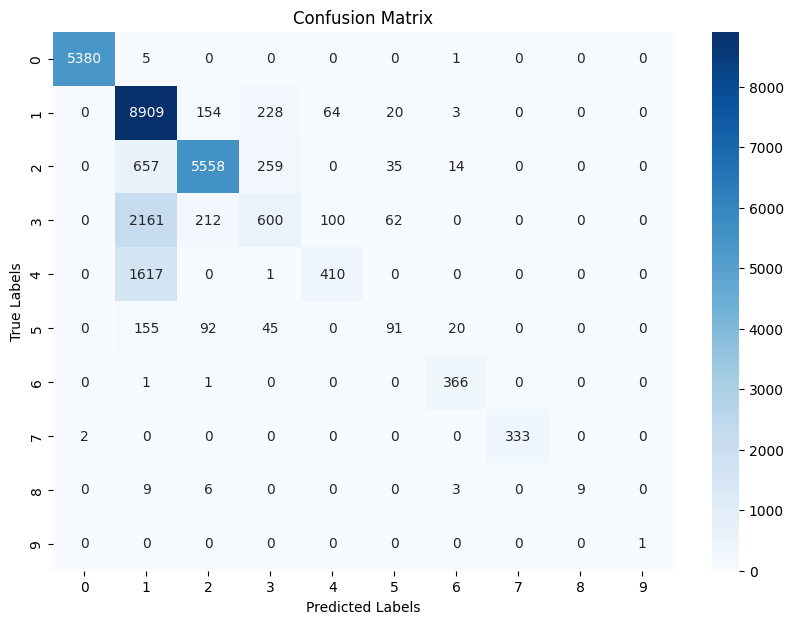

Start Round 20 ...
client_0: Loss = 0.353, Accuracy = 0.8399
client_1: Loss = 0.3441, Accuracy = 0.8418
client_2: Loss = 0.3404, Accuracy = 0.8484
client_3: Loss = 0.3471, Accuracy = 0.8437
client_4: Loss = 0.3492, Accuracy = 0.8448
After round 20, train_loss = 0.3500, train_acc = 0.8448, dev_loss = 0.3650, dev_acc = 0.8368, test_loss = 0.3659, test_acc = 0.8356
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9995    0.9993     17907
           1     0.9220    0.7802    0.8452     31179
           2     0.8547    0.8976    0.8756     21643
           3     0.5939    0.6460    0.6189     10394
           4     0.7146    0.9186    0.8039      6585
           5     0.2696    0.4459    0.3360      1442
           6     0.9378    0.9547    0.9462      1169
           7     0.9974    0.9905    0.9940      1163
           8     0.8636    0.4368    0.5802        87
           9     1.0000    0.6000    0.7500        10



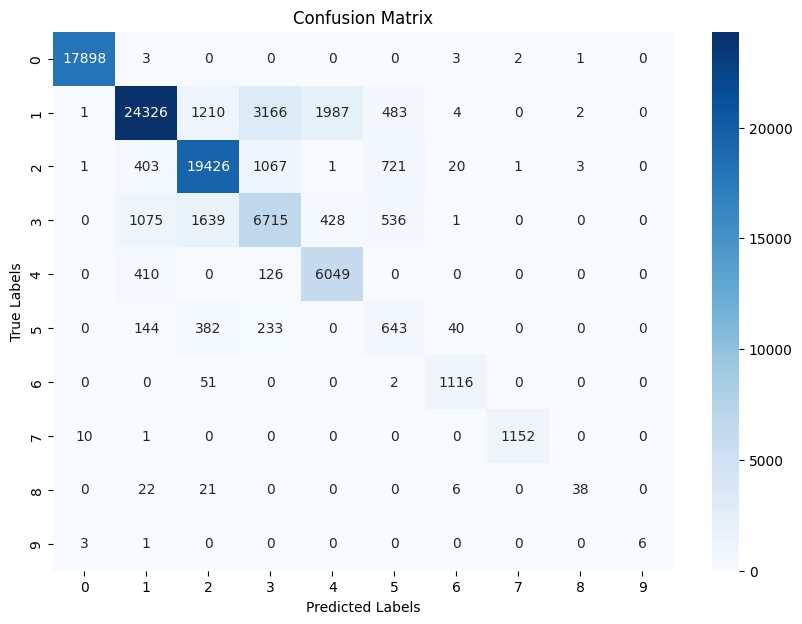

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.9130    0.7679    0.8342      6296
           2     0.8435    0.8928    0.8675      4468
           3     0.5755    0.6300    0.6015      2100
           4     0.7072    0.9008    0.7924      1381
           5     0.2595    0.4086    0.3174       301
           6     0.9364    0.9444    0.9404       234
           7     1.0000    0.9823    0.9911       226
           8     0.8000    0.2667    0.4000        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8367     18758
   macro avg     0.8034    0.7126    0.7243     18758
weighted avg     0.8513    0.8367    0.8403     18758



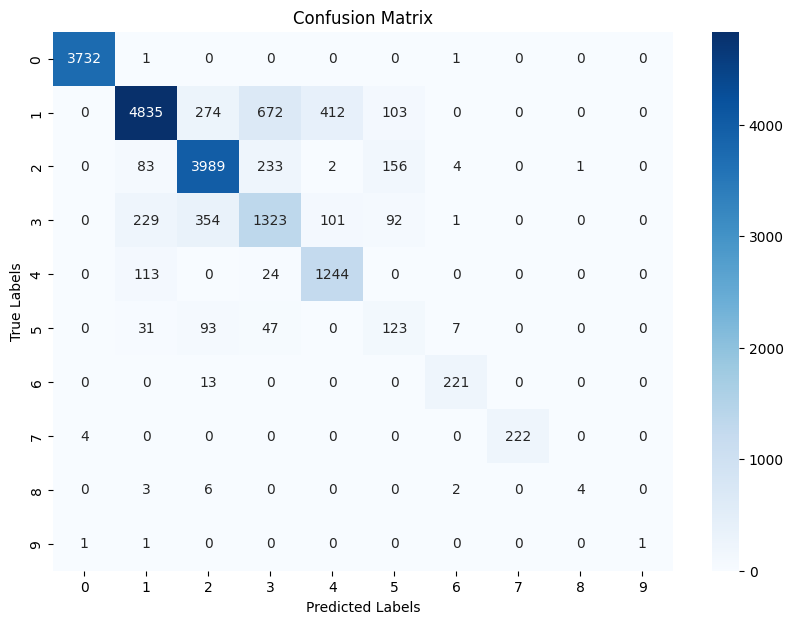

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9989    0.9993      5386
           1     0.9143    0.7705    0.8363      9378
           2     0.8433    0.8941    0.8679      6523
           3     0.5743    0.6077    0.5905      3135
           4     0.7022    0.9093    0.7924      2028
           5     0.2444    0.4342    0.3128       403
           6     0.9286    0.9538    0.9410       368
           7     1.0000    0.9940    0.9970       335
           8     0.8333    0.3704    0.5128        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8359     27584
   macro avg     0.8040    0.7933    0.7850     27584
weighted avg     0.8513    0.8359    0.8398     27584



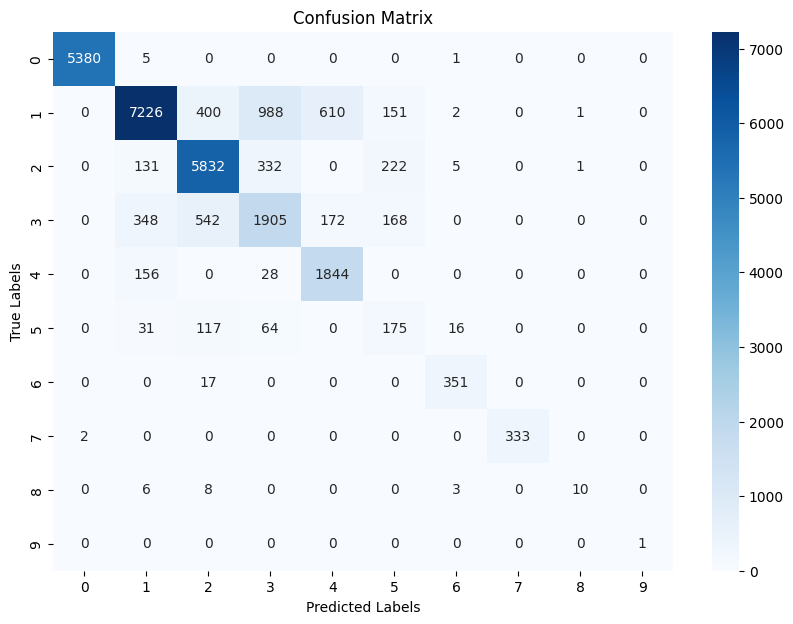

Start Round 21 ...
client_0: Loss = 0.3476, Accuracy = 0.8423
client_1: Loss = 0.3511, Accuracy = 0.8417
client_2: Loss = 0.3367, Accuracy = 0.8532
client_3: Loss = 0.3457, Accuracy = 0.8437
client_4: Loss = 0.3439, Accuracy = 0.8503
After round 21, train_loss = 0.3467, train_acc = 0.8444, dev_loss = 0.3625, dev_acc = 0.8337, test_loss = 0.3592, test_acc = 0.8342
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9996    0.9994     17907
           1     0.8151    0.8587    0.8363     31179
           2     0.9126    0.8613    0.8862     21643
           3     0.5763    0.6346    0.6041     10394
           4     0.7882    0.7386    0.7626      6585
           5     0.6747    0.1352    0.2253      1442
           6     0.9062    0.9914    0.9469      1169
           7     0.9991    0.9905    0.9948      1163
           8     0.8958    0.4943    0.6370        87
           9     1.0000    0.4000    0.5714        10


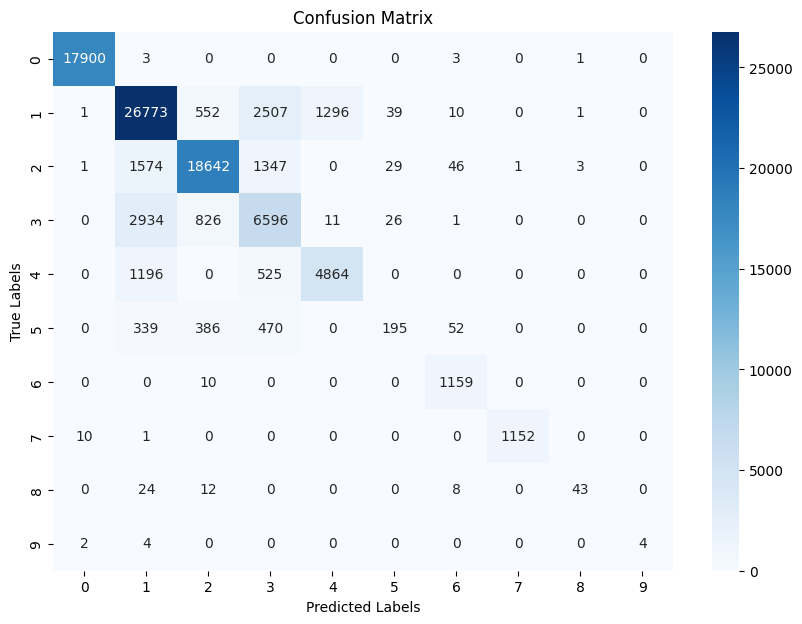

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.7977    0.8431    0.8198      6296
           2     0.9060    0.8585    0.8816      4468
           3     0.5430    0.6014    0.5707      2100
           4     0.7905    0.7212    0.7543      1381
           5     0.6613    0.1362    0.2259       301
           6     0.9027    0.9915    0.9450       234
           7     1.0000    0.9823    0.9911       226
           8     0.8333    0.3333    0.4762        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.8335     18758
   macro avg     0.7433    0.6467    0.6664     18758
weighted avg     0.8359    0.8335    0.8312     18758



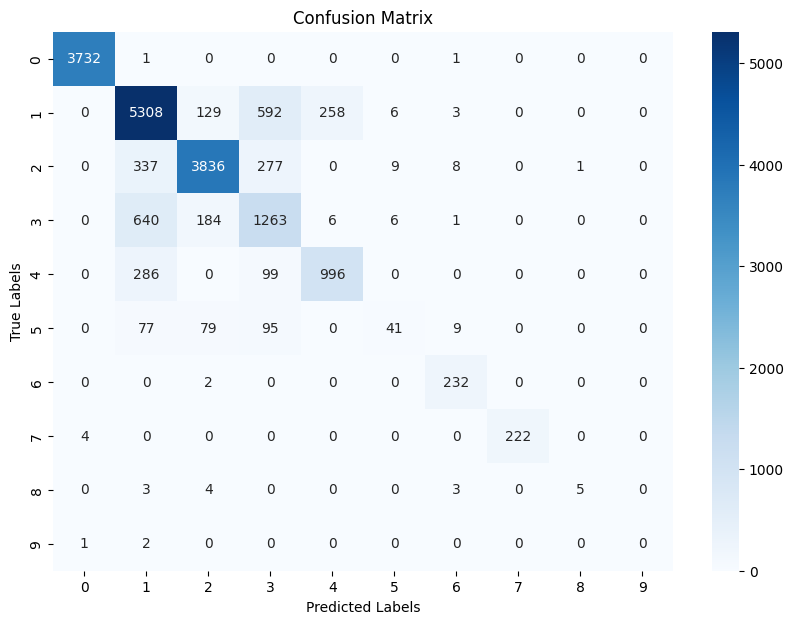

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9989    0.9993      5386
           1     0.7979    0.8480    0.8222      9378
           2     0.9031    0.8544    0.8781      6523
           3     0.5622    0.5968    0.5790      3135
           4     0.7767    0.7273    0.7512      2028
           5     0.6154    0.1390    0.2267       403
           6     0.9125    0.9918    0.9505       368
           7     1.0000    0.9940    0.9970       335
           8     0.9091    0.3704    0.5263        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8344     27584
   macro avg     0.8476    0.7521    0.7730     27584
weighted avg     0.8352    0.8344    0.8320     27584



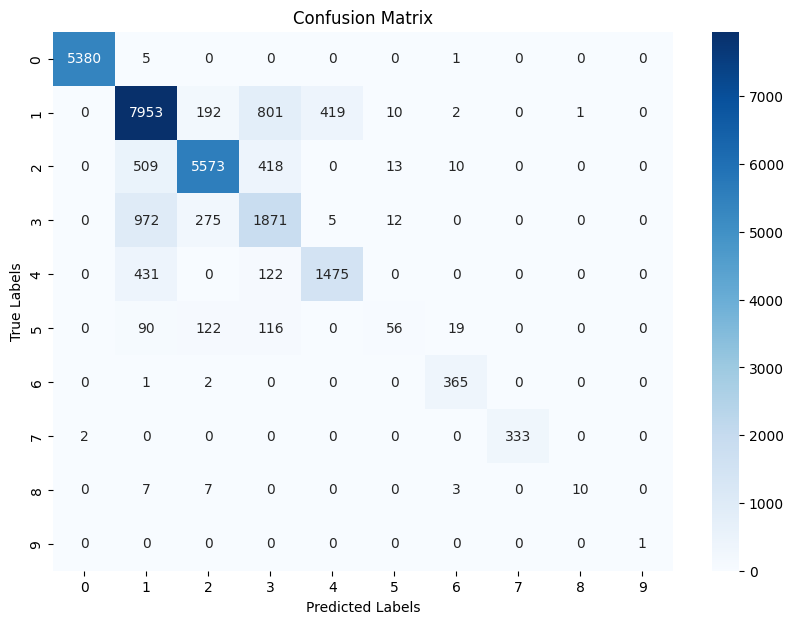

Start Round 22 ...
client_0: Loss = 0.3411, Accuracy = 0.8452
client_1: Loss = 0.3384, Accuracy = 0.8462
client_2: Loss = 0.3374, Accuracy = 0.8509
client_3: Loss = 0.3402, Accuracy = 0.8477
client_4: Loss = 0.3424, Accuracy = 0.8482
After round 22, train_loss = 0.3391, train_acc = 0.8508, dev_loss = 0.3592, dev_acc = 0.8398, test_loss = 0.3562, test_acc = 0.8409
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9993    0.9996    0.9995     17907
           1     0.8940    0.8031    0.8461     31179
           2     0.8847    0.8948    0.8898     21643
           3     0.5694    0.6692    0.6153     10394
           4     0.6924    0.9330    0.7949      6585
           5     0.7441    0.1089    0.1900      1442
           6     0.9153    0.9803    0.9467      1169
           7     0.9974    0.9905    0.9940      1163
           8     0.8182    0.5172    0.6338        87
           9     1.0000    0.7000    0.8235        10


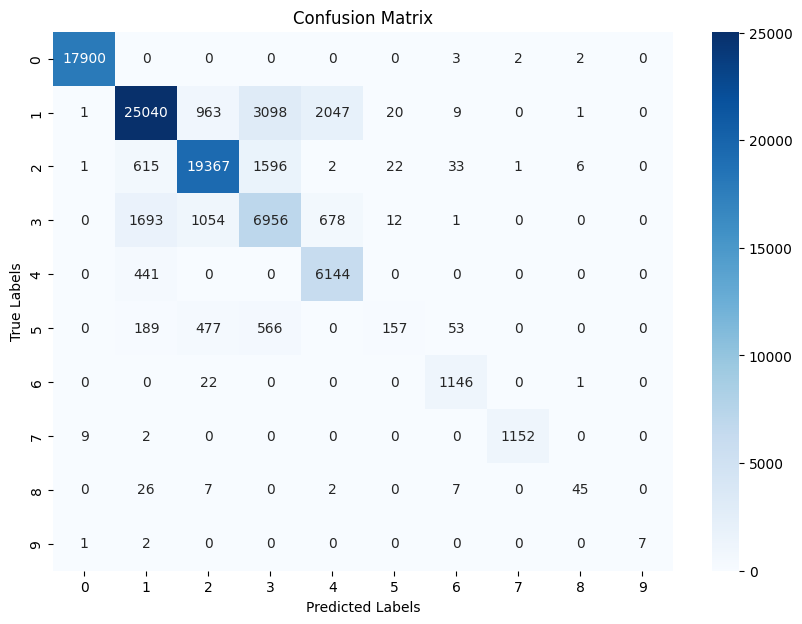

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.8785    0.7857    0.8295      6296
           2     0.8717    0.8854    0.8785      4468
           3     0.5409    0.6386    0.5857      2100
           4     0.6924    0.9290    0.7934      1381
           5     0.7949    0.1030    0.1824       301
           6     0.9124    0.9786    0.9443       234
           7     1.0000    0.9823    0.9911       226
           8     0.8571    0.4000    0.5455        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8395     18758
   macro avg     0.8547    0.7035    0.7250     18758
weighted avg     0.8499    0.8395    0.8377     18758



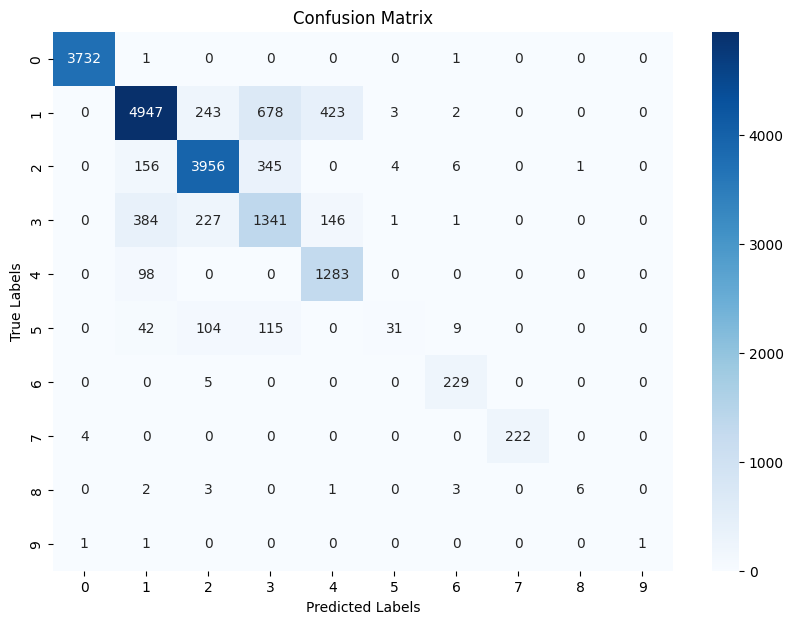

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9989    0.9992      5386
           1     0.8814    0.7922    0.8344      9378
           2     0.8745    0.8873    0.8808      6523
           3     0.5516    0.6354    0.5906      3135
           4     0.6803    0.9191    0.7819      2028
           5     0.7231    0.1166    0.2009       403
           6     0.9175    0.9674    0.9418       368
           7     1.0000    0.9940    0.9970       335
           8     0.8000    0.4444    0.5714        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8411     27584
   macro avg     0.8428    0.7755    0.7798     27584
weighted avg     0.8501    0.8411    0.8399     27584



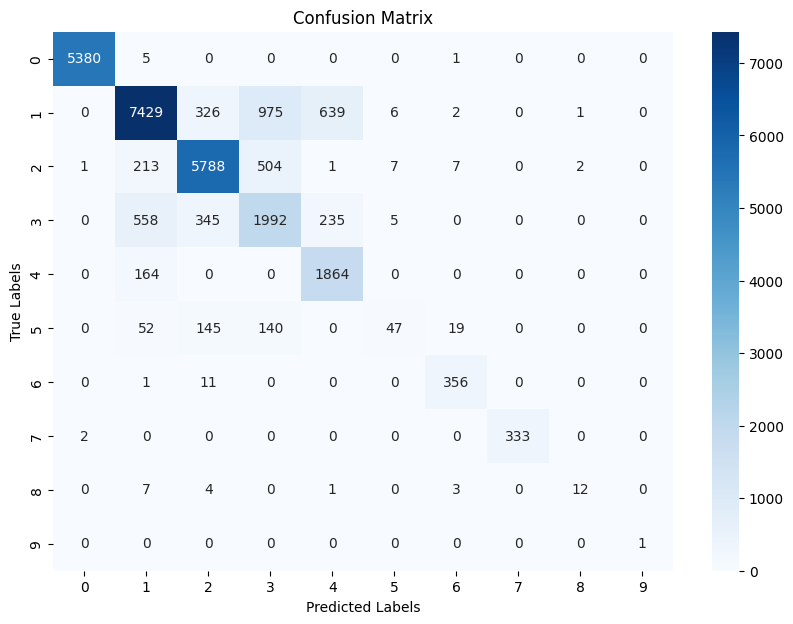

Start Round 23 ...
client_0: Loss = 0.3469, Accuracy = 0.8447
client_1: Loss = 0.3333, Accuracy = 0.8481
client_2: Loss = 0.3495, Accuracy = 0.8487
client_3: Loss = 0.3381, Accuracy = 0.8496
client_4: Loss = 0.3422, Accuracy = 0.8481
After round 23, train_loss = 0.3513, train_acc = 0.8440, dev_loss = 0.3732, dev_acc = 0.8339, test_loss = 0.3688, test_acc = 0.8370
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9997    0.9996     17907
           1     0.9312    0.7689    0.8423     31179
           2     0.9416    0.8351    0.8851     21643
           3     0.5085    0.8075    0.6241     10394
           4     0.6783    0.9573    0.7940      6585
           5     0.6502    0.1831    0.2857      1442
           6     0.8932    0.9940    0.9409      1169
           7     0.9974    0.9948    0.9961      1163
           8     0.8596    0.5632    0.6806        87
           9     0.8889    0.8000    0.8421        10


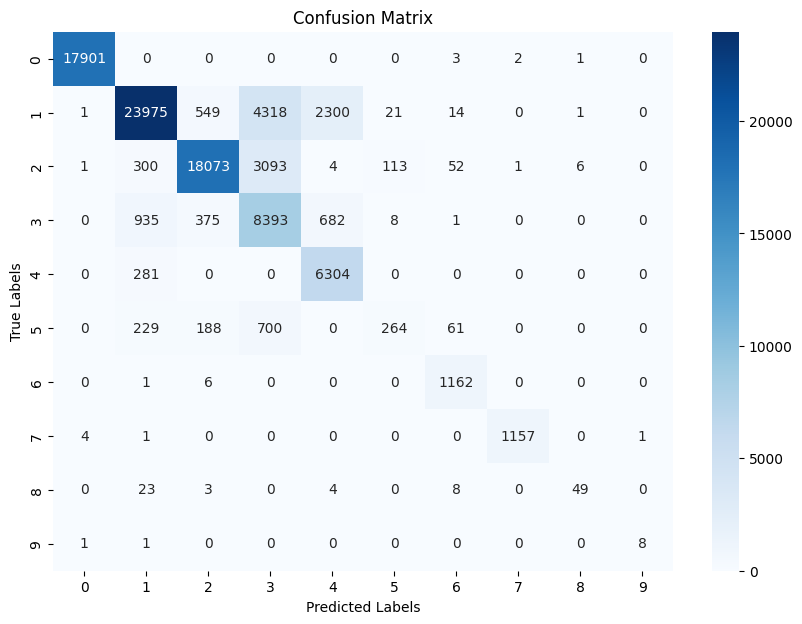

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9984    0.9995    0.9989      3734
           1     0.9184    0.7560    0.8293      6296
           2     0.9336    0.8214    0.8739      4468
           3     0.4837    0.7848    0.5985      2100
           4     0.6830    0.9515    0.7952      1381
           5     0.6279    0.1794    0.2791       301
           6     0.8958    0.9915    0.9412       234
           7     1.0000    0.9823    0.9911       226
           8     0.8571    0.4000    0.5455        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8337     18758
   macro avg     0.8398    0.7200    0.7353     18758
weighted avg     0.8679    0.8337    0.8396     18758



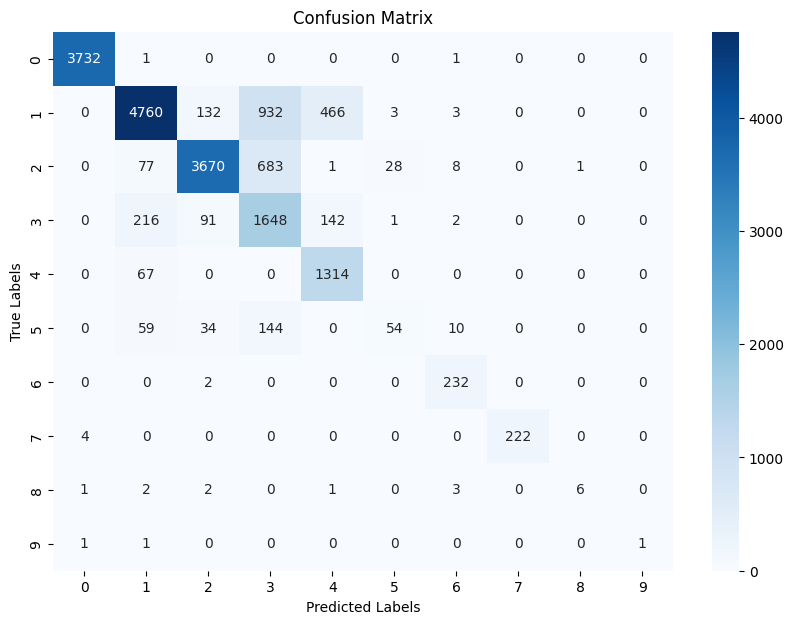

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9989    0.9993      5386
           1     0.9193    0.7608    0.8326      9378
           2     0.9373    0.8321    0.8816      6523
           3     0.4984    0.7796    0.6080      3135
           4     0.6683    0.9467    0.7835      2028
           5     0.6068    0.1762    0.2731       403
           6     0.8971    0.9946    0.9433       368
           7     1.0000    0.9970    0.9985       335
           8     0.8571    0.4444    0.5854        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8371     27584
   macro avg     0.8384    0.7930    0.7905     27584
weighted avg     0.8691    0.8371    0.8427     27584



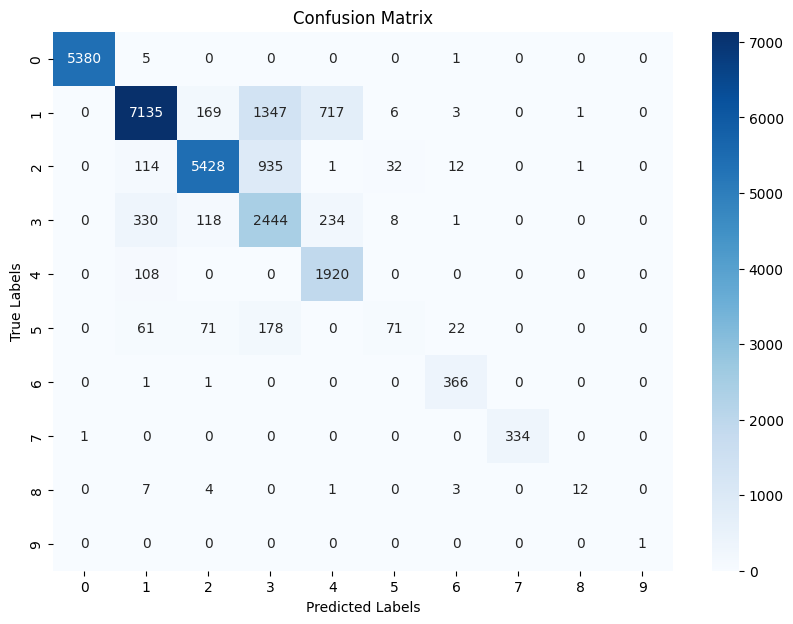

Start Round 24 ...
client_0: Loss = 0.3387, Accuracy = 0.8463
client_1: Loss = 0.3331, Accuracy = 0.849
client_2: Loss = 0.3276, Accuracy = 0.855
client_3: Loss = 0.3331, Accuracy = 0.8499
client_4: Loss = 0.3381, Accuracy = 0.8506
After round 24, train_loss = 0.3481, train_acc = 0.8419, dev_loss = 0.3673, dev_acc = 0.8313, test_loss = 0.3601, test_acc = 0.8352
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9996    0.9997     17907
           1     0.8517    0.8412    0.8464     31179
           2     0.7837    0.9729    0.8681     21643
           3     0.6589    0.4319    0.5218     10394
           4     0.7936    0.7136    0.7515      6585
           5     0.4570    0.2469    0.3206      1442
           6     0.9099    0.9940    0.9501      1169
           7     0.9966    0.9974    0.9970      1163
           8     0.9184    0.5172    0.6618        87
           9     0.8889    0.8000    0.8421        10

 

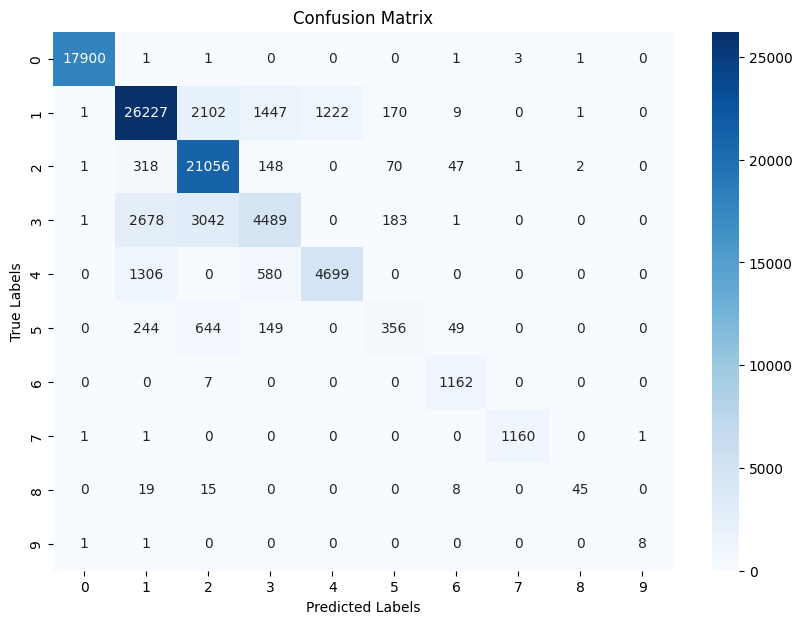

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.8373    0.8245    0.8308      6296
           2     0.7730    0.9678    0.8595      4468
           3     0.6137    0.4010    0.4850      2100
           4     0.7931    0.7024    0.7450      1381
           5     0.4768    0.2392    0.3186       301
           6     0.9206    0.9915    0.9547       234
           7     0.9955    0.9867    0.9911       226
           8     1.0000    0.2667    0.4211        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8312     18758
   macro avg     0.8409    0.6712    0.7105     18758
weighted avg     0.8231    0.8312    0.8210     18758



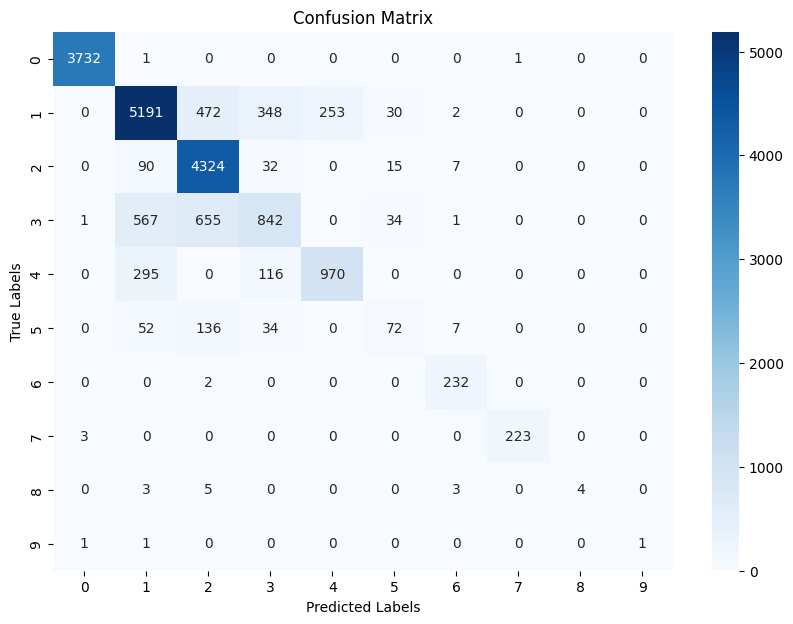

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9994    0.9994      5386
           1     0.8398    0.8308    0.8353      9378
           2     0.7815    0.9696    0.8655      6523
           3     0.6441    0.4093    0.5005      3135
           4     0.7801    0.7155    0.7464      2028
           5     0.4323    0.2457    0.3133       403
           6     0.9173    0.9946    0.9544       368
           7     1.0000    0.9940    0.9970       335
           8     0.8571    0.4444    0.5854        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8354     27584
   macro avg     0.8252    0.7603    0.7797     27584
weighted avg     0.8276    0.8354    0.8256     27584



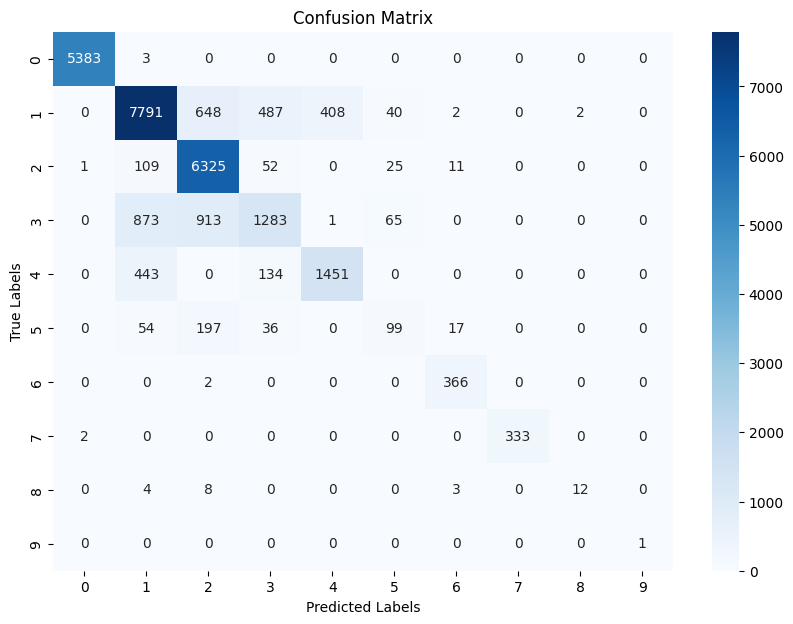

Start Round 25 ...
client_0: Loss = 0.3317, Accuracy = 0.8508
client_1: Loss = 0.3285, Accuracy = 0.8525
client_2: Loss = 0.3305, Accuracy = 0.854
client_3: Loss = 0.329, Accuracy = 0.8537
client_4: Loss = 0.3341, Accuracy = 0.8531
After round 25, train_loss = 0.3435, train_acc = 0.8491, dev_loss = 0.3656, dev_acc = 0.8409, test_loss = 0.3607, test_acc = 0.8418
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9998    0.9996     17907
           1     0.9386    0.7530    0.8356     31179
           2     0.8848    0.8988    0.8917     21643
           3     0.5536    0.7543    0.6385     10394
           4     0.6693    0.9906    0.7988      6585
           5     0.7585    0.1241    0.2133      1442
           6     0.8995    0.9949    0.9448      1169
           7     0.9991    0.9940    0.9966      1163
           8     0.8906    0.6552    0.7550        87
           9     0.8889    0.8000    0.8421        10

 

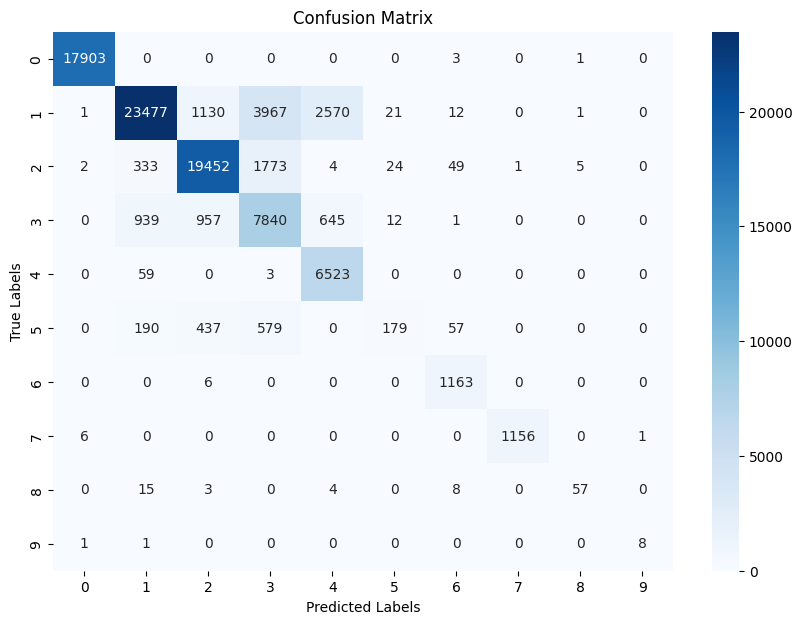

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9981    0.9995    0.9988      3734
           1     0.9299    0.7371    0.8224      6296
           2     0.8751    0.8939    0.8844      4468
           3     0.5313    0.7305    0.6152      2100
           4     0.6735    0.9935    0.8028      1381
           5     0.7059    0.1196    0.2045       301
           6     0.8992    0.9915    0.9431       234
           7     1.0000    0.9823    0.9911       226
           8     0.8571    0.4000    0.5455        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8408     18758
   macro avg     0.8470    0.7514    0.7608     18758
weighted avg     0.8637    0.8408    0.8410     18758



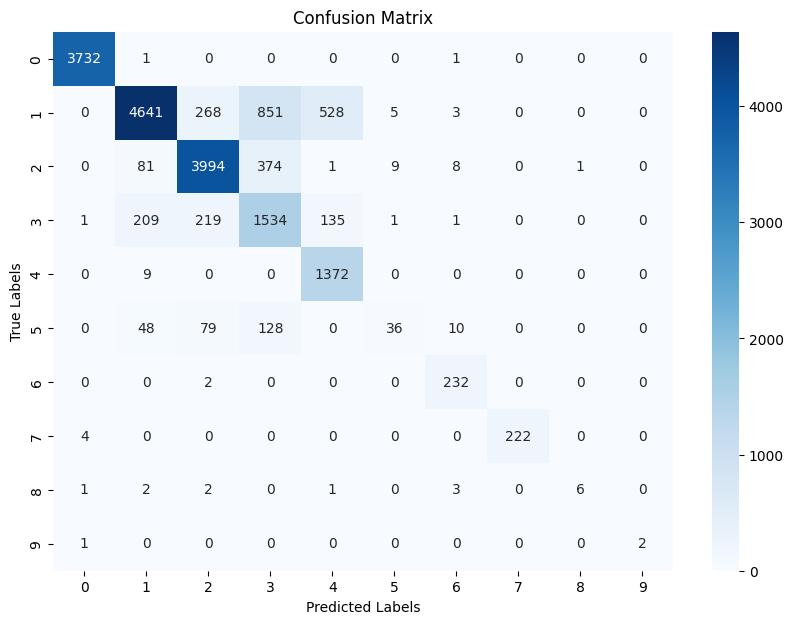

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9993    0.9994      5386
           1     0.9324    0.7425    0.8267      9378
           2     0.8767    0.8936    0.8851      6523
           3     0.5393    0.7244    0.6183      3135
           4     0.6617    0.9906    0.7934      2028
           5     0.6974    0.1315    0.2213       403
           6     0.9059    0.9946    0.9482       368
           7     1.0000    0.9940    0.9970       335
           8     0.7619    0.5926    0.6667        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8419     27584
   macro avg     0.8375    0.8063    0.7956     27584
weighted avg     0.8646    0.8419    0.8428     27584



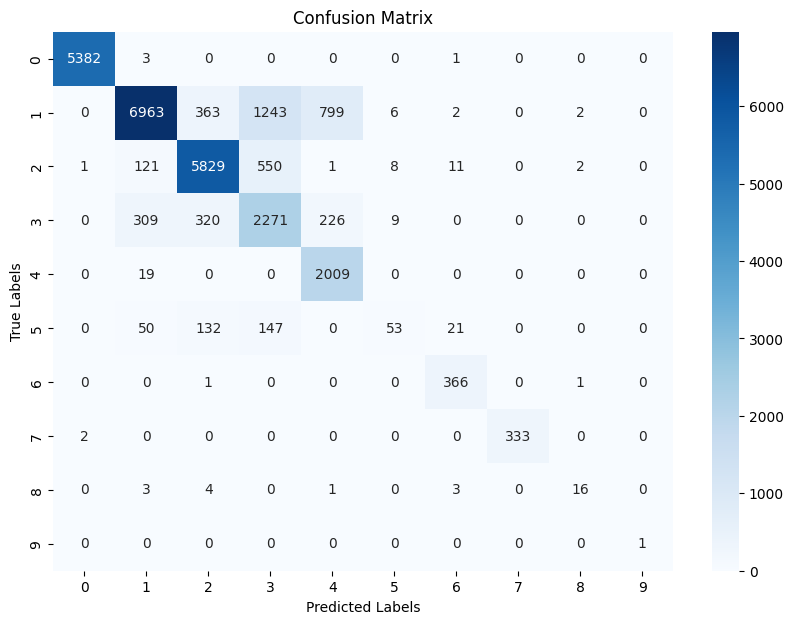

Start Round 26 ...
client_0: Loss = 0.3324, Accuracy = 0.8497
client_1: Loss = 0.3272, Accuracy = 0.8541
client_2: Loss = 0.3197, Accuracy = 0.8597
client_3: Loss = 0.3312, Accuracy = 0.85
client_4: Loss = 0.3429, Accuracy = 0.8512
After round 26, train_loss = 0.3400, train_acc = 0.8442, dev_loss = 0.3593, dev_acc = 0.8323, test_loss = 0.3539, test_acc = 0.8354
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.9997    0.9996     17907
           1     0.8479    0.8283    0.8380     31179
           2     0.8570    0.9245    0.8895     21643
           3     0.6084    0.4745    0.5332     10394
           4     0.6875    0.9013    0.7800      6585
           5     0.5446    0.2288    0.3223      1442
           6     0.8967    0.9949    0.9432      1169
           7     0.9983    0.9931    0.9957      1163
           8     0.9630    0.5977    0.7376        87
           9     1.0000    0.8000    0.8889        10

 

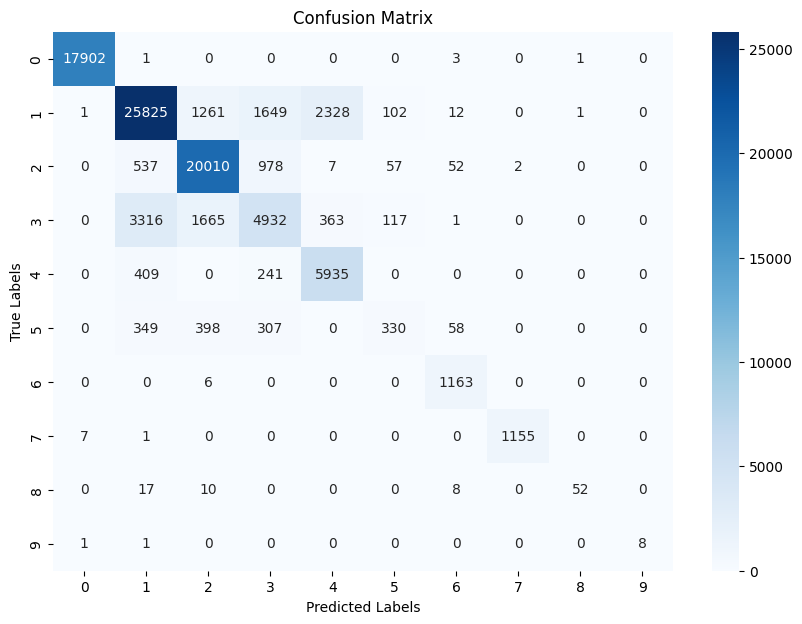

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.8349    0.8081    0.8213      6296
           2     0.8468    0.9179    0.8809      4468
           3     0.5570    0.4424    0.4931      2100
           4     0.6821    0.8979    0.7752      1381
           5     0.5263    0.1993    0.2892       301
           6     0.9027    0.9915    0.9450       234
           7     1.0000    0.9823    0.9911       226
           8     1.0000    0.2667    0.4211        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8321     18758
   macro avg     0.8348    0.6839    0.7116     18758
weighted avg     0.8260    0.8321    0.8254     18758



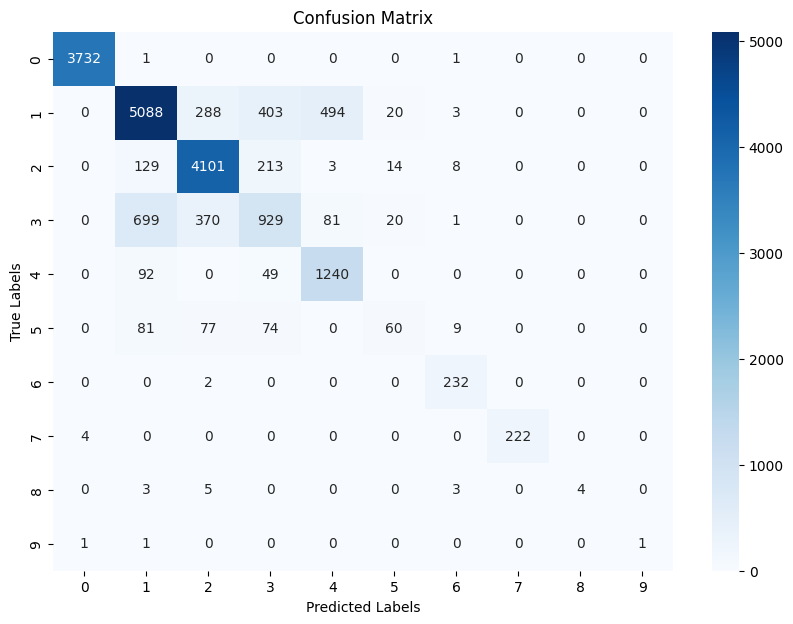

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9994    0.9995      5386
           1     0.8367    0.8187    0.8276      9378
           2     0.8502    0.9178    0.8827      6523
           3     0.5787    0.4351    0.4967      3135
           4     0.6805    0.9053    0.7770      2028
           5     0.5000    0.2134    0.2991       403
           6     0.9059    0.9946    0.9482       368
           7     1.0000    0.9970    0.9985       335
           8     0.8571    0.4444    0.5854        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8355     27584
   macro avg     0.8209    0.7726    0.7815     27584
weighted avg     0.8289    0.8355    0.8286     27584



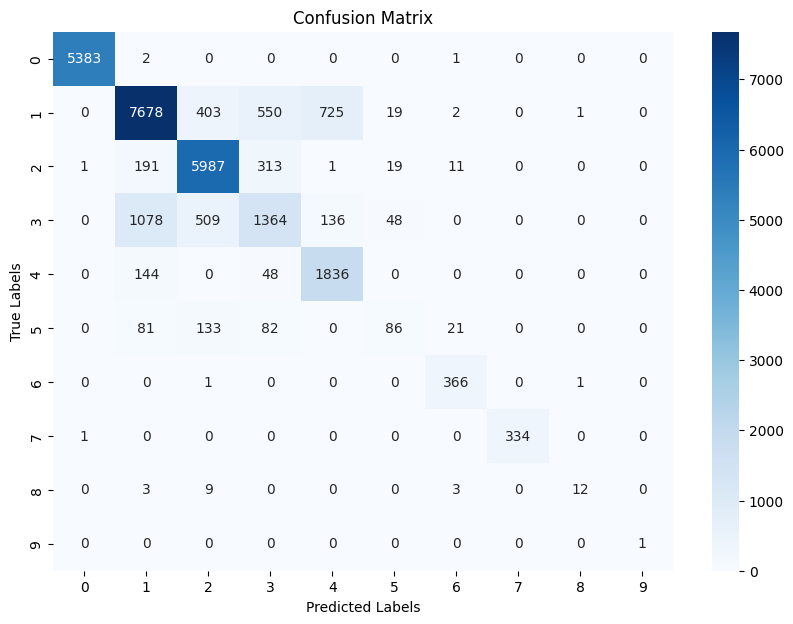

Start Round 27 ...
client_0: Loss = 0.3308, Accuracy = 0.8498
client_1: Loss = 0.3305, Accuracy = 0.8525
client_2: Loss = 0.3229, Accuracy = 0.8558
client_3: Loss = 0.3253, Accuracy = 0.8538
client_4: Loss = 1.1061, Accuracy = 0.663
After round 27, train_loss = 1.2393, train_acc = 0.5782, dev_loss = 1.2494, dev_acc = 0.5668, test_loss = 1.2537, test_acc = 0.5755
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.2367    0.3827     17907
           1     0.7910    0.5529    0.6509     31179
           2     0.5029    0.8041    0.6188     21643
           3     0.4479    0.6469    0.5293     10394
           4     0.4316    0.9443    0.5924      6585
           5     0.0324    0.0042    0.0074      1442
           6     0.8455    0.9641    0.9009      1169
           7     0.0000    0.0000    0.0000      1163
           8     1.0000    0.0115    0.0227        87
           9     0.0000    0.0000    0.0000        10



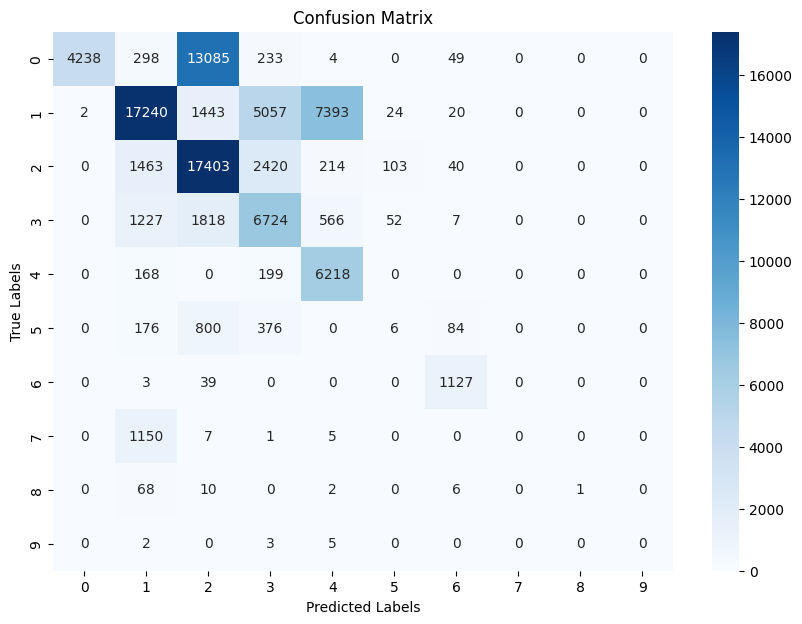

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     1.0000    0.2333    0.3783      3734
           1     0.7751    0.5348    0.6329      6296
           2     0.4967    0.8001    0.6129      4468
           3     0.4315    0.6210    0.5092      2100
           4     0.4269    0.9319    0.5855      1381
           5     0.0000    0.0000    0.0000       301
           6     0.8401    0.9658    0.8986       234
           7     0.0000    0.0000    0.0000       226
           8     0.0000    0.0000    0.0000        15
           9     0.0000    0.0000    0.0000         3

    accuracy                         0.5667     18758
   macro avg     0.3970    0.4087    0.3617     18758
weighted avg     0.6677    0.5667    0.5450     18758



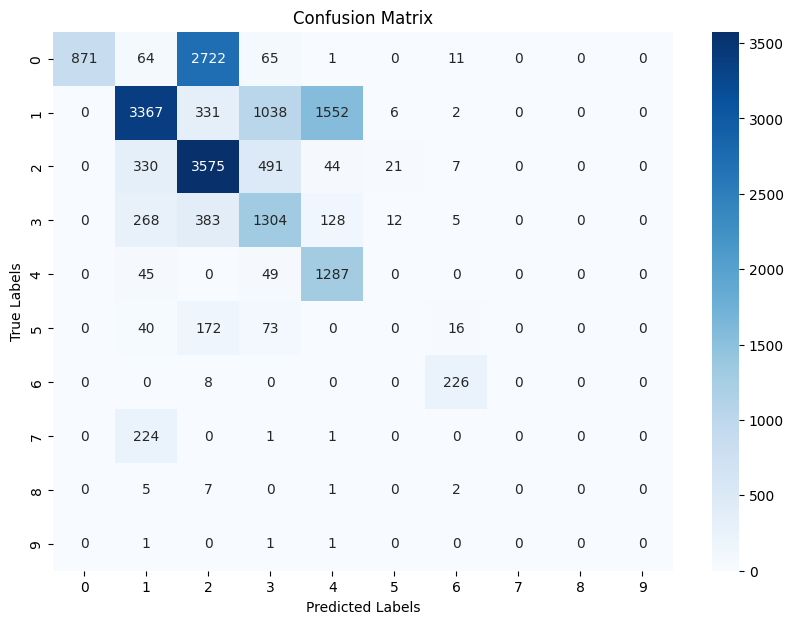

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9984    0.2347    0.3800      5386
           1     0.7877    0.5480    0.6463      9378
           2     0.5022    0.8071    0.6192      6523
           3     0.4414    0.6188    0.5153      3135
           4     0.4394    0.9610    0.6030      2028
           5     0.0152    0.0025    0.0043       403
           6     0.8547    0.9592    0.9040       368
           7     0.0000    0.0000    0.0000       335
           8     0.0000    0.0000    0.0000        27
           9     0.0000    0.0000    0.0000         1

    accuracy                         0.5768     27584
   macro avg     0.4039    0.4131    0.3672     27584
weighted avg     0.6756    0.5768    0.5554     27584



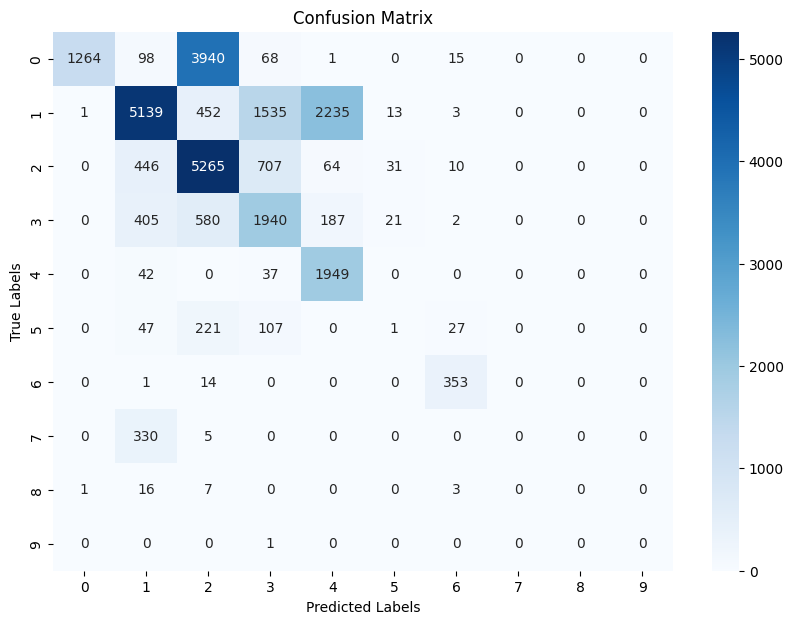

Start Round 28 ...
client_0: Loss = 0.3317, Accuracy = 0.849
client_1: Loss = 0.3342, Accuracy = 0.8516
client_2: Loss = 0.3223, Accuracy = 0.8564
client_3: Loss = 0.327, Accuracy = 0.8534
client_4: Loss = 0.3298, Accuracy = 0.851
After round 28, train_loss = 0.3540, train_acc = 0.8315, dev_loss = 0.3773, dev_acc = 0.8223, test_loss = 0.3704, test_acc = 0.8233
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.9996    0.9995     17907
           1     0.8878    0.7894    0.8357     31179
           2     0.9606    0.8138    0.8811     21643
           3     0.4792    0.9489    0.6368     10394
           4     0.8371    0.5456    0.6607      6585
           5     0.7857    0.1373    0.2338      1442
           6     0.9183    0.9906    0.9531      1169
           7     0.9974    0.9948    0.9961      1163
           8     0.8772    0.5747    0.6944        87
           9     1.0000    0.8000    0.8889        10

  

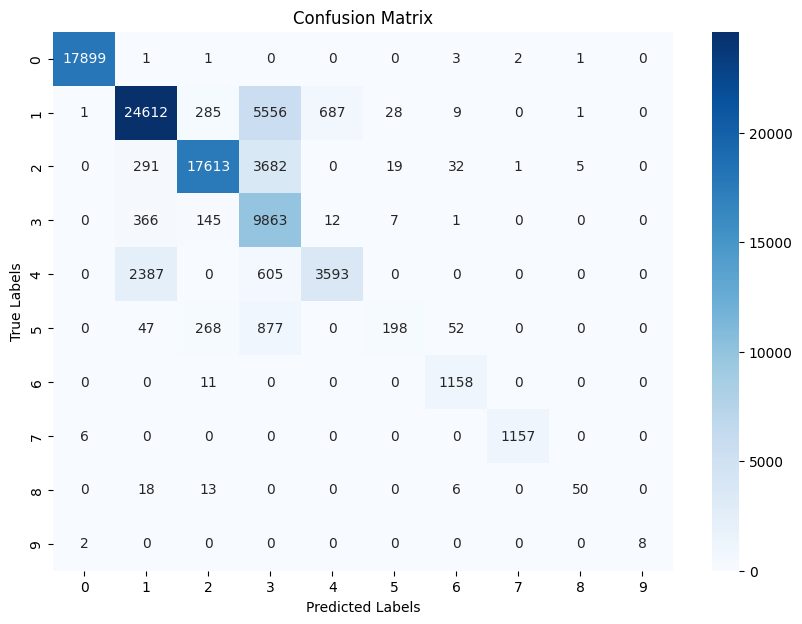

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9992    0.9989      3734
           1     0.8764    0.7773    0.8239      6296
           2     0.9568    0.8030    0.8732      4468
           3     0.4628    0.9386    0.6199      2100
           4     0.8315    0.5358    0.6517      1381
           5     0.6897    0.1329    0.2228       301
           6     0.9091    0.9829    0.9446       234
           7     1.0000    0.9823    0.9911       226
           8     0.8000    0.2667    0.4000        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8221     18758
   macro avg     0.8525    0.6752    0.7026     18758
weighted avg     0.8691    0.8221    0.8285     18758



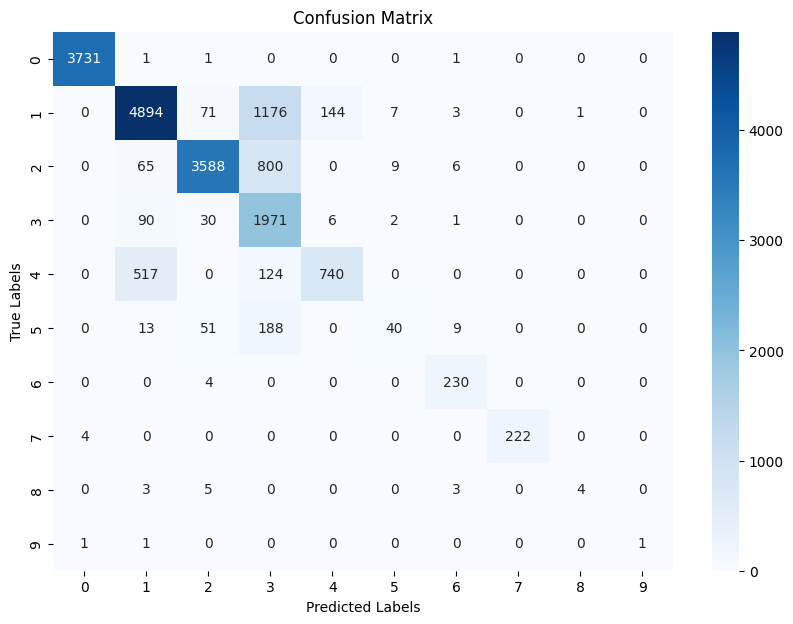

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9994    0.9996      5386
           1     0.8722    0.7759    0.8212      9378
           2     0.9564    0.8107    0.8775      6523
           3     0.4721    0.9289    0.6260      3135
           4     0.8129    0.5335    0.6442      2028
           5     0.7349    0.1514    0.2510       403
           6     0.9188    0.9837    0.9501       368
           7     1.0000    0.9970    0.9985       335
           8     0.7222    0.4815    0.5778        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8234     27584
   macro avg     0.8489    0.7662    0.7746     27584
weighted avg     0.8672    0.8234    0.8295     27584



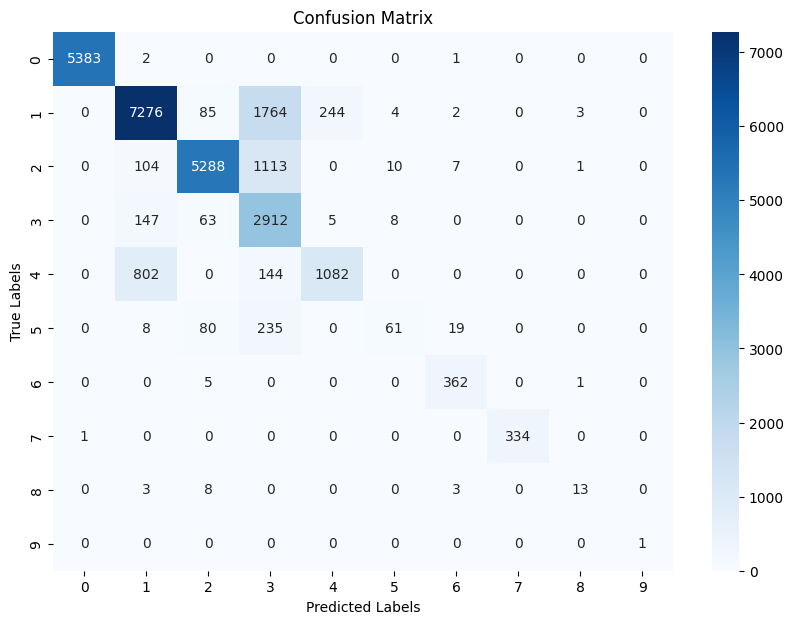

Start Round 29 ...
client_0: Loss = 0.3262, Accuracy = 0.8519
client_1: Loss = 0.3223, Accuracy = 0.8527
client_2: Loss = 0.314, Accuracy = 0.8613
client_3: Loss = 0.3304, Accuracy = 0.8525
client_4: Loss = 0.3245, Accuracy = 0.8553
After round 29, train_loss = 0.3394, train_acc = 0.8478, dev_loss = 0.3612, dev_acc = 0.8390, test_loss = 0.3574, test_acc = 0.8420
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.9997    0.9996     17907
           1     0.9607    0.7499    0.8423     31179
           2     0.9260    0.8654    0.8947     21643
           3     0.5022    0.9189    0.6494     10394
           4     0.7516    0.8465    0.7962      6585
           5     0.7348    0.1345    0.2274      1442
           6     0.9441    0.9393    0.9417      1169
           7     0.9983    0.9957    0.9970      1163
           8     0.7403    0.6552    0.6951        87
           9     1.0000    0.7000    0.8235        10



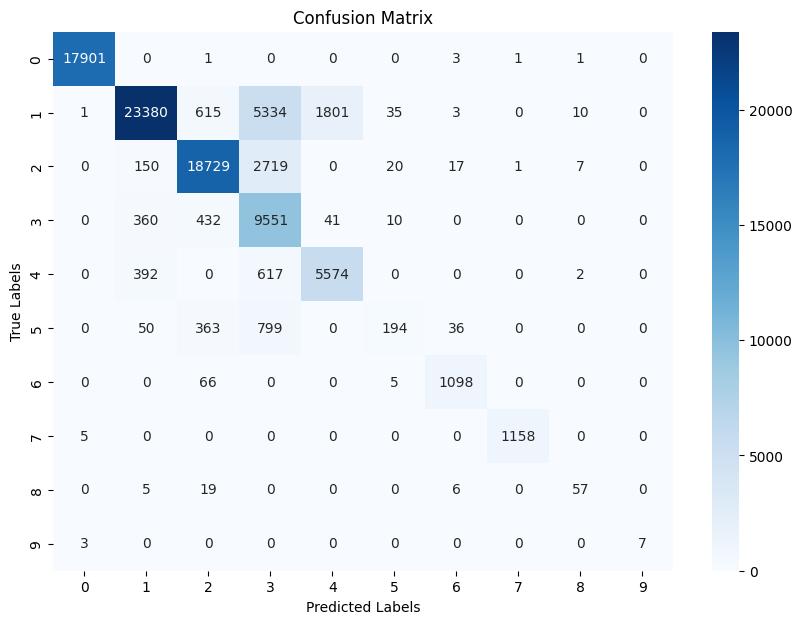

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9992    0.9989      3734
           1     0.9538    0.7381    0.8322      6296
           2     0.9149    0.8563    0.8846      4468
           3     0.4827    0.8952    0.6272      2100
           4     0.7489    0.8400    0.7918      1381
           5     0.7143    0.1329    0.2241       301
           6     0.9442    0.9402    0.9422       234
           7     1.0000    0.9823    0.9911       226
           8     0.6364    0.4667    0.5385        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8388     18758
   macro avg     0.8394    0.7518    0.7631     18758
weighted avg     0.8820    0.8388    0.8452     18758



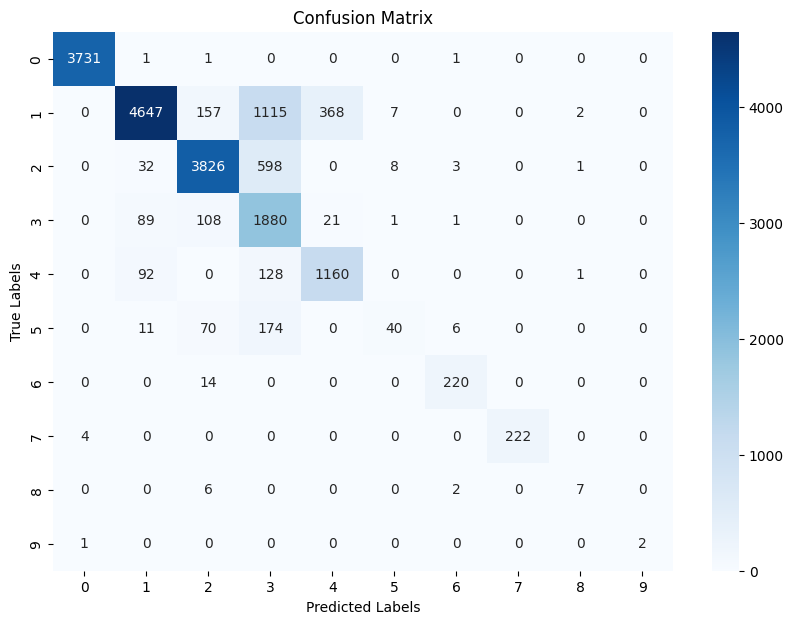

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9994    0.9996      5386
           1     0.9497    0.7391    0.8313      9378
           2     0.9166    0.8629    0.8890      6523
           3     0.4958    0.8903    0.6369      3135
           4     0.7472    0.8555    0.7977      2028
           5     0.7470    0.1538    0.2551       403
           6     0.9328    0.9429    0.9378       368
           7     1.0000    0.9970    0.9985       335
           8     0.7500    0.5556    0.6383        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8421     27584
   macro avg     0.8539    0.7997    0.7984     27584
weighted avg     0.8824    0.8421    0.8481     27584



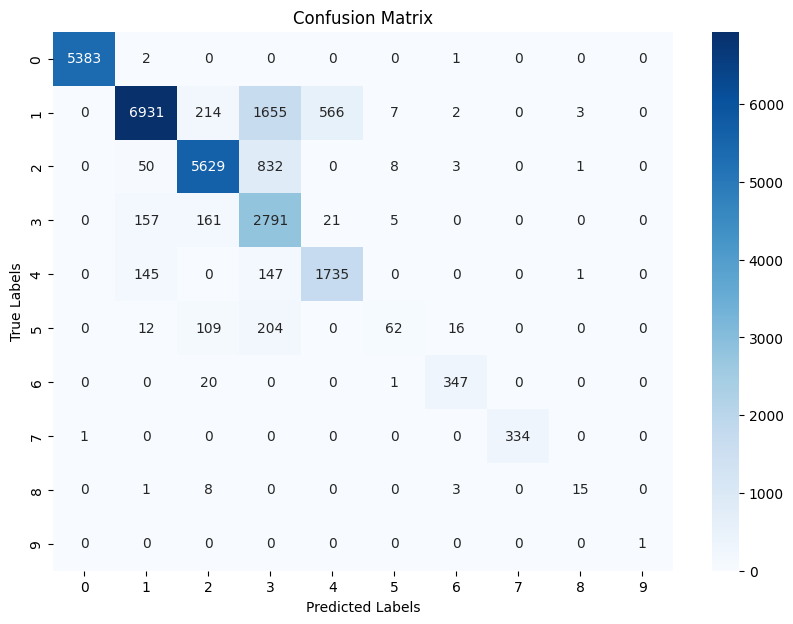

Start Round 30 ...
client_0: Loss = 0.3236, Accuracy = 0.8523
client_1: Loss = 0.3245, Accuracy = 0.8542
client_2: Loss = 0.3173, Accuracy = 0.8588
client_3: Loss = 0.32, Accuracy = 0.855
client_4: Loss = 0.3251, Accuracy = 0.8545
After round 30, train_loss = 0.3576, train_acc = 0.8393, dev_loss = 0.3779, dev_acc = 0.8320, test_loss = 0.3739, test_acc = 0.8329
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9994    0.9996     17907
           1     0.9711    0.7290    0.8329     31179
           2     0.7575    0.9850    0.8564     21643
           3     0.6256    0.5763    0.5999     10394
           4     0.6605    0.9585    0.7821      6585
           5     0.4968    0.1616    0.2439      1442
           6     0.8960    0.9949    0.9428      1169
           7     1.0000    0.9940    0.9970      1163
           8     0.8548    0.6092    0.7114        87
           9     0.9000    0.9000    0.9000        10

  

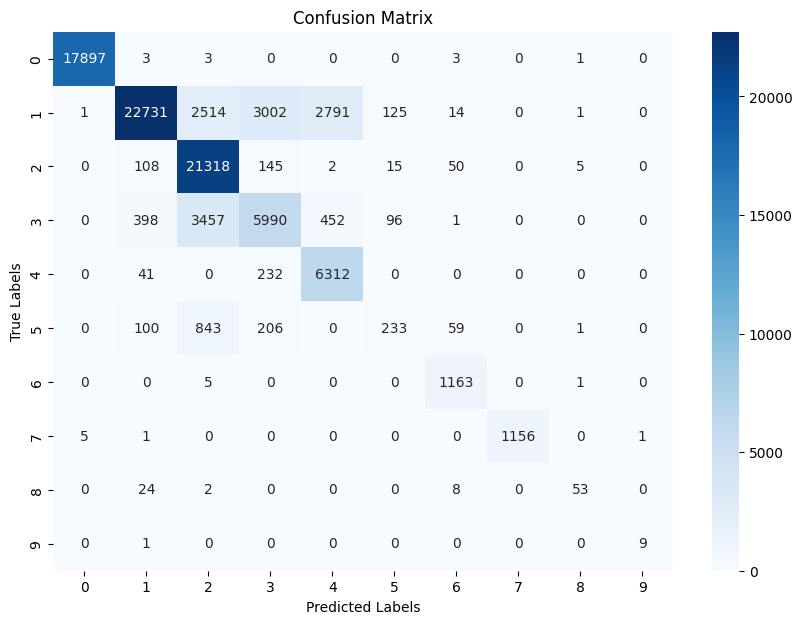

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9992    0.9984    0.9988      3734
           1     0.9636    0.7143    0.8204      6296
           2     0.7507    0.9852    0.8521      4468
           3     0.6023    0.5452    0.5724      2100
           4     0.6592    0.9609    0.7820      1381
           5     0.4505    0.1362    0.2092       301
           6     0.8992    0.9915    0.9431       234
           7     1.0000    0.9823    0.9911       226
           8     0.7143    0.3333    0.4545        15
           9     0.7500    1.0000    0.8571         3

    accuracy                         0.8318     18758
   macro avg     0.7789    0.7647    0.7481     18758
weighted avg     0.8483    0.8318    0.8264     18758



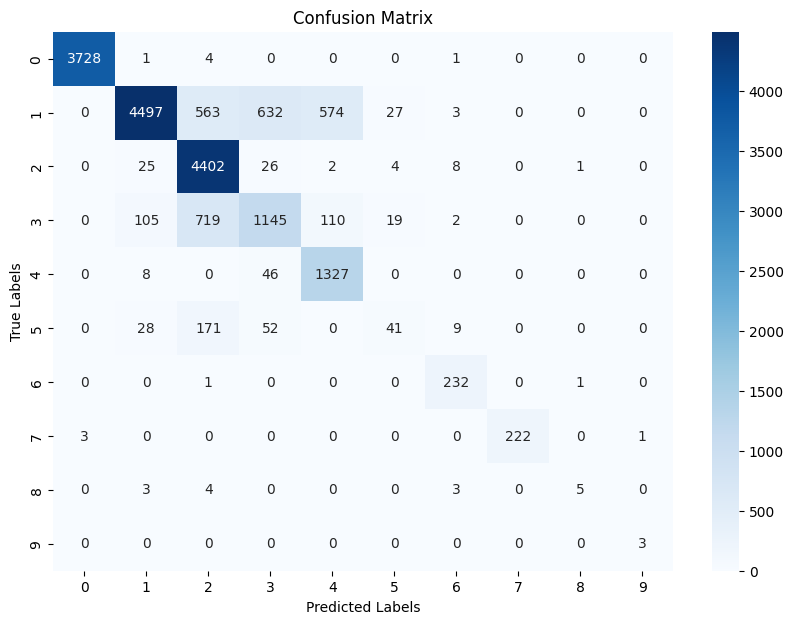

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9993    0.9995      5386
           1     0.9659    0.7196    0.8247      9378
           2     0.7547    0.9824    0.8536      6523
           3     0.6052    0.5470    0.5746      3135
           4     0.6499    0.9620    0.7757      2028
           5     0.4656    0.1514    0.2285       403
           6     0.9015    0.9946    0.9457       368
           7     1.0000    0.9970    0.9985       335
           8     0.7500    0.4444    0.5581        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8330     27584
   macro avg     0.8093    0.7798    0.7759     27584
weighted avg     0.8504    0.8330    0.8284     27584



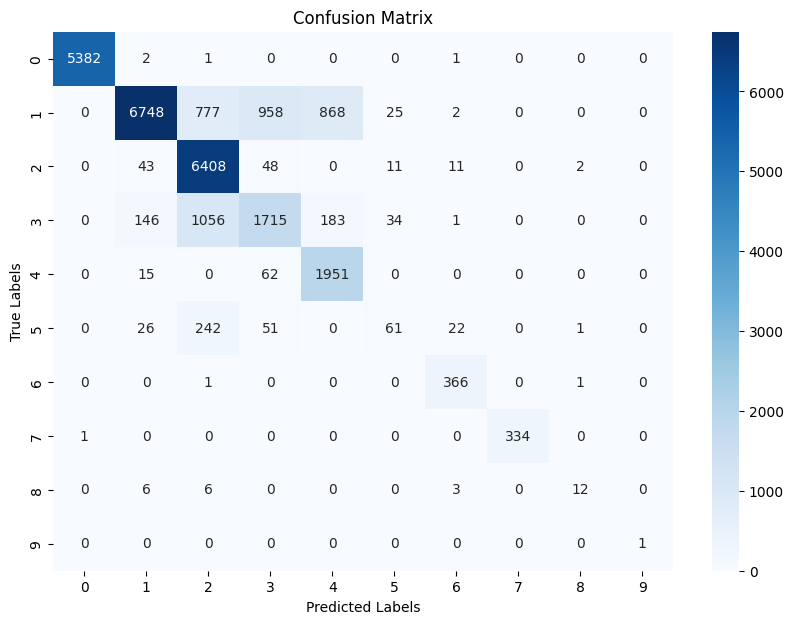

Start Round 31 ...
client_0: Loss = 0.3212, Accuracy = 0.8535
client_1: Loss = 0.3157, Accuracy = 0.8587
client_2: Loss = 0.3097, Accuracy = 0.8617
client_3: Loss = 0.318, Accuracy = 0.8583
client_4: Loss = 0.3173, Accuracy = 0.8577
After round 31, train_loss = 0.3118, train_acc = 0.8611, dev_loss = 0.3344, dev_acc = 0.8506, test_loss = 0.3327, test_acc = 0.8503
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9997    0.9997     17907
           1     0.9521    0.7850    0.8605     31179
           2     0.8031    0.9688    0.8782     21643
           3     0.6459    0.6233    0.6344     10394
           4     0.7220    0.9582    0.8235      6585
           5     0.5751    0.2656    0.3634      1442
           6     0.9398    0.9624    0.9510      1169
           7     0.9991    0.9957    0.9974      1163
           8     0.8947    0.5862    0.7083        87
           9     1.0000    0.8000    0.8889        10



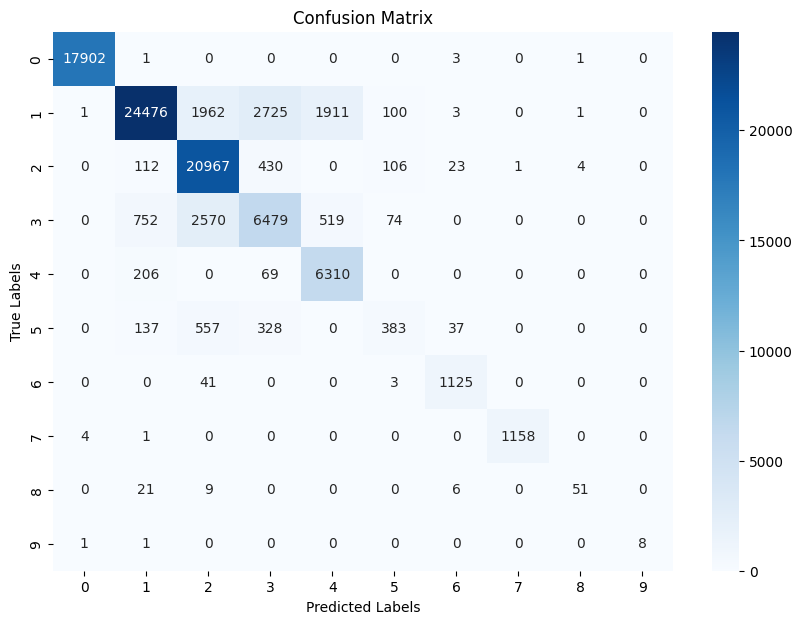

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9992    0.9991      3734
           1     0.9416    0.7679    0.8459      6296
           2     0.7915    0.9644    0.8695      4468
           3     0.6110    0.5871    0.5988      2100
           4     0.7201    0.9500    0.8192      1381
           5     0.5809    0.2625    0.3616       301
           6     0.9454    0.9615    0.9534       234
           7     1.0000    0.9867    0.9933       226
           8     0.8333    0.3333    0.4762        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8505     18758
   macro avg     0.8423    0.7146    0.7417     18758
weighted avg     0.8588    0.8505    0.8474     18758



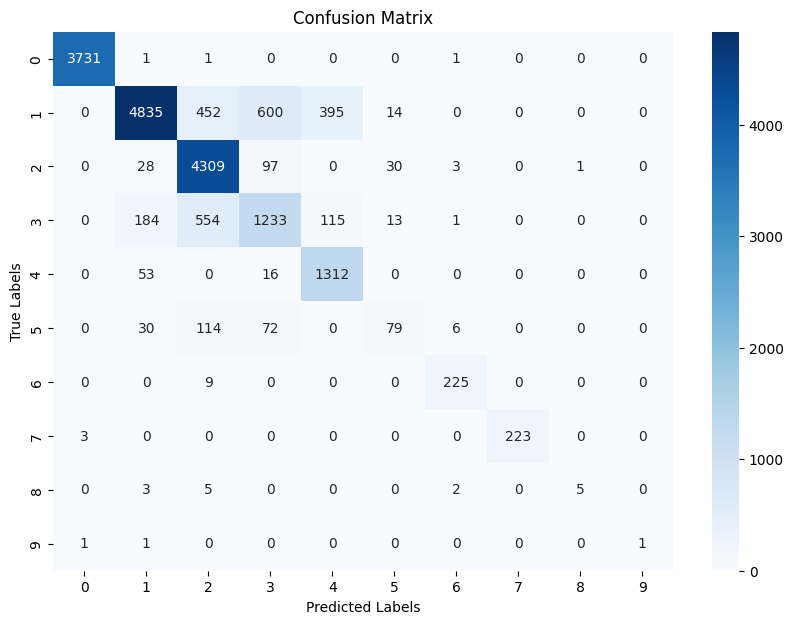

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9991    0.9994      5386
           1     0.9424    0.7733    0.8495      9378
           2     0.7937    0.9614    0.8695      6523
           3     0.6187    0.5770    0.5971      3135
           4     0.7075    0.9591    0.8143      2028
           5     0.4925    0.2457    0.3278       403
           6     0.9288    0.9565    0.9424       368
           7     1.0000    0.9970    0.9985       335
           8     0.7778    0.5185    0.6222        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8504     27584
   macro avg     0.8261    0.7988    0.8021     27584
weighted avg     0.8582    0.8504    0.8475     27584



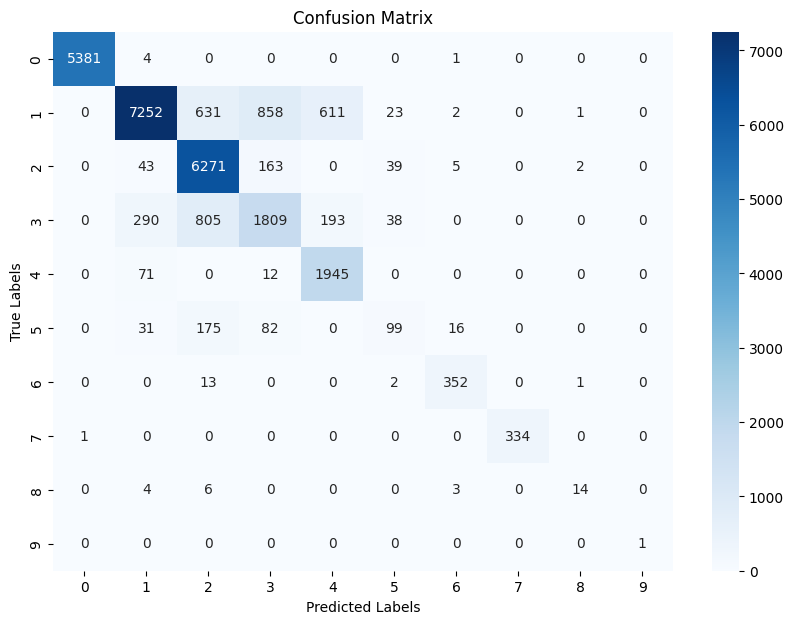

Start Round 32 ...
client_0: Loss = 0.3209, Accuracy = 0.8581
client_1: Loss = 0.3123, Accuracy = 0.8613
client_2: Loss = 0.3081, Accuracy = 0.8643
client_3: Loss = 0.3157, Accuracy = 0.8574
client_4: Loss = 0.3161, Accuracy = 0.8568
After round 32, train_loss = 0.3205, train_acc = 0.8572, dev_loss = 0.3437, dev_acc = 0.8465, test_loss = 0.3410, test_acc = 0.8487
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9997    0.9997     17907
           1     0.9057    0.7915    0.8447     31179
           2     0.9237    0.8755    0.8990     21643
           3     0.5820    0.7381    0.6509     10394
           4     0.6915    0.9910    0.8146      6585
           5     0.5000    0.2795    0.3585      1442
           6     0.9140    0.9914    0.9512      1169
           7     1.0000    0.9923    0.9961      1163
           8     0.9167    0.6322    0.7483        87
           9     1.0000    0.8000    0.8889        10


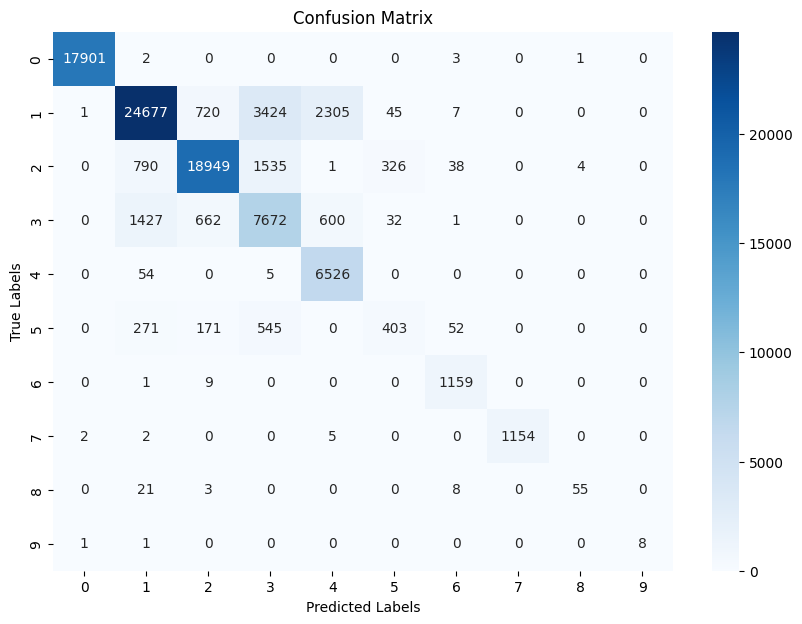

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9989    0.9989      3734
           1     0.8931    0.7753    0.8300      6296
           2     0.9113    0.8668    0.8885      4468
           3     0.5530    0.7057    0.6201      2100
           4     0.6945    0.9928    0.8173      1381
           5     0.4713    0.2724    0.3453       301
           6     0.9206    0.9915    0.9547       234
           7     1.0000    0.9779    0.9888       226
           8     0.8333    0.3333    0.4762        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8465     18758
   macro avg     0.8276    0.7581    0.7720     18758
weighted avg     0.8606    0.8465    0.8485     18758



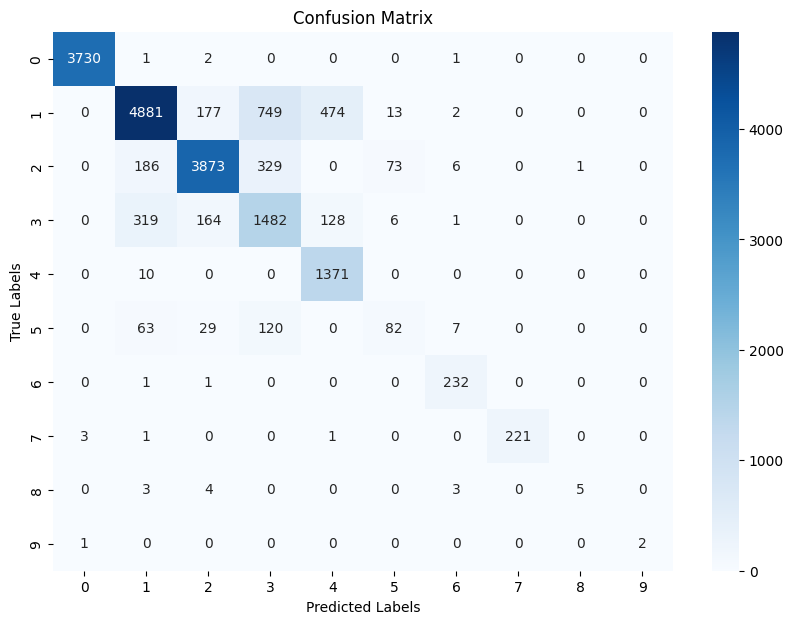

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9989    0.9993      5386
           1     0.8960    0.7809    0.8345      9378
           2     0.9167    0.8705    0.8930      6523
           3     0.5620    0.7002    0.6235      3135
           4     0.6835    0.9901    0.8087      2028
           5     0.4752    0.2854    0.3566       403
           6     0.9171    0.9918    0.9530       368
           7     1.0000    0.9970    0.9985       335
           8     0.8235    0.5185    0.6364        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8488     27584
   macro avg     0.8274    0.8133    0.8103     27584
weighted avg     0.8629    0.8488    0.8510     27584



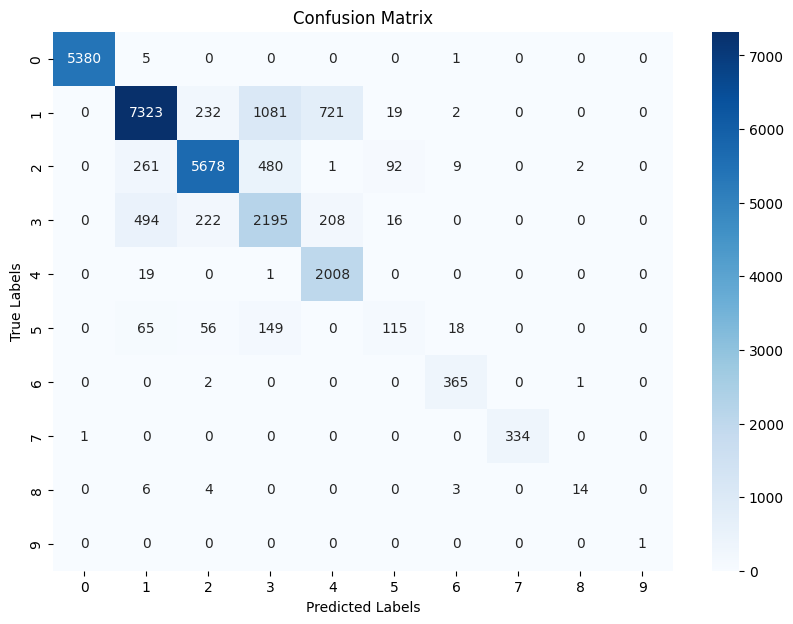

Start Round 33 ...
client_0: Loss = 0.3185, Accuracy = 0.856
client_1: Loss = 0.3134, Accuracy = 0.8592
client_2: Loss = 0.3081, Accuracy = 0.8674
client_3: Loss = 0.3115, Accuracy = 0.861
client_4: Loss = 0.3152, Accuracy = 0.8602
After round 33, train_loss = 0.3107, train_acc = 0.8593, dev_loss = 0.3323, dev_acc = 0.8470, test_loss = 0.3341, test_acc = 0.8488
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9996    0.9997     17907
           1     0.8906    0.8264    0.8573     31179
           2     0.8598    0.9282    0.8927     21643
           3     0.6476    0.5482    0.5938     10394
           4     0.7196    0.9613    0.8231      6585
           5     0.4108    0.3578    0.3825      1442
           6     0.9077    0.9932    0.9485      1169
           7     0.9957    0.9983    0.9970      1163
           8     0.8974    0.8046    0.8485        87
           9     1.0000    0.8000    0.8889        10

 

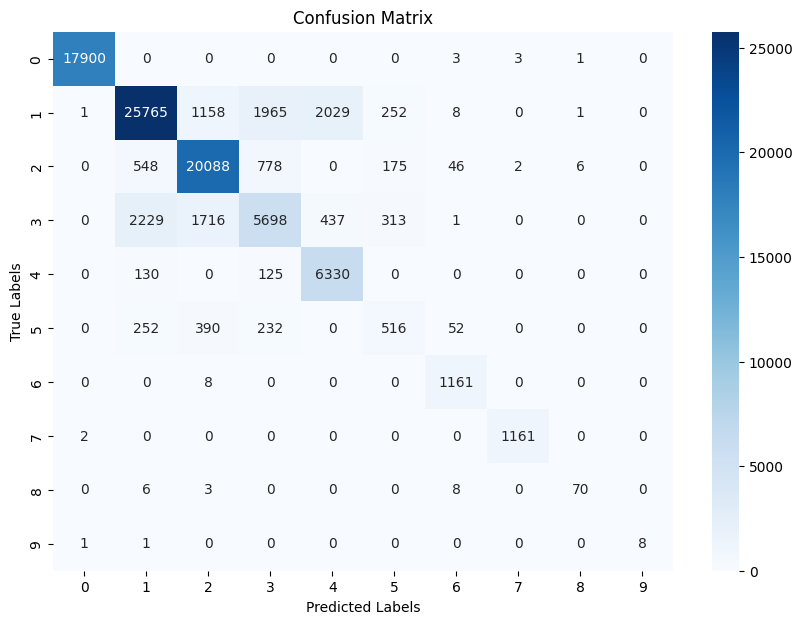

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9989    0.9989      3734
           1     0.8772    0.8057    0.8400      6296
           2     0.8440    0.9226    0.8815      4468
           3     0.6002    0.5176    0.5559      2100
           4     0.7226    0.9508    0.8211      1381
           5     0.4057    0.3289    0.3633       301
           6     0.9206    0.9915    0.9547       234
           7     0.9955    0.9867    0.9911       226
           8     0.8750    0.4667    0.6087        15
           9     1.0000    0.3333    0.5000         3

    accuracy                         0.8469     18758
   macro avg     0.8240    0.7303    0.7515     18758
weighted avg     0.8456    0.8469    0.8437     18758



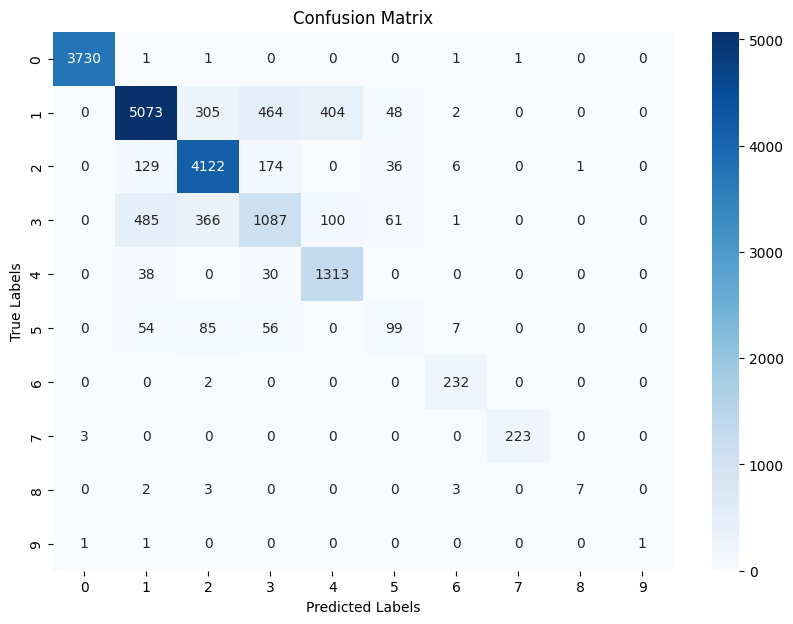

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9993    0.9994      5386
           1     0.8778    0.8151    0.8453      9378
           2     0.8493    0.9207    0.8836      6523
           3     0.6193    0.5059    0.5569      3135
           4     0.7092    0.9620    0.8165      2028
           5     0.3618    0.3151    0.3369       403
           6     0.9171    0.9918    0.9530       368
           7     1.0000    0.9970    0.9985       335
           8     0.7083    0.6296    0.6667        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8488     27584
   macro avg     0.8042    0.8137    0.8057     27584
weighted avg     0.8474    0.8488    0.8452     27584



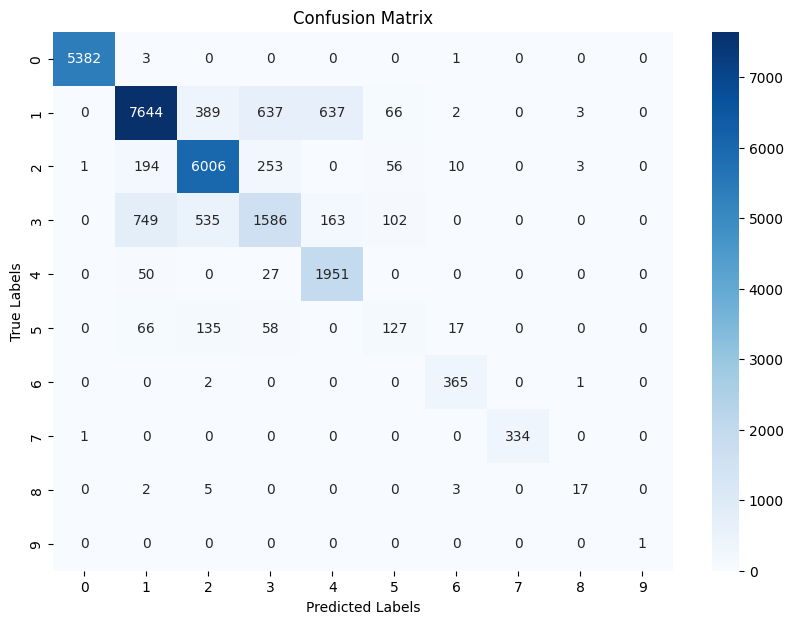

Start Round 34 ...
client_0: Loss = 0.3151, Accuracy = 0.8591
client_1: Loss = 0.3132, Accuracy = 0.8585
client_2: Loss = 0.3041, Accuracy = 0.8658
client_3: Loss = 0.3161, Accuracy = 0.8588
client_4: Loss = 0.3236, Accuracy = 0.8565
After round 34, train_loss = 0.3211, train_acc = 0.8566, dev_loss = 0.3447, dev_acc = 0.8477, test_loss = 0.3467, test_acc = 0.8464
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9997    0.9996     17907
           1     0.9715    0.7614    0.8537     31179
           2     0.7969    0.9682    0.8742     21643
           3     0.6259    0.6420    0.6338     10394
           4     0.7065    0.9775    0.8202      6585
           5     0.5497    0.3107    0.3970      1442
           6     0.9520    0.9153    0.9333      1169
           7     0.9991    0.9957    0.9974      1163
           8     0.9000    0.6207    0.7347        87
           9     1.0000    0.8000    0.8889        10


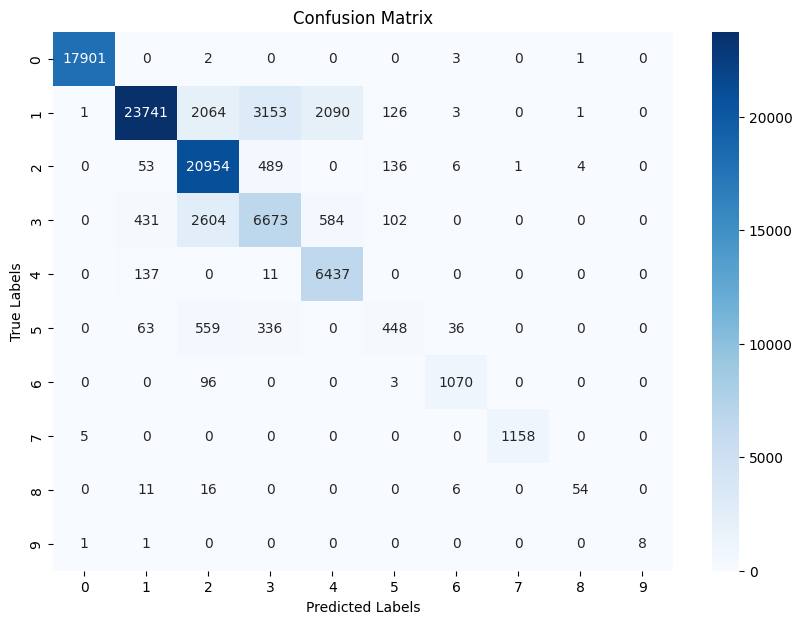

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9989    0.9988      3734
           1     0.9639    0.7462    0.8412      6296
           2     0.7870    0.9658    0.8672      4468
           3     0.5978    0.6129    0.6052      2100
           4     0.7102    0.9761    0.8222      1381
           5     0.4969    0.2625    0.3435       301
           6     0.9427    0.9145    0.9284       234
           7     1.0000    0.9823    0.9911       226
           8     1.0000    0.3333    0.5000        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8476     18758
   macro avg     0.8497    0.7459    0.7698     18758
weighted avg     0.8617    0.8476    0.8456     18758



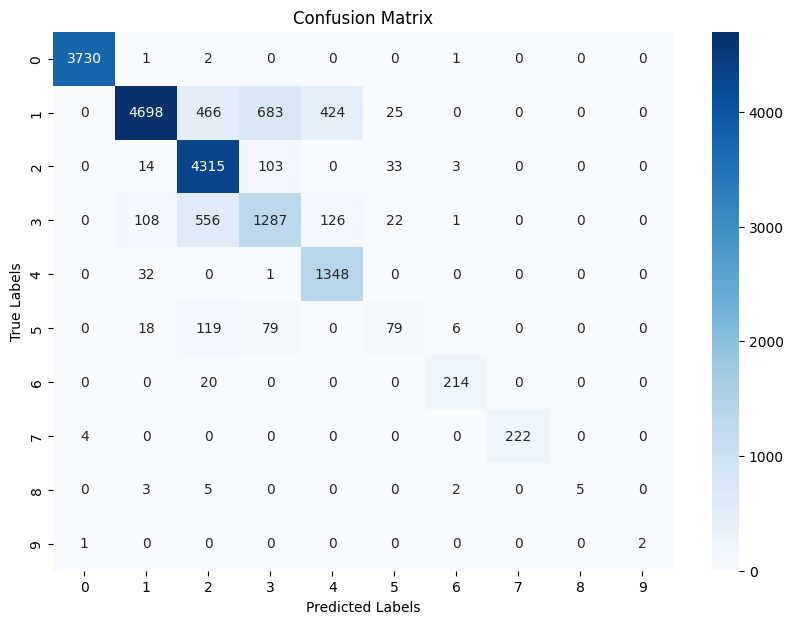

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9991    0.9994      5386
           1     0.9628    0.7507    0.8436      9378
           2     0.7874    0.9623    0.8661      6523
           3     0.6034    0.6070    0.6052      3135
           4     0.6967    0.9694    0.8107      2028
           5     0.4515    0.2655    0.3344       403
           6     0.9322    0.8967    0.9141       368
           7     1.0000    0.9970    0.9985       335
           8     0.7500    0.4444    0.5581        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8465     27584
   macro avg     0.8184    0.7892    0.7930     27584
weighted avg     0.8605    0.8465    0.8449     27584



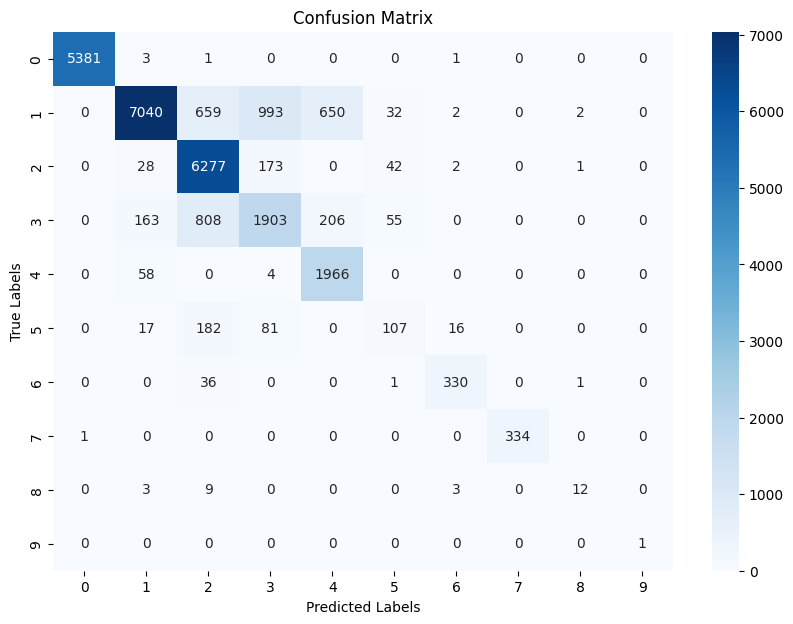

Start Round 35 ...
client_0: Loss = 0.3148, Accuracy = 0.8558
client_1: Loss = 0.3118, Accuracy = 0.8583
client_2: Loss = 0.3001, Accuracy = 0.8662
client_3: Loss = 0.3424, Accuracy = 0.8504
client_4: Loss = 0.3306, Accuracy = 0.8562
After round 35, train_loss = 0.3075, train_acc = 0.8632, dev_loss = 0.3303, dev_acc = 0.8532, test_loss = 0.3292, test_acc = 0.8528
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9998    0.9997     17907
           1     0.9475    0.7893    0.8612     31179
           2     0.8532    0.9350    0.8922     21643
           3     0.6040    0.6831    0.6411     10394
           4     0.7058    0.9834    0.8218      6585
           5     0.6099    0.2386    0.3430      1442
           6     0.9206    0.9923    0.9551      1169
           7     0.9991    0.9948    0.9970      1163
           8     0.9000    0.6207    0.7347        87
           9     1.0000    0.9000    0.9474        10


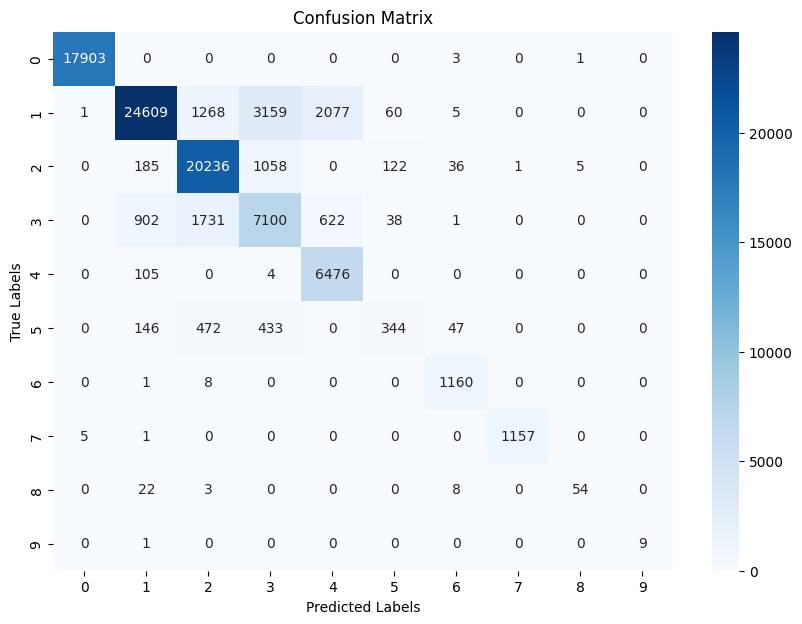

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9992    0.9989      3734
           1     0.9389    0.7733    0.8481      6296
           2     0.8378    0.9261    0.8798      4468
           3     0.5769    0.6576    0.6146      2100
           4     0.7120    0.9812    0.8252      1381
           5     0.5702    0.2292    0.3270       301
           6     0.9317    0.9915    0.9607       234
           7     1.0000    0.9823    0.9911       226
           8     0.8333    0.3333    0.4762        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8532     18758
   macro avg     0.8400    0.7540    0.7722     18758
weighted avg     0.8641    0.8532    0.8523     18758



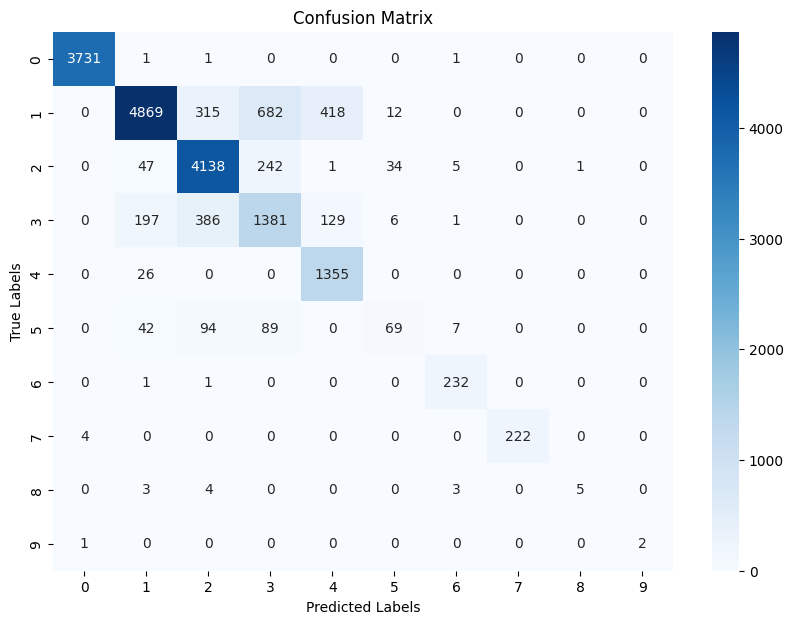

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9991    0.9994      5386
           1     0.9349    0.7807    0.8508      9378
           2     0.8422    0.9232    0.8809      6523
           3     0.5803    0.6405    0.6089      3135
           4     0.6984    0.9808    0.8158      2028
           5     0.5706    0.2308    0.3286       403
           6     0.9171    0.9918    0.9530       368
           7     1.0000    0.9970    0.9985       335
           8     0.8235    0.5185    0.6364        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8530     27584
   macro avg     0.8367    0.8062    0.8072     27584
weighted avg     0.8631    0.8530    0.8522     27584



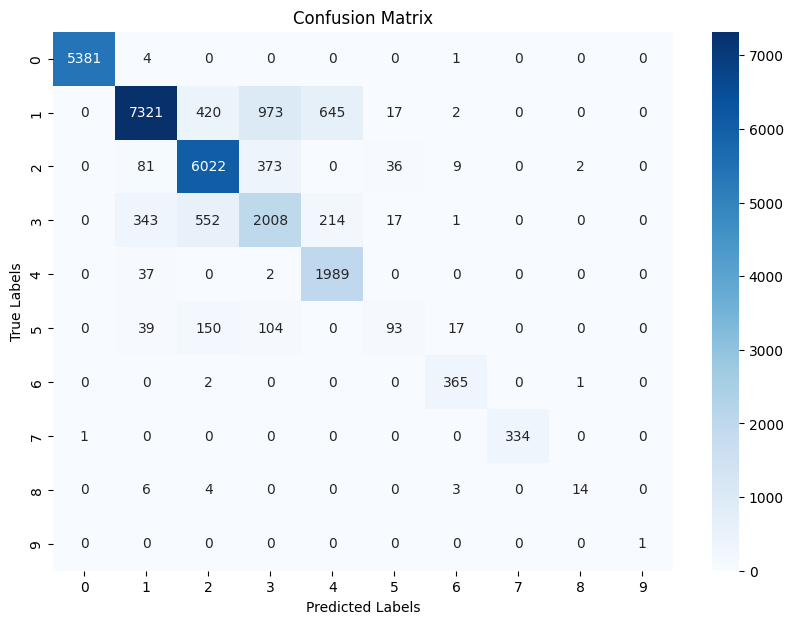

Start Round 36 ...
client_0: Loss = 0.3135, Accuracy = 0.8584
client_1: Loss = 0.3099, Accuracy = 0.8598
client_2: Loss = 0.298, Accuracy = 0.8697
client_3: Loss = 0.3097, Accuracy = 0.8597
client_4: Loss = 0.3254, Accuracy = 0.8558
After round 36, train_loss = 0.3130, train_acc = 0.8599, dev_loss = 0.3390, dev_acc = 0.8482, test_loss = 0.3327, test_acc = 0.8519
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9999    0.9997    0.9998     17907
           1     0.9396    0.7798    0.8523     31179
           2     0.8679    0.9231    0.8946     21643
           3     0.5871    0.7225    0.6478     10394
           4     0.7044    0.9623    0.8134      6585
           5     0.6798    0.2150    0.3267      1442
           6     0.8975    0.9966    0.9445      1169
           7     0.9983    0.9974    0.9978      1163
           8     0.9385    0.7011    0.8026        87
           9     0.9000    0.9000    0.9000        10



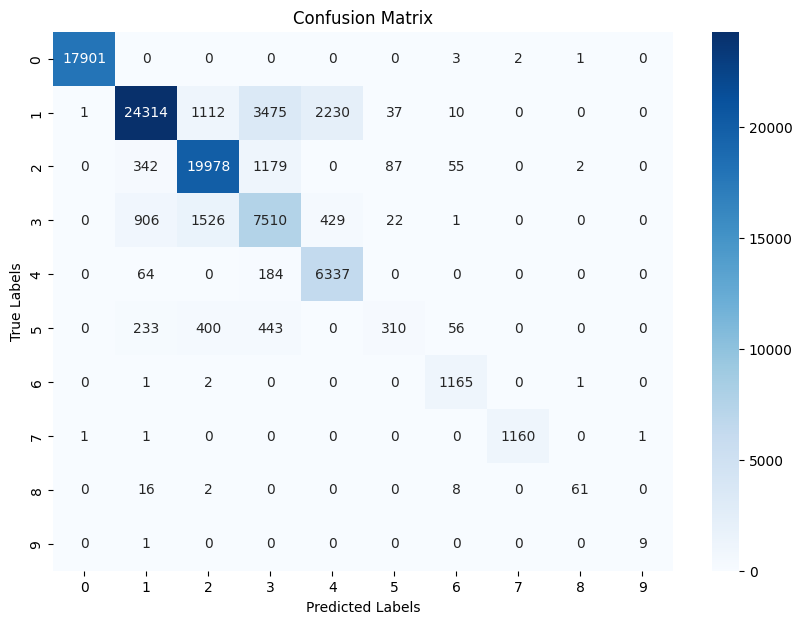

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9995    0.9989    0.9992      3734
           1     0.9315    0.7603    0.8373      6296
           2     0.8545    0.9147    0.8836      4468
           3     0.5544    0.6938    0.6163      2100
           4     0.7017    0.9573    0.8098      1381
           5     0.6238    0.2093    0.3134       301
           6     0.9102    0.9957    0.9510       234
           7     0.9911    0.9867    0.9889       226
           8     0.6667    0.2667    0.3810        15
           9     0.7500    1.0000    0.8571         3

    accuracy                         0.8481     18758
   macro avg     0.7983    0.7783    0.7638     18758
weighted avg     0.8628    0.8481    0.8482     18758



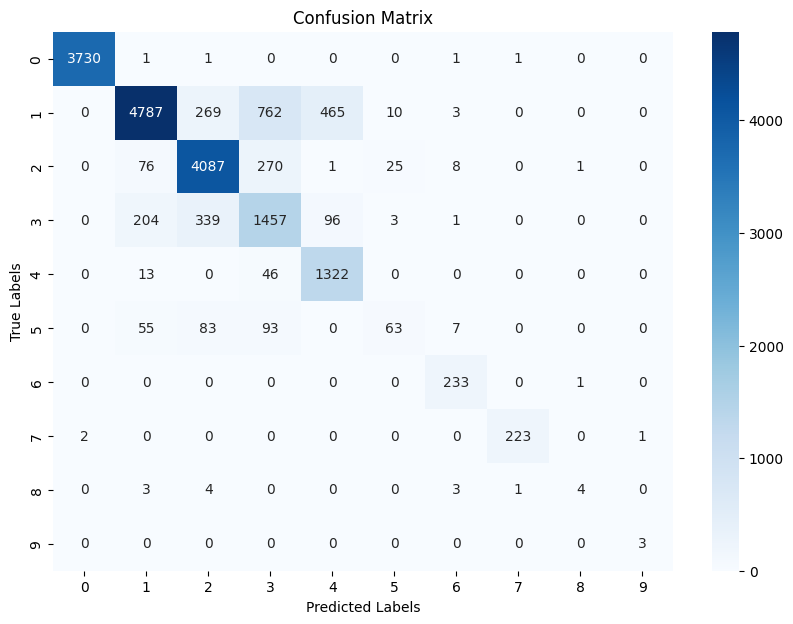

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9994    0.9996      5386
           1     0.9309    0.7716    0.8438      9378
           2     0.8611    0.9151    0.8873      6523
           3     0.5710    0.6826    0.6218      3135
           4     0.6923    0.9694    0.8077      2028
           5     0.6197    0.2184    0.3229       403
           6     0.8993    0.9946    0.9445       368
           7     1.0000    0.9970    0.9985       335
           8     0.7391    0.6296    0.6800        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8519     27584
   macro avg     0.8313    0.8178    0.8106     27584
weighted avg     0.8651    0.8519    0.8521     27584



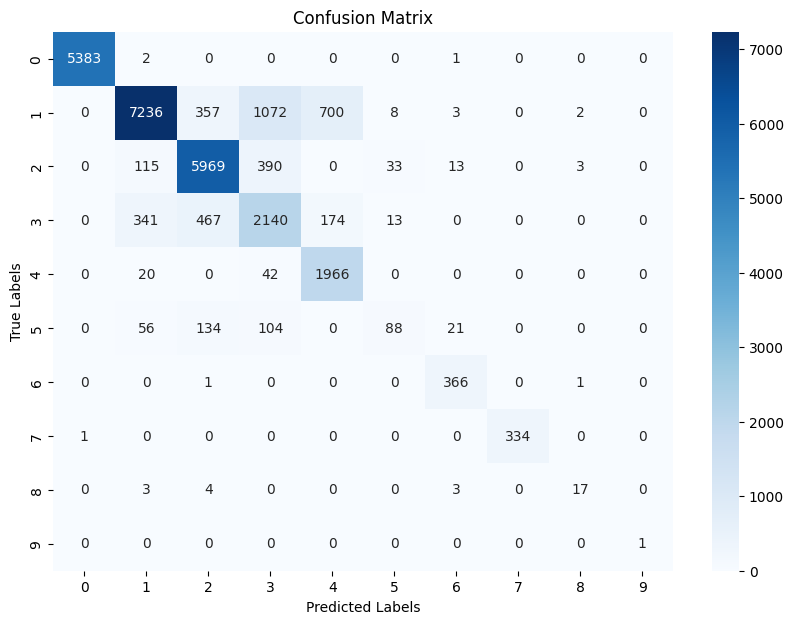

Start Round 37 ...
client_0: Loss = 0.3109, Accuracy = 0.8566
client_1: Loss = 0.3045, Accuracy = 0.8626
client_2: Loss = 0.2998, Accuracy = 0.866
client_3: Loss = 0.305, Accuracy = 0.8628
client_4: Loss = 0.3279, Accuracy = 0.8549
After round 37, train_loss = 0.3338, train_acc = 0.8446, dev_loss = 0.3545, dev_acc = 0.8327, test_loss = 0.3540, test_acc = 0.8349
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9994    0.9998    0.9996     17907
           1     0.8270    0.8680    0.8470     31179
           2     0.8149    0.9309    0.8690     21643
           3     0.7002    0.3888    0.5000     10394
           4     0.7735    0.8115    0.7921      6585
           5     0.4504    0.3114    0.3682      1442
           6     0.8942    0.9974    0.9430      1169
           7     0.9991    0.9931    0.9961      1163
           8     0.9559    0.7471    0.8387        87
           9     1.0000    0.9000    0.9474        10

 

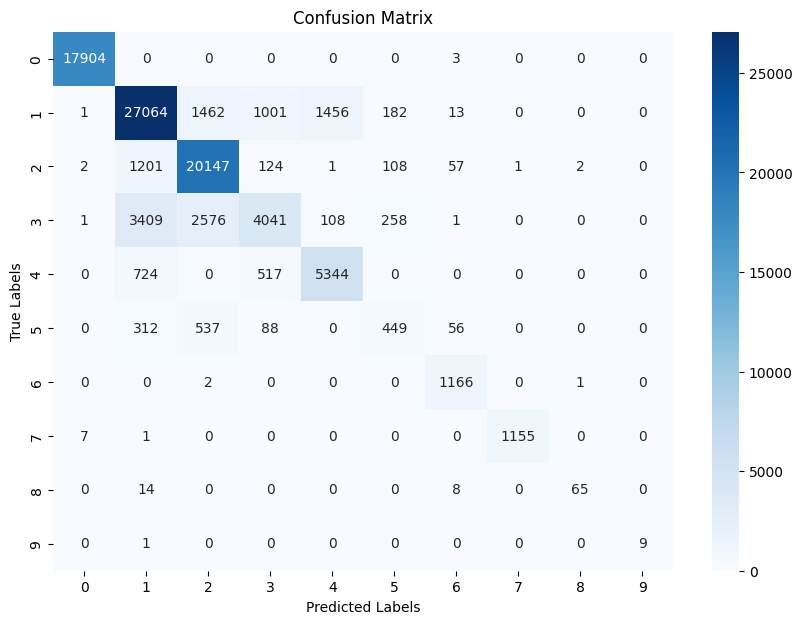

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9995    0.9991      3734
           1     0.8150    0.8488    0.8316      6296
           2     0.7996    0.9268    0.8585      4468
           3     0.6456    0.3600    0.4622      2100
           4     0.7700    0.7929    0.7813      1381
           5     0.4335    0.2924    0.3492       301
           6     0.9066    0.9957    0.9491       234
           7     1.0000    0.9779    0.9888       226
           8     0.7778    0.4667    0.5833        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8327     18758
   macro avg     0.8147    0.7327    0.7603     18758
weighted avg     0.8229    0.8327    0.8217     18758



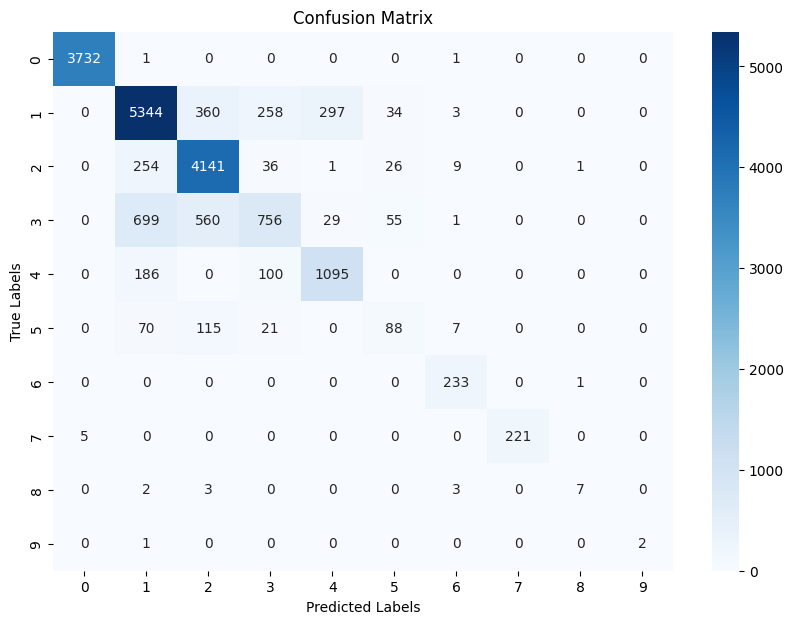

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9994    0.9995      5386
           1     0.8124    0.8570    0.8341      9378
           2     0.8096    0.9256    0.8637      6523
           3     0.6715    0.3528    0.4626      3135
           4     0.7592    0.8052    0.7815      2028
           5     0.4056    0.2878    0.3367       403
           6     0.8995    0.9973    0.9459       368
           7     1.0000    0.9940    0.9970       335
           8     0.7727    0.6296    0.6939        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8349     27584
   macro avg     0.8130    0.7849    0.7915     27584
weighted avg     0.8258    0.8349    0.8234     27584



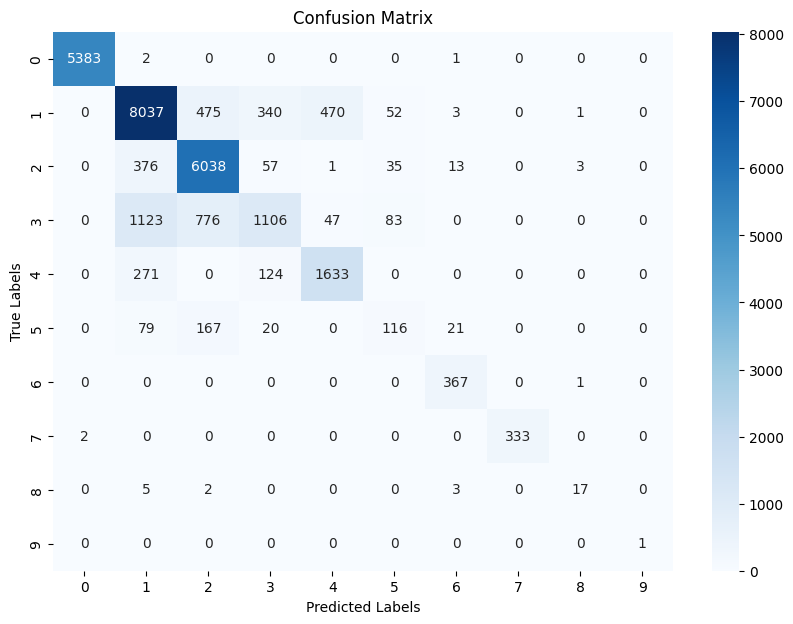

Start Round 38 ...
client_0: Loss = 0.3161, Accuracy = 0.8568
client_1: Loss = 0.3057, Accuracy = 0.864
client_2: Loss = 0.298, Accuracy = 0.866
client_3: Loss = 0.3085, Accuracy = 0.8601
client_4: Loss = 0.3191, Accuracy = 0.8585
After round 38, train_loss = 0.3140, train_acc = 0.8587, dev_loss = 0.3372, dev_acc = 0.8464, test_loss = 0.3355, test_acc = 0.8496
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9997    0.9996    0.9996     17907
           1     0.8997    0.8017    0.8479     31179
           2     0.8958    0.9101    0.9029     21643
           3     0.5945    0.6915    0.6393     10394
           4     0.7072    0.9263    0.8021      6585
           5     0.5420    0.2503    0.3425      1442
           6     0.9120    0.9932    0.9509      1169
           7     0.9949    0.9983    0.9966      1163
           8     0.9178    0.7701    0.8375        87
           9     1.0000    0.9000    0.9474        10

  

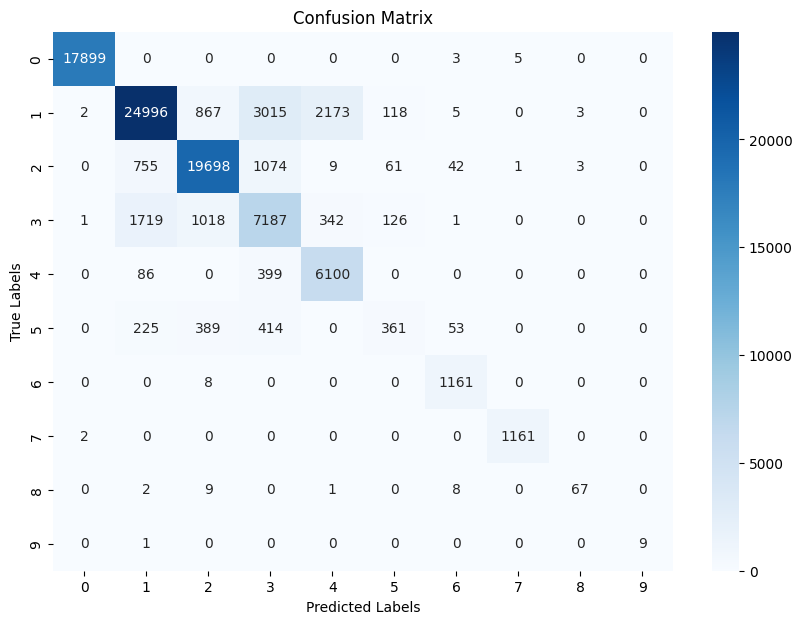

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9987    0.9989    0.9988      3734
           1     0.8844    0.7827    0.8305      6296
           2     0.8816    0.9031    0.8922      4468
           3     0.5560    0.6524    0.6004      2100
           4     0.7116    0.9327    0.8073      1381
           5     0.5126    0.2027    0.2905       301
           6     0.9315    0.9872    0.9585       234
           7     0.9911    0.9867    0.9889       226
           8     1.0000    0.4000    0.5714        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8463     18758
   macro avg     0.8467    0.7513    0.7738     18758
weighted avg     0.8530    0.8463    0.8458     18758



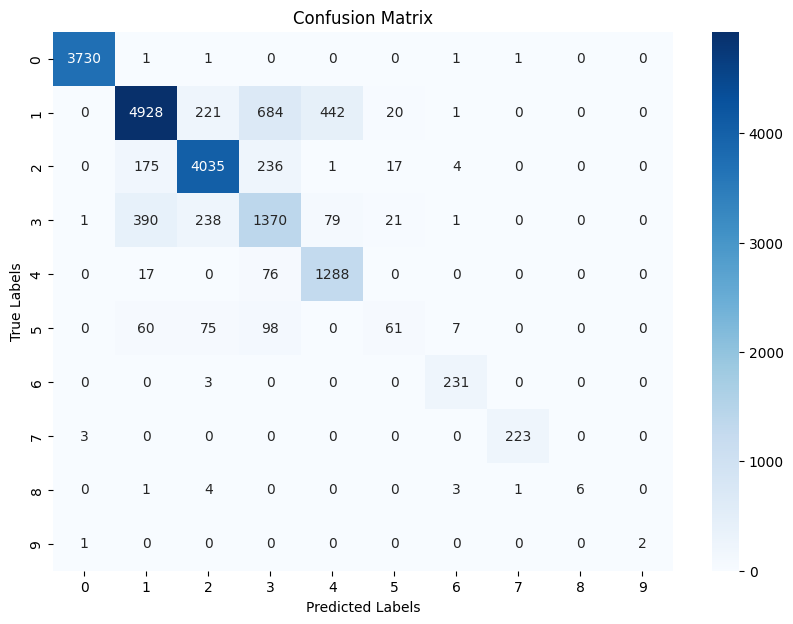

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9996    0.9998    0.9997      5386
           1     0.8919    0.7890    0.8373      9378
           2     0.8846    0.9034    0.8939      6523
           3     0.5725    0.6539    0.6105      3135
           4     0.6997    0.9364    0.8009      2028
           5     0.5000    0.2283    0.3135       403
           6     0.9125    0.9918    0.9505       368
           7     1.0000    0.9970    0.9985       335
           8     0.6800    0.6296    0.6538        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8496     27584
   macro avg     0.8141    0.8129    0.8059     27584
weighted avg     0.8564    0.8496    0.8496     27584



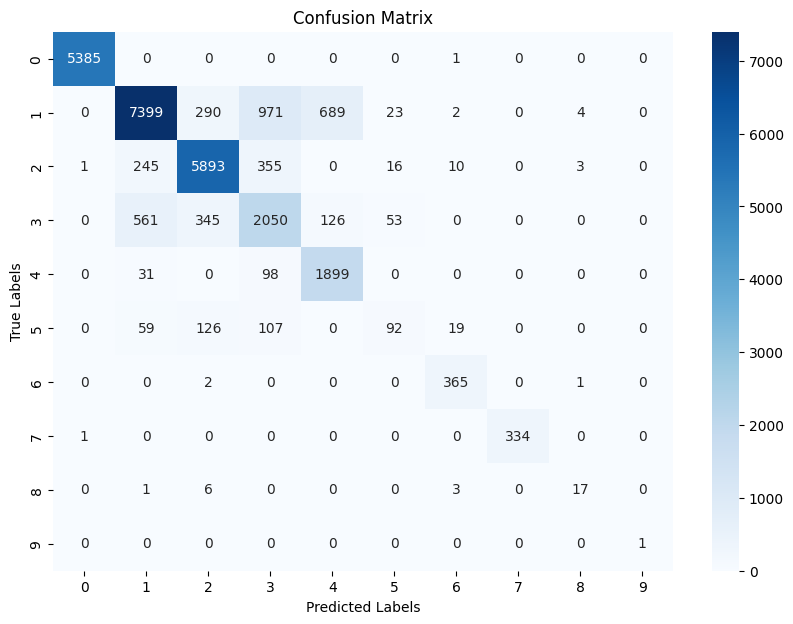

Start Round 39 ...
client_0: Loss = 0.306, Accuracy = 0.8614
client_1: Loss = 0.3028, Accuracy = 0.8634
client_2: Loss = 0.2947, Accuracy = 0.8714
client_3: Loss = 0.3033, Accuracy = 0.8641
client_4: Loss = 0.3036, Accuracy = 0.866
After round 39, train_loss = 0.3022, train_acc = 0.8649, dev_loss = 0.3304, dev_acc = 0.8506, test_loss = 0.3316, test_acc = 0.8499
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9996    0.9997     17907
           1     0.8941    0.8328    0.8624     31179
           2     0.8736    0.9270    0.8995     21643
           3     0.6261    0.6339    0.6300     10394
           4     0.7377    0.9004    0.8110      6585
           5     0.6010    0.2497    0.3528      1442
           6     0.9219    0.9889    0.9542      1169
           7     0.9957    0.9983    0.9970      1163
           8     0.9114    0.8276    0.8675        87
           9     1.0000    0.9000    0.9474        10

 

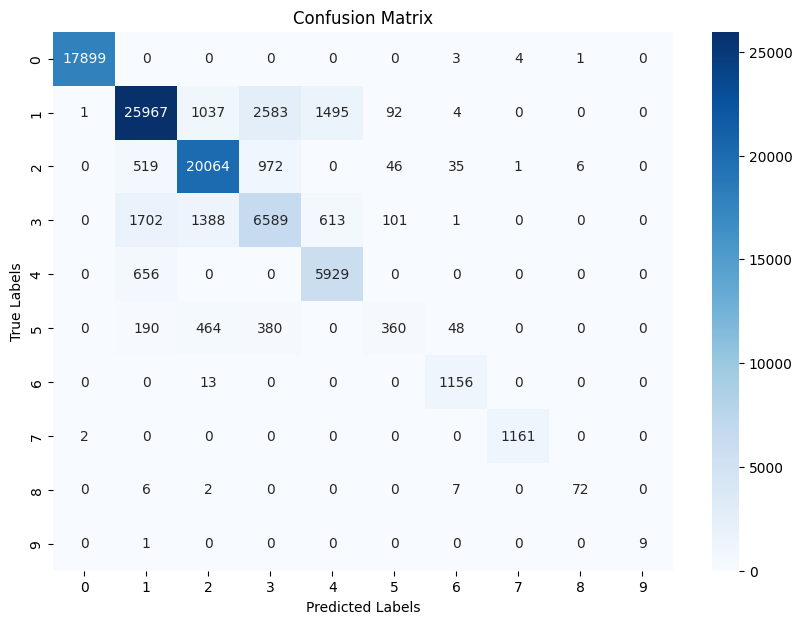

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9987    0.9988      3734
           1     0.8748    0.8092    0.8408      6296
           2     0.8585    0.9210    0.8887      4468
           3     0.5892    0.6057    0.5973      2100
           4     0.7373    0.8820    0.8032      1381
           5     0.5526    0.2093    0.3036       301
           6     0.9274    0.9829    0.9544       234
           7     0.9911    0.9867    0.9889       226
           8     0.7500    0.4000    0.5217        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8505     18758
   macro avg     0.8280    0.7462    0.7697     18758
weighted avg     0.8504    0.8505    0.8479     18758



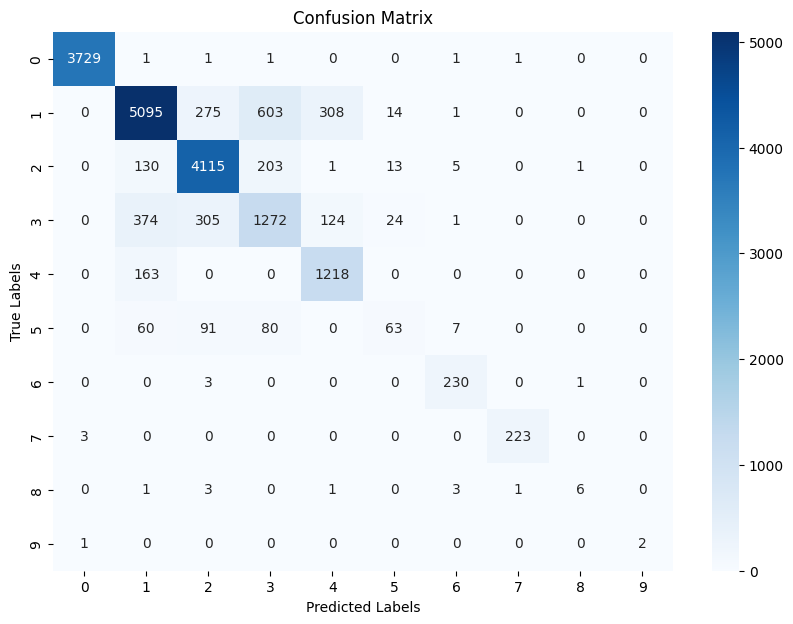

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9993    0.9995      5386
           1     0.8752    0.8165    0.8448      9378
           2     0.8619    0.9169    0.8886      6523
           3     0.5915    0.5828    0.5871      3135
           4     0.7157    0.8826    0.7905      2028
           5     0.5207    0.2184    0.3077       403
           6     0.9217    0.9918    0.9555       368
           7     1.0000    0.9970    0.9985       335
           8     0.7826    0.6667    0.7200        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8499     27584
   macro avg     0.8269    0.8072    0.8092     27584
weighted avg     0.8493    0.8499    0.8475     27584



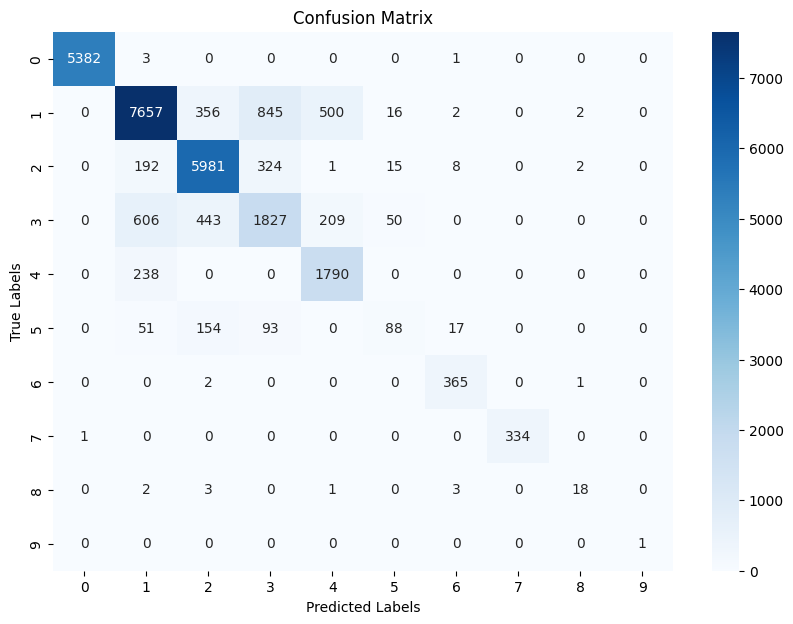

Start Round 40 ...
client_0: Loss = 0.3051, Accuracy = 0.8618
client_1: Loss = 0.302, Accuracy = 0.8656
client_2: Loss = 0.2934, Accuracy = 0.8702
client_3: Loss = 0.3039, Accuracy = 0.8647
client_4: Loss = 0.2989, Accuracy = 0.8662
After round 40, train_loss = 0.2938, train_acc = 0.8689, dev_loss = 0.3215, dev_acc = 0.8534, test_loss = 0.3178, test_acc = 0.8563
Training Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9996    0.9997     17907
           1     0.9309    0.8074    0.8647     31179
           2     0.8809    0.9232    0.9015     21643
           3     0.5945    0.7690    0.6706     10394
           4     0.7679    0.8923    0.8255      6585
           5     0.7209    0.1935    0.3051      1442
           6     0.9269    0.9769    0.9513      1169
           7     0.9974    0.9983    0.9979      1163
           8     0.9355    0.6667    0.7785        87
           9     1.0000    0.9000    0.9474        10



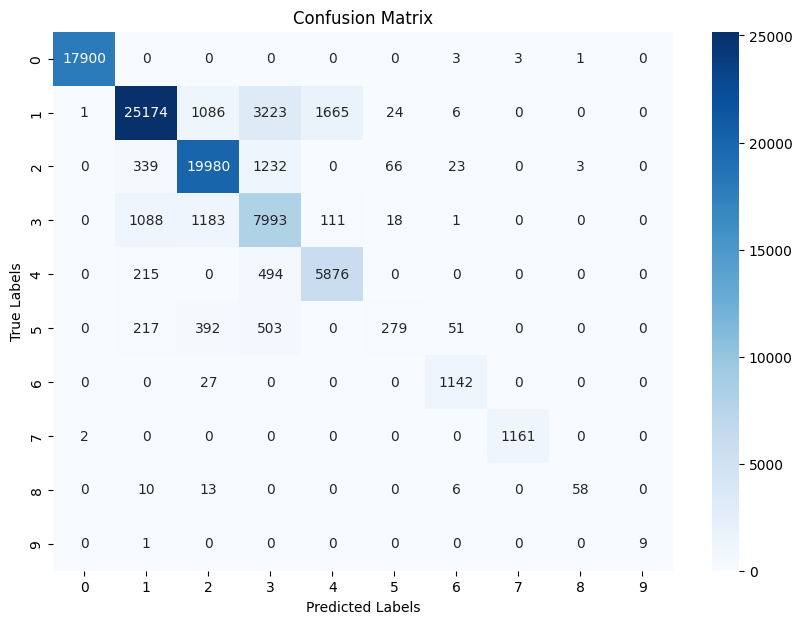

Development Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9989    0.9987    0.9988      3734
           1     0.9135    0.7888    0.8466      6296
           2     0.8627    0.9116    0.8865      4468
           3     0.5567    0.7229    0.6290      2100
           4     0.7636    0.8769    0.8163      1381
           5     0.6829    0.1860    0.2924       301
           6     0.9375    0.9615    0.9494       234
           7     0.9911    0.9867    0.9889       226
           8     0.8333    0.3333    0.4762        15
           9     1.0000    0.6667    0.8000         3

    accuracy                         0.8534     18758
   macro avg     0.8540    0.7433    0.7684     18758
weighted avg     0.8649    0.8534    0.8536     18758



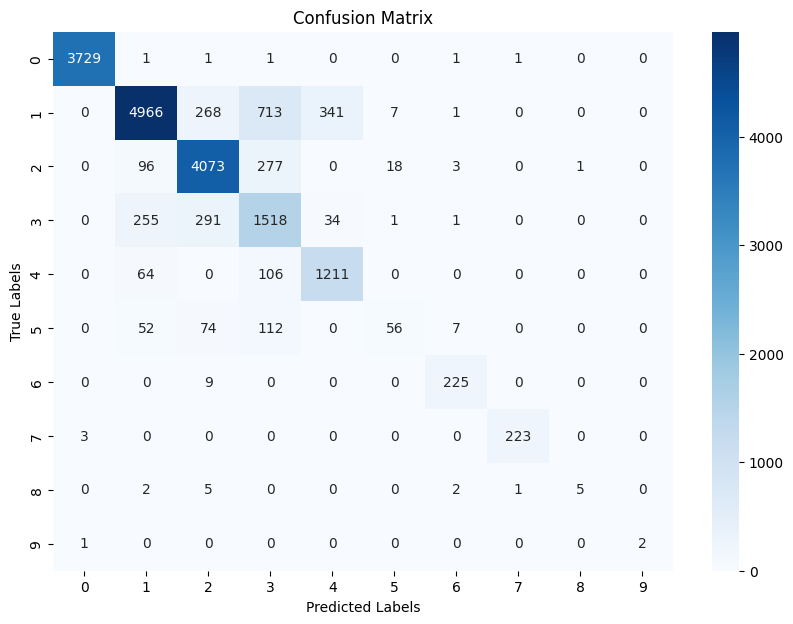

Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9993    0.9995      5386
           1     0.9150    0.7940    0.8502      9378
           2     0.8662    0.9109    0.8880      6523
           3     0.5733    0.7212    0.6388      3135
           4     0.7554    0.8940    0.8189      2028
           5     0.6311    0.1911    0.2933       403
           6     0.9247    0.9674    0.9456       368
           7     1.0000    0.9970    0.9985       335
           8     0.7647    0.4815    0.5909        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8565     27584
   macro avg     0.8430    0.7956    0.8024     27584
weighted avg     0.8663    0.8565    0.8567     27584



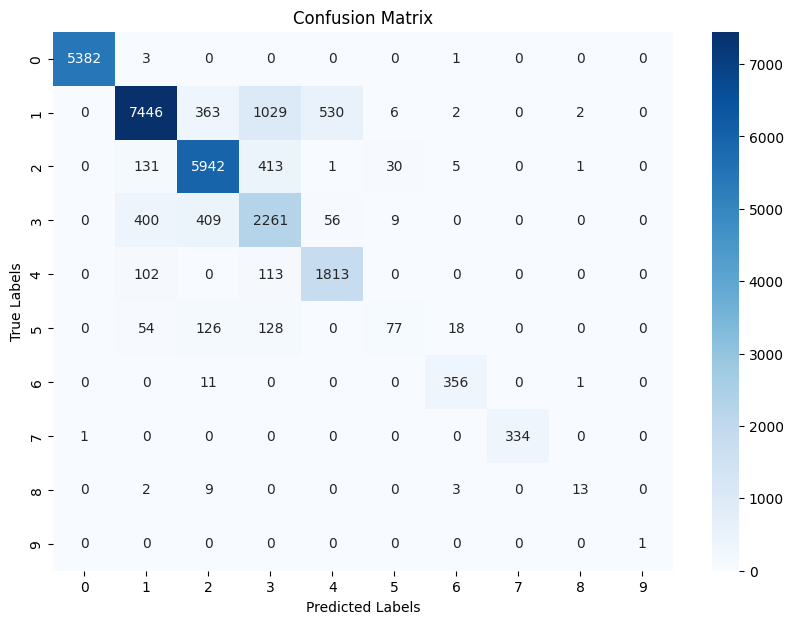

In [76]:
# Initialize the global ResNet model
global_net = to_device(FederatedResNet(), device)

# Federated learning loop
history = []
for i in range(rounds):
    print('Start Round {} ...'.format(i + 1))
    curr_parameters = global_net.get_parameters()
    new_parameters = dict([(layer_name, {'weight': 0, 'bias': 0}) for layer_name in curr_parameters])
    
    for client in clients:
        client_parameters = client.train(curr_parameters)
        fraction = client.get_dataset_size() / total_train_size
        for layer_name in client_parameters:
            new_parameters[layer_name]['weight'] += fraction * client_parameters[layer_name]['weight']
            new_parameters[layer_name]['bias'] += fraction * client_parameters[layer_name]['bias']
    
    # Apply the aggregated parameters to the global model
    global_net.apply_parameters(new_parameters)
    
    # Evaluate the global model on the training, development, and testing datasets
    train_loss, train_acc, train_labels, train_preds = global_net.evaluate(train_dataset)
    dev_loss, dev_acc, dev_labels, dev_preds = global_net.evaluate(dev_dataset)
    test_loss, test_acc, test_labels, test_preds = global_net.evaluate(test_dataset)
    
    # Print results for the current round
    print('After round {}, train_loss = {:.4f}, train_acc = {:.4f}, dev_loss = {:.4f}, dev_acc = {:.4f}, test_loss = {:.4f}, test_acc = {:.4f}'.format(
        i + 1, train_loss, train_acc, dev_loss, dev_acc, test_loss, test_acc
    ))
    
    # Append results to history
    history.append({
        'round': i + 1,
        'train_loss': train_loss,
        'train_acc': train_acc,
        'dev_loss': dev_loss,
        'dev_acc': dev_acc,
        'test_loss': test_loss,
        'test_acc': test_acc
    })
    
    # Print classification reports and confusion matrices
    print("Training Data:")
    print_classification_report_and_confusion_matrix(train_labels, train_preds, classes)

    print("Development Data:")
    print_classification_report_and_confusion_matrix(dev_labels, dev_preds, classes)
    
    print("Test Data:")
    print_classification_report_and_confusion_matrix(test_labels, test_preds, classes)

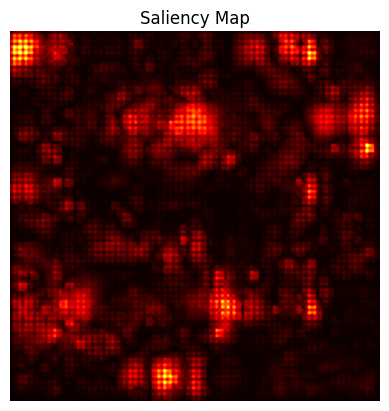

In [77]:
def compute_saliency_map(model, image, label):
    model.eval()
    image = image.unsqueeze(0).to(device)  # Add batch dimension
    image.requires_grad_()
    label = torch.tensor([label]).to(device)
    
    output = model(image)
    loss = F.cross_entropy(output, label)
    model.zero_grad()
    loss.backward()
    
    saliency, _ = torch.max(image.grad.data.abs(), dim=1)
    return saliency[0].cpu().numpy()

# Example usage with a sample image and label
sample_image, sample_label = train_dataset[0]
saliency_map = compute_saliency_map(global_net, sample_image, sample_label)

plt.imshow(saliency_map, cmap='hot')
plt.axis('off')
plt.title('Saliency Map')
plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

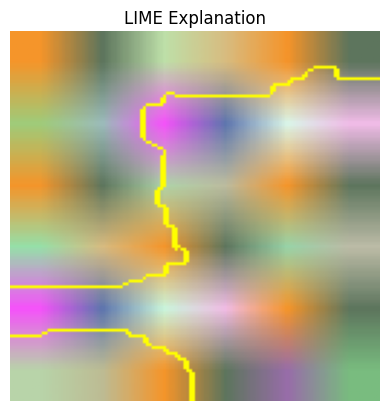

In [78]:

def lime_explanation(model, image, label):
    def predict_fn(images):
        images = torch.stack([transforms.ToTensor()(img) for img in images]).to(device)
        with torch.no_grad():
            outputs = model(images)
        return F.softmax(outputs, dim=1).cpu().numpy()

    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(image.numpy().transpose(1, 2, 0), predict_fn, top_labels=10, hide_color=0, num_samples=1000)
    
    temp, mask = explanation.get_image_and_mask(label, positive_only=True, num_features=5, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.axis('off')
    plt.title('LIME Explanation')
    plt.show()

# Example usage with a sample image and label
sample_image, sample_label = train_dataset[0]
lime_explanation(global_net, sample_image, sample_label)

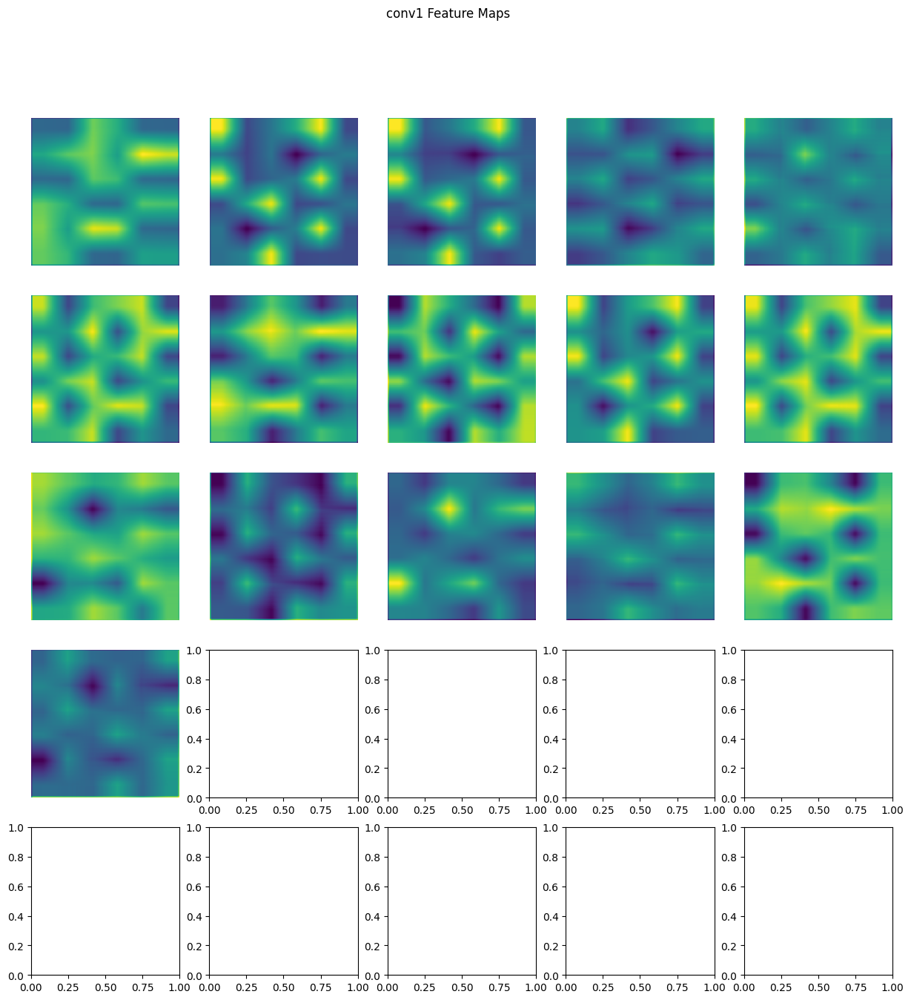

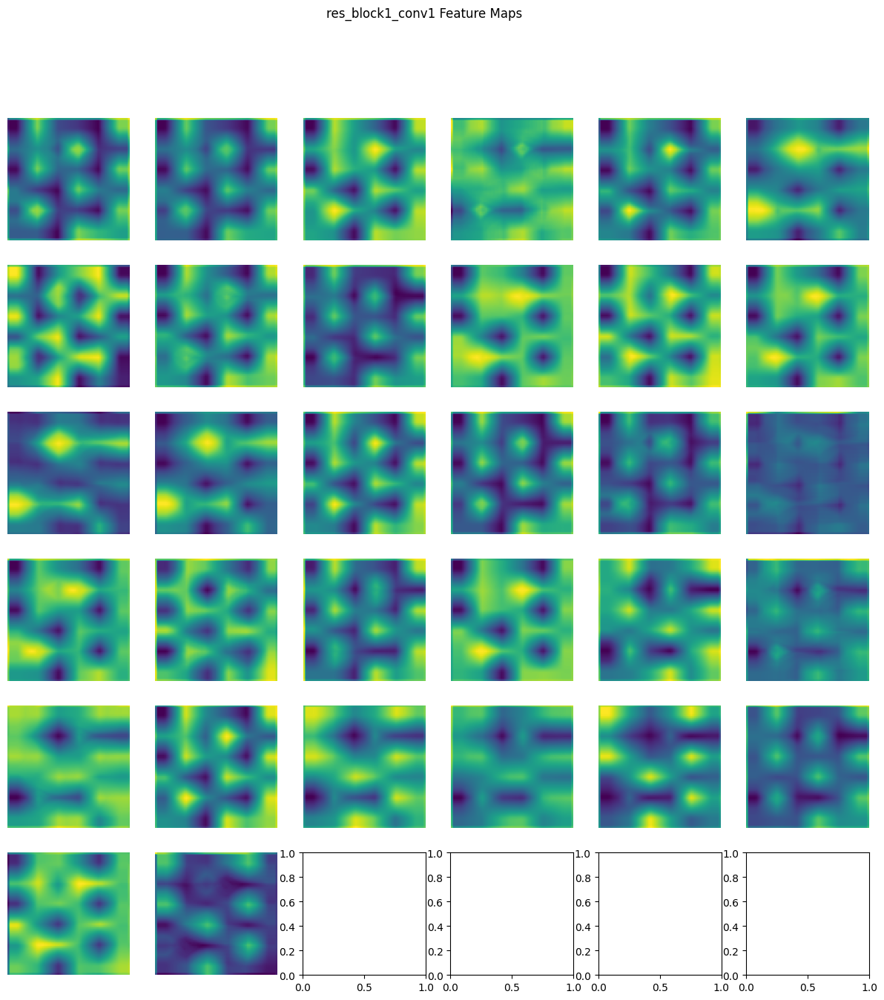

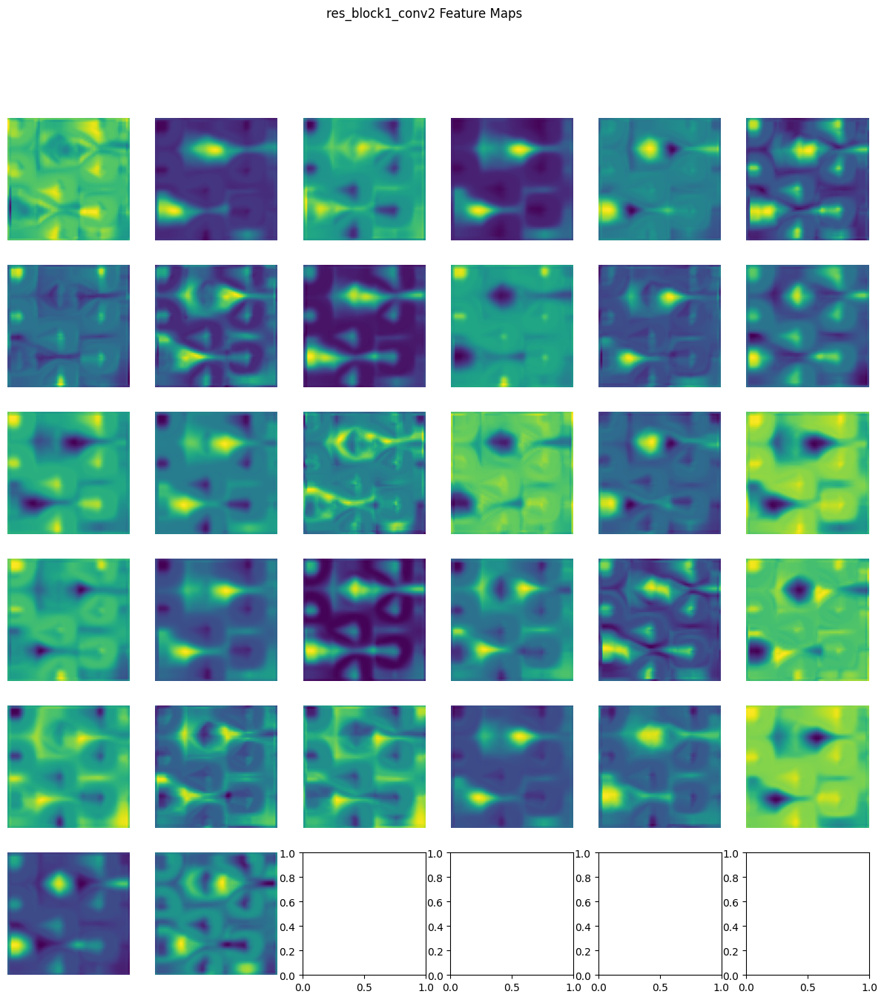

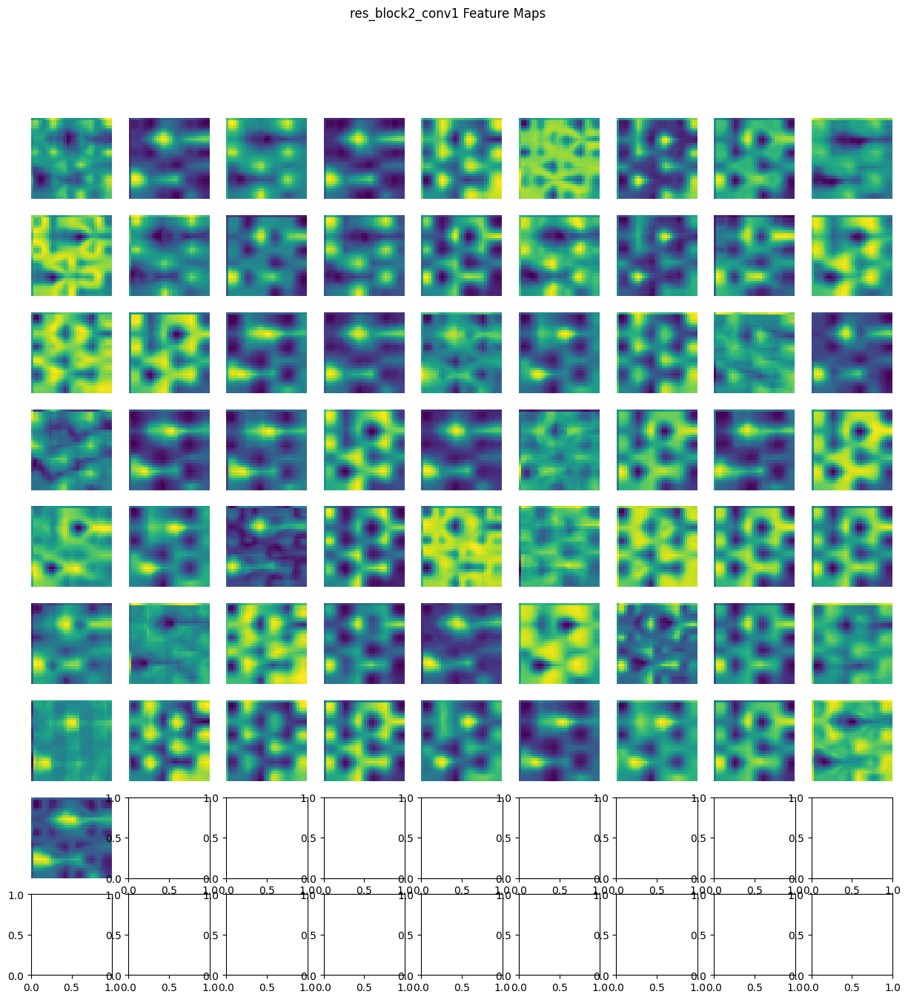

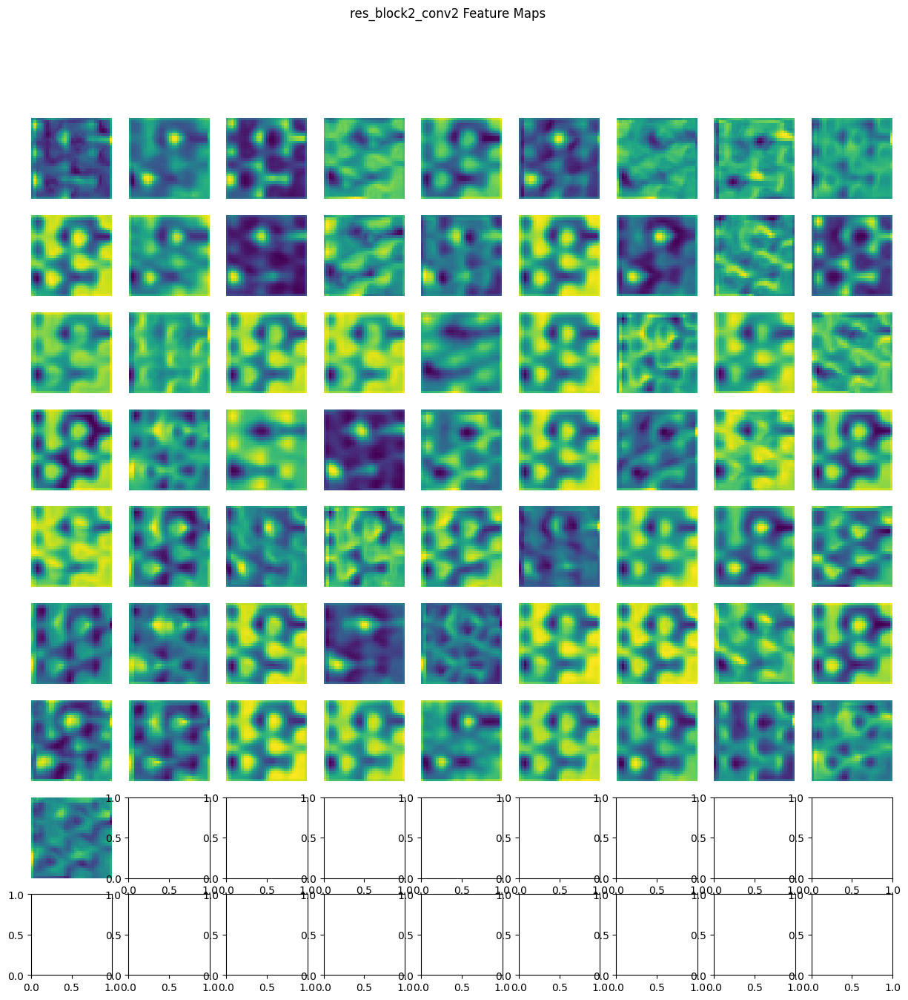

In [80]:
def visualize_conv1_feature_maps(model, image):
    model.eval()
    with torch.no_grad():
        x = image.unsqueeze(0).to(device)
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.cpu())
        
        # Hook the first convolutional layer (conv1)
        hook = model.track_layers['conv1'].register_forward_hook(hook_fn)
        
        _ = model(x)
        
        hook.remove()  # Remove the hook after the forward pass
        
        # Plot the feature maps
        fmap = feature_maps[0][0]  # Remove batch dimension
        num_features = fmap.size(0)
        grid_size = int(num_features ** 0.5) + 1
        fig, axarr = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        fig.suptitle('conv1 Feature Maps')
        for j in range(num_features):
            ax = axarr[j // grid_size, j % grid_size]
            ax.imshow(fmap[j].numpy(), cmap='viridis')
            ax.axis('off')
        plt.show()

# Example usage with a sample image
sample_image, _ = train_dataset[0]
visualize_conv1_feature_maps(global_net, sample_image)

def visualize_res_block1_conv1_feature_maps(model, image):
    model.eval()
    with torch.no_grad():
        x = image.unsqueeze(0).to(device)
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.cpu())
        
        # Hook the first convolutional layer of the first residual block
        hook = model.track_layers['res_block1_conv1'].register_forward_hook(hook_fn)
        
        _ = model(x)
        
        hook.remove()  # Remove the hook after the forward pass
        
        # Plot the feature maps
        fmap = feature_maps[0][0]  # Remove batch dimension
        num_features = fmap.size(0)
        grid_size = int(num_features ** 0.5) + 1
        fig, axarr = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        fig.suptitle('res_block1_conv1 Feature Maps')
        for j in range(num_features):
            ax = axarr[j // grid_size, j % grid_size]
            ax.imshow(fmap[j].numpy(), cmap='viridis')
            ax.axis('off')
        plt.show()

# Example usage with a sample image
sample_image, _ = train_dataset[0]
visualize_res_block1_conv1_feature_maps(global_net, sample_image)

def visualize_res_block1_conv2_feature_maps(model, image):
    model.eval()
    with torch.no_grad():
        x = image.unsqueeze(0).to(device)
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.cpu())
        
        # Hook the second convolutional layer of the first residual block
        hook = model.track_layers['res_block1_conv2'].register_forward_hook(hook_fn)
        
        _ = model(x)
        
        hook.remove()  # Remove the hook after the forward pass
        
        # Plot the feature maps
        fmap = feature_maps[0][0]  # Remove batch dimension
        num_features = fmap.size(0)
        grid_size = int(num_features ** 0.5) + 1
        fig, axarr = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        fig.suptitle('res_block1_conv2 Feature Maps')
        for j in range(num_features):
            ax = axarr[j // grid_size, j % grid_size]
            ax.imshow(fmap[j].numpy(), cmap='viridis')
            ax.axis('off')
        plt.show()

# Example usage with a sample image
sample_image, _ = train_dataset[0]
visualize_res_block1_conv2_feature_maps(global_net, sample_image)

def visualize_res_block2_conv1_feature_maps(model, image):
    model.eval()
    with torch.no_grad():
        x = image.unsqueeze(0).to(device)
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.cpu())
        
        # Hook the first convolutional layer of the second residual block
        hook = model.track_layers['res_block2_conv1'].register_forward_hook(hook_fn)
        
        _ = model(x)
        
        hook.remove()  # Remove the hook after the forward pass
        
        # Plot the feature maps
        fmap = feature_maps[0][0]  # Remove batch dimension
        num_features = fmap.size(0)
        grid_size = int(num_features ** 0.5) + 1
        fig, axarr = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        fig.suptitle('res_block2_conv1 Feature Maps')
        for j in range(num_features):
            ax = axarr[j // grid_size, j % grid_size]
            ax.imshow(fmap[j].numpy(), cmap='viridis')
            ax.axis('off')
        plt.show()

# Example usage with a sample image
sample_image, _ = train_dataset[0]
visualize_res_block2_conv1_feature_maps(global_net, sample_image)

def visualize_res_block2_conv2_feature_maps(model, image):
    model.eval()
    with torch.no_grad():
        x = image.unsqueeze(0).to(device)
        feature_maps = []
        
        def hook_fn(module, input, output):
            feature_maps.append(output.cpu())
        
        # Hook the second convolutional layer of the second residual block
        hook = model.track_layers['res_block2_conv2'].register_forward_hook(hook_fn)
        
        _ = model(x)
        
        hook.remove()  # Remove the hook after the forward pass
        
        # Plot the feature maps
        fmap = feature_maps[0][0]  # Remove batch dimension
        num_features = fmap.size(0)
        grid_size = int(num_features ** 0.5) + 1
        fig, axarr = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        fig.suptitle('res_block2_conv2 Feature Maps')
        for j in range(num_features):
            ax = axarr[j // grid_size, j % grid_size]
            ax.imshow(fmap[j].numpy(), cmap='viridis')
            ax.axis('off')
        plt.show()

# Example usage with a sample image
sample_image, _ = train_dataset[0]
visualize_res_block2_conv2_feature_maps(global_net, sample_image)

Final Model on Test Data:
Test Loss: 0.3178
Test Accuracy: 0.8563
Test Data:
Classification Report:
               precision    recall  f1-score   support

           0     0.9998    0.9993    0.9995      5386
           1     0.9150    0.7940    0.8502      9378
           2     0.8662    0.9109    0.8880      6523
           3     0.5733    0.7212    0.6388      3135
           4     0.7554    0.8940    0.8189      2028
           5     0.6311    0.1911    0.2933       403
           6     0.9247    0.9674    0.9456       368
           7     1.0000    0.9970    0.9985       335
           8     0.7647    0.4815    0.5909        27
           9     1.0000    1.0000    1.0000         1

    accuracy                         0.8565     27584
   macro avg     0.8430    0.7956    0.8024     27584
weighted avg     0.8663    0.8565    0.8567     27584



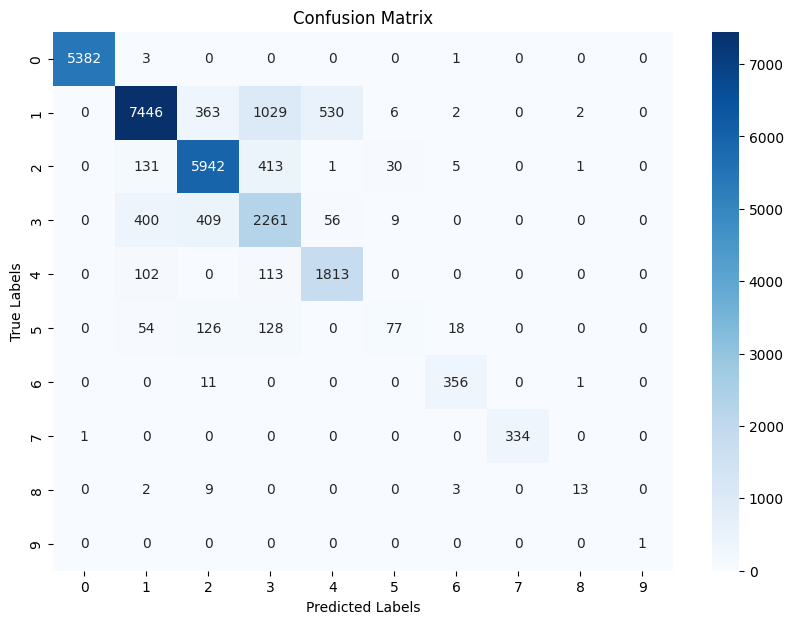

In [81]:
# Evaluate the final model on the test dataset
test_loss, test_acc, test_labels, test_preds = global_net.evaluate(test_dataset)

# Print the final accuracy
print('Final Model on Test Data:')
print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_acc:.4f}')

# Print the classification report and confusion matrix
print("Test Data:")
print_classification_report_and_confusion_matrix(test_labels, test_preds, num_classes)

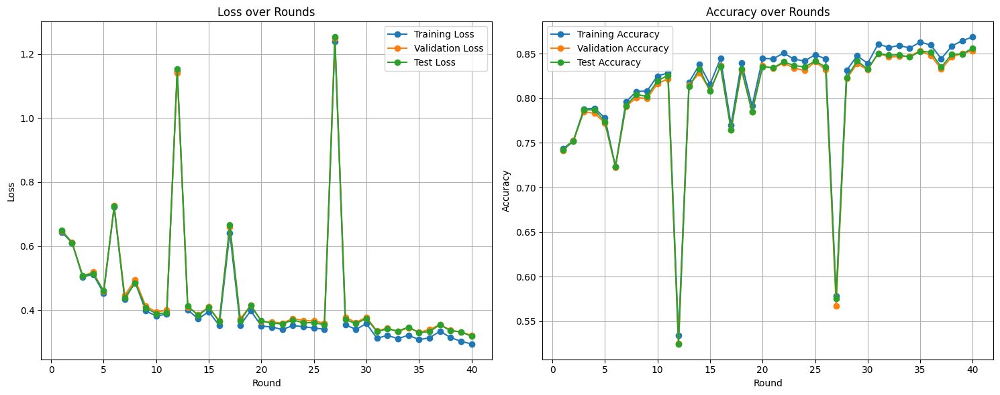

In [82]:
# After the federated learning rounds
def plot_history(history):
    rounds = [entry['round'] for entry in history]
    train_losses = [entry['train_loss'] for entry in history]
    train_accs = [entry['train_acc'] for entry in history]
    dev_losses = [entry['dev_loss'] for entry in history]
    dev_accs = [entry['dev_acc'] for entry in history]
    test_losses = [entry['test_loss'] for entry in history]
    test_accs = [entry['test_acc'] for entry in history]
    
    plt.figure(figsize=(15, 6))
    
    # Plot Losses
    plt.subplot(1, 2, 1)
    plt.plot(rounds, train_losses, marker='o', label='Training Loss')
    plt.plot(rounds, dev_losses, marker='o', label='Validation Loss')
    plt.plot(rounds, test_losses, marker='o', label='Test Loss')
    plt.xlabel('Round')
    plt.ylabel('Loss')
    plt.title('Loss over Rounds')
    plt.legend()
    plt.grid(True)

    # Plot Accuracies
    plt.subplot(1, 2, 2)
    plt.plot(rounds, train_accs, marker='o', label='Training Accuracy')
    plt.plot(rounds, dev_accs, marker='o', label='Validation Accuracy')
    plt.plot(rounds, test_accs, marker='o', label='Test Accuracy')
    plt.xlabel('Round')
    plt.ylabel('Accuracy')
    plt.title('Accuracy over Rounds')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Call the function to plot the history
plot_history(history)